# Imports

In [ ]:
pip install fredapi

In [ ]:
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from fredapi import Fred

from sklearn.preprocessing import MinMaxScaler

# Combining of Data from multiple sources
- Clean the data + remove outliers in each section

## Traditional Stock Metrics

In [ ]:
def obtain_stock_dataframe(tickerSymbol, start_year, end_year):
  tickerData = yf.Ticker(tickerSymbol)
  tickerDf_daily = tickerData.history(start=f'{start_year}-01-01', end=f'{end_year}-12-31', interval='1d').reset_index()

  # Calculate rolling mean
  tickerDf_daily['20_day_SMA'] = tickerDf_daily['Close'].rolling(window=20).mean()

  # Calculating RSI
  window_length = 14
  delta = tickerDf_daily['Close'].diff()
  up, down = delta.clip(lower=0), -1 * delta.clip(upper=0)

  # Calculate the EWMA
  roll_up = up.ewm(span=window_length).mean()
  roll_down = down.ewm(span=window_length).mean()

  # Calculate the RSI based on EWMA
  RS = roll_up / roll_down
  tickerDf_daily['RSI'] = 100.0 - (100.0 / (1.0 + RS))

  # Calculating ROC
  roc_window = 12
  tickerDf_daily['ROC'] = tickerDf_daily['Close'].pct_change(periods=roc_window) * 100

  # Calculating Volatility (standard deviation of closing prices)
  volatility_window = 14
  tickerDf_daily['Volatility'] = tickerDf_daily['Close'].rolling(window=volatility_window).std()

  # Filter out rows with NaNs that resulted from the lagging
  tickerDf_daily = tickerDf_daily.dropna()
  return tickerDf_daily

In [ ]:
# obtain stock metrics for 6 randomly selected assets in magnificent 7
# 2003 is the earliest we can go in order for these 4 stocks to have the same number of rows
aapl_df = obtain_stock_dataframe('AAPL', 2003, 2024)
amzn_df = obtain_stock_dataframe('AMZN', 2003, 2024)
msft_df = obtain_stock_dataframe('MSFT', 2003, 2024)
nflx_df = obtain_stock_dataframe('NFLX', 2003, 2024)

# META, TSLA and GOOG has limited data that doesnt extent to this entire range of dates supplied, so we wont use them to train

# Ensure the shape of all dfs are the same so their metrics can be aggregated
print(aapl_df.shape)
print(amzn_df.shape)
print(msft_df.shape)
print(nflx_df.shape)

(5339, 12)
(5339, 12)
(5339, 12)
(5339, 12)


In [ ]:
date_column = aapl_df[['Date']]
print(type(date_column))
print(date_column.shape)

# create index
date_column['common_index'] = range(1, len(date_column) + 1)
date_column.head()

<class 'pandas.core.frame.DataFrame'>
(5339, 1)


<ipython-input-5-3fb7b4b486dc>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  date_column['common_index'] = range(1, len(date_column) + 1)


,Date,common_index
19,2003-01-30 00:00:00-05:00,1
20,2003-01-31 00:00:00-05:00,2
21,2003-02-03 00:00:00-05:00,3
22,2003-02-04 00:00:00-05:00,4
23,2003-02-05 00:00:00-05:00,5


In [ ]:
combined_df = pd.concat([aapl_df, amzn_df, msft_df, nflx_df])
combined_df = combined_df.drop(columns=['Date'])

median_df = combined_df.groupby(level=0).median()

# create index
median_df['common_index'] = range(1, len(median_df) + 1)
print(median_df.shape)
median_df.head()

(5339, 12)


,Open,High,Low,Close,Volume,Dividends,Stock Splits,20_day_SMA,RSI,ROC,Volatility,common_index
19,1.001429,1.015714,0.984322,0.996571,103595700.0,0.0,0.0,0.960555,51.488755,-1.558616,0.025091,1
20,0.993857,1.029965,0.984000,1.017678,116054200.0,0.0,0.0,0.966530,52.307202,-2.812426,0.027933,2
21,1.017785,1.031714,0.991928,1.011143,92019900.0,0.0,0.0,0.972116,59.089025,0.549960,0.029105,3
22,0.998500,1.008857,0.969607,0.990535,89103400.0,0.0,0.0,0.975946,52.132631,0.505038,0.027086,4
23,0.992357,1.005357,0.972893,0.980678,103967000.0,0.0,0.0,0.978454,46.160439,3.040205,0.027064,5


In [ ]:
aggregated_df = pd.merge(date_column, median_df, on='common_index', how='inner')
aggregated_df.head()

,Date,common_index,Open,High,Low,Close,Volume,Dividends,Stock Splits,20_day_SMA,RSI,ROC,Volatility
0,2003-01-30 00:00:00-05:00,1,1.001429,1.015714,0.984322,0.996571,103595700.0,0.0,0.0,0.960555,51.488755,-1.558616,0.025091
1,2003-01-31 00:00:00-05:00,2,0.993857,1.029965,0.984000,1.017678,116054200.0,0.0,0.0,0.966530,52.307202,-2.812426,0.027933
2,2003-02-03 00:00:00-05:00,3,1.017785,1.031714,0.991928,1.011143,92019900.0,0.0,0.0,0.972116,59.089025,0.549960,0.029105
3,2003-02-04 00:00:00-05:00,4,0.998500,1.008857,0.969607,0.990535,89103400.0,0.0,0.0,0.975946,52.132631,0.505038,0.027086
4,2003-02-05 00:00:00-05:00,5,0.992357,1.005357,0.972893,0.980678,103967000.0,0.0,0.0,0.978454,46.160439,3.040205,0.027064


In [ ]:
aggregated_df_final = aggregated_df.copy()
aggregated_df_final['Date'] = aggregated_df_final['Date'].dt.tz_localize(None) # Localise Timezone
aggregated_df_final.head()

,Date,common_index,Open,High,Low,Close,Volume,Dividends,Stock Splits,20_day_SMA,RSI,ROC,Volatility
0,2003-01-30,1,1.001429,1.015714,0.984322,0.996571,103595700.0,0.0,0.0,0.960555,51.488755,-1.558616,0.025091
1,2003-01-31,2,0.993857,1.029965,0.984000,1.017678,116054200.0,0.0,0.0,0.966530,52.307202,-2.812426,0.027933
2,2003-02-03,3,1.017785,1.031714,0.991928,1.011143,92019900.0,0.0,0.0,0.972116,59.089025,0.549960,0.029105
3,2003-02-04,4,0.998500,1.008857,0.969607,0.990535,89103400.0,0.0,0.0,0.975946,52.132631,0.505038,0.027086
4,2003-02-05,5,0.992357,1.005357,0.972893,0.980678,103967000.0,0.0,0.0,0.978454,46.160439,3.040205,0.027064


## Economic Indicators

In [ ]:
fred = Fred(api_key='490e7c39356fa7bb50f59a71b224d6a3')

CCSA = fred.get_series('CCSA', observation_start='	2003-01-30', observation_end='2024-12-31')
df_CCSA = pd.DataFrame({'Date' : CCSA.index, 'CCSA' : CCSA.values})

DGORDER = fred.get_series('DGORDER', observation_start='	2003-01-30', observation_end='2024-12-31')
df_DGORDER = pd.DataFrame({'Date' : DGORDER.index, 'DGORDER' : DGORDER.values})

T10Y2Y = fred.get_series('T10Y2Y', observation_start='	2003-01-30', observation_end='2024-12-31')
df_T10Y2Y = pd.DataFrame({'Date' : T10Y2Y.index, 'T10Y2Y' : T10Y2Y.values})

df_economic = pd.merge(df_T10Y2Y, df_CCSA, on = "Date", how= "outer").merge(df_DGORDER, on = "Date", how= "outer").sort_values(by="Date").reset_index(drop = True)
df_economic = df_economic.fillna(method = 'bfill') # fill missing values with next data point
df_economic = df_economic.fillna(method = 'ffill') # fill missing values with prev data point

df_economic['Date'] = df_economic['Date'].dt.tz_localize(None) # Localise Timezone

aggregated_df_final = pd.merge(aggregated_df_final, df_economic, on = "Date", how = "outer")
aggregated_df_final = aggregated_df_final.sort_values(by='Date').reset_index(drop=True)
aggregated_df_final.head()


,Date,common_index,Open,High,Low,Close,Volume,Dividends,Stock Splits,20_day_SMA,RSI,ROC,Volatility,T10Y2Y,CCSA,DGORDER
0,2003-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.30,3368000.0,169994.0
1,2003-01-30,1.0,1.001429,1.015714,0.984322,0.996571,103595700.0,0.0,0.0,0.960555,51.488755,-1.558616,0.025091,2.30,3368000.0,174113.0
2,2003-01-31,2.0,0.993857,1.029965,0.984000,1.017678,116054200.0,0.0,0.0,0.966530,52.307202,-2.812426,0.027933,2.28,3368000.0,174113.0
3,2003-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.29,3368000.0,174113.0
4,2003-02-03,3.0,1.017785,1.031714,0.991928,1.011143,92019900.0,0.0,0.0,0.972116,59.089025,0.549960,0.029105,2.29,3457000.0,172245.0


## Financial News Sentiment Analysis

In [ ]:
import gdown

# Set the file names and IDs
# For News Reviews Data
news_file_ids = {
    "AAPL_AllNews.csv" : "1NPZJRGn2H5VPwu9s8ss9EsRrNndD11Gz",
    "AMZN_AllNews.csv" : "1gJbNGictmhVEkF9hhyYeeA6BpuaXtPhR",
    "MSFT_AllNews.csv" : "1-f7cZ5LmDBr1fSZgn0BytkzqNzKF4AP8",
    "NFLX_AllNews.csv" : "1Y6rC5Y-rLfWkmJHhIrlM4K8xPt1n79Dd"
}

for filename, file_id in news_file_ids.items():
  gdown.download(f"https://drive.google.com/uc?id={file_id}", filename, quiet=False)


Downloading...
From (original): https://drive.google.com/uc?id=1NPZJRGn2H5VPwu9s8ss9EsRrNndD11Gz
From (redirected): https://drive.google.com/uc?id=1NPZJRGn2H5VPwu9s8ss9EsRrNndD11Gz&confirm=t&uuid=f0f94783-f240-441e-8151-46f08bb85371
To: /content/AAPL_AllNews.csv
100%|██████████| 3.06M/3.06M [00:00<00:00, 160MB/s]
Downloading...
From: https://drive.google.com/uc?id=1gJbNGictmhVEkF9hhyYeeA6BpuaXtPhR
To: /content/AMZN_AllNews.csv
100%|██████████| 2.97M/2.97M [00:00<00:00, 132MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-f7cZ5LmDBr1fSZgn0BytkzqNzKF4AP8
To: /content/MSFT_AllNews.csv
100%|██████████| 3.05M/3.05M [00:00<00:00, 154MB/s]
Downloading...
From: https://drive.google.com/uc?id=1Y6rC5Y-rLfWkmJHhIrlM4K8xPt1n79Dd
To: /content/NFLX_AllNews.csv
100%|██████████| 2.44M/2.44M [00:00<00:00, 197MB/s]


In [ ]:
import requests
import pandas as pd
from datetime import datetime

# from transformers import BertTokenizer, BertForSequenceClassification
# from transformers import pipeline

aggregated_df_copy = aggregated_df_final.copy()
tickers = ['AMZN','MSFT','AAPL','NFLX']
final_df = pd.DataFrame()

for ticker in tickers:

    df = pd.read_csv(f'{ticker}_AllNews.csv')

    df['published_utc'] = pd.to_datetime(df['published_utc'])
    df[f'{ticker}_Sentiment Score'] = df.apply(lambda row: -row[f'{ticker}_Sentiment Score'] if row[f'{ticker}_Sentiment Label'] == 'Negative' else row[f'{ticker}_Sentiment Score'], axis=1)


    def get_sentiment_label(score):
        if score > 0.6:  # You can adjust the threshold as needed
            return 'Positive'
        elif score < 0:
            return 'Negative'
        else:
            return 'Neutral'

    # Group by the 'date' column and aggregate the sentiment scores
    aggregated_df = df.groupby(df['published_utc'].dt.date).agg({
        f'{ticker}_Sentiment Score': 'mean',  #  the average score
    }).reset_index()

    # Apply the function to get sentiment label
    aggregated_df[f'{ticker}_Sentiment Label'] = aggregated_df[f'{ticker}_Sentiment Score'].apply(get_sentiment_label)

    if final_df.empty:
        final_df = aggregated_df
    else:
        final_df = pd.merge_ordered(aggregated_df,final_df, on = 'published_utc')

 # Localise Timezone
final_df['Date'] = pd.to_datetime(final_df['published_utc'], format='%Y-%m-%d %H:%M:%S').dt.tz_localize(None)
final_df = final_df.drop(columns = ['published_utc'])

aggregated_df_copy = pd.merge(aggregated_df_copy, final_df, on = "Date", how = "outer")
aggregated_df_copy = aggregated_df_copy.sort_values(by='Date').reset_index(drop=True)
for ticker in tickers:
    mean_score = aggregated_df_copy[f'{ticker}_Sentiment Score'].mean()
    aggregated_df_copy[f'{ticker}_Sentiment Score'] = aggregated_df_copy[f'{ticker}_Sentiment Score'].fillna(mean_score)
    aggregated_df_copy[f'{ticker}_Sentiment Label'] = aggregated_df_copy[f'{ticker}_Sentiment Score'].apply(get_sentiment_label)

aggregated_df_copy.head()

,Date,common_index,Open,High,Low,Close,Volume,Dividends,Stock Splits,20_day_SMA,...,CCSA,DGORDER,NFLX_Sentiment Score,NFLX_Sentiment Label,AAPL_Sentiment Score,AAPL_Sentiment Label,MSFT_Sentiment Score,MSFT_Sentiment Label,AMZN_Sentiment Score,AMZN_Sentiment Label
0,2003-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3368000.0,169994.0,0.71115,Positive,0.64978,Positive,0.721043,Positive,0.670605,Positive
1,2003-01-30,1.0,1.001429,1.015714,0.984322,0.996571,103595700.0,0.0,0.0,0.960555,...,3368000.0,174113.0,0.71115,Positive,0.64978,Positive,0.721043,Positive,0.670605,Positive
2,2003-01-31,2.0,0.993857,1.029965,0.984000,1.017678,116054200.0,0.0,0.0,0.966530,...,3368000.0,174113.0,0.71115,Positive,0.64978,Positive,0.721043,Positive,0.670605,Positive
3,2003-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3368000.0,174113.0,0.71115,Positive,0.64978,Positive,0.721043,Positive,0.670605,Positive
4,2003-02-03,3.0,1.017785,1.031714,0.991928,1.011143,92019900.0,0.0,0.0,0.972116,...,3457000.0,172245.0,0.71115,Positive,0.64978,Positive,0.721043,Positive,0.670605,Positive


## Financial Reports Analysis

In [ ]:
import gdown

# Set the file names and IDs
# For Financial Reports Data
news_file_ids = {
    "aapl_processed_scores_final_switched.csv" : "1O_RQThj3AzW-Dh10jO7rd-BZ_rYaaiUN",
    "amzn_processed_scores_final_switched.csv" : "1Z8z0PT9XVephrOcK5YPqj2x4dkPTnuIa",
    "msft_processed_scores_final_switched.csv" : "1TvoJz4OnFRf3vhXHo_hOugknKrMZ5ZE1",
    "nflx_processed_scores_final_switched.csv" : "1sOFmQJnIBgPRAEBXbfRdxzjvjDWbngAF"
}

for filename, file_id in news_file_ids.items():
  gdown.download(f"https://drive.google.com/uc?id={file_id}", filename, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1O_RQThj3AzW-Dh10jO7rd-BZ_rYaaiUN
To: /content/aapl_processed_scores_final_switched.csv
100%|██████████| 17.7M/17.7M [00:00<00:00, 63.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=1Z8z0PT9XVephrOcK5YPqj2x4dkPTnuIa
To: /content/amzn_processed_scores_final_switched.csv
100%|██████████| 12.5M/12.5M [00:00<00:00, 44.1MB/s]
Downloading...
From: https://drive.google.com/uc?id=1TvoJz4OnFRf3vhXHo_hOugknKrMZ5ZE1
To: /content/msft_processed_scores_final_switched.csv
100%|██████████| 20.2M/20.2M [00:00<00:00, 31.9MB/s]
Downloading...
From: https://drive.google.com/uc?id=1sOFmQJnIBgPRAEBXbfRdxzjvjDWbngAF
To: /content/nflx_processed_scores_final_switched.csv
100%|██████████| 8.26M/8.26M [00:00<00:00, 37.6MB/s]


In [ ]:
aggregated_df_copy_final = aggregated_df_copy.copy()

target_folder = '/content/drive/MyDrive/BT4222_TS_Group5/Data/'

# read all final files
df_nflx = pd.read_csv('nflx_processed_scores_final_switched.csv')
df_msft= pd.read_csv('msft_processed_scores_final_switched.csv')
df_amzn= pd.read_csv('amzn_processed_scores_final_switched.csv')
df_aapl= pd.read_csv('aapl_processed_scores_final_switched.csv')

concatenated_df = pd.concat([df_aapl, df_amzn, df_nflx, df_msft])

# columns that need to find mean
columns = ['positive_count', 'total_positive_score', 'negative_count', 'total_negative_score', 'count', 'avg_sentiment_score']
modified_columns = ['RF_' + col for col in columns] + ['MDA_' + col for col in columns]

# find mean for each column in list, track tickers involved in list
aggregations = {col: 'mean' for col in modified_columns}
aggregations['ticker'] = list

grouped_df = concatenated_df.groupby('periodOfReport').agg(aggregations).reset_index()
grouped_df.rename(columns={'periodOfReport': 'Date'}, inplace=True)

grouped_df['Date'] = pd.to_datetime(grouped_df['Date'], format='%Y-%m-%d').dt.tz_localize(None)
# grouped_df = grouped_df.drop(columns = ['Date'])

# merge with main
df_merged = pd.merge(aggregated_df_copy_final, grouped_df, on='Date', how='outer' )

In [ ]:
pd.set_option('display.max_columns', 500)
print(df_merged.shape)
df_merged.head()

(6757, 37)


,Date,common_index,Open,High,Low,Close,Volume,Dividends,Stock Splits,20_day_SMA,RSI,ROC,Volatility,T10Y2Y,CCSA,DGORDER,NFLX_Sentiment Score,NFLX_Sentiment Label,AAPL_Sentiment Score,AAPL_Sentiment Label,MSFT_Sentiment Score,MSFT_Sentiment Label,AMZN_Sentiment Score,AMZN_Sentiment Label,RF_positive_count,RF_total_positive_score,RF_negative_count,RF_total_negative_score,RF_count,RF_avg_sentiment_score,MDA_positive_count,MDA_total_positive_score,MDA_negative_count,MDA_total_negative_score,MDA_count,MDA_avg_sentiment_score,ticker
0,2003-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.30,3368000.0,169994.0,0.71115,Positive,0.64978,Positive,0.721043,Positive,0.670605,Positive,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2003-01-30,1.0,1.001429,1.015714,0.984322,0.996571,103595700.0,0.0,0.0,0.960555,51.488755,-1.558616,0.025091,2.30,3368000.0,174113.0,0.71115,Positive,0.64978,Positive,0.721043,Positive,0.670605,Positive,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2003-01-31,2.0,0.993857,1.029965,0.984000,1.017678,116054200.0,0.0,0.0,0.966530,52.307202,-2.812426,0.027933,2.28,3368000.0,174113.0,0.71115,Positive,0.64978,Positive,0.721043,Positive,0.670605,Positive,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2003-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.29,3368000.0,174113.0,0.71115,Positive,0.64978,Positive,0.721043,Positive,0.670605,Positive,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2003-02-03,3.0,1.017785,1.031714,0.991928,1.011143,92019900.0,0.0,0.0,0.972116,59.089025,0.549960,0.029105,2.29,3457000.0,172245.0,0.71115,Positive,0.64978,Positive,0.721043,Positive,0.670605,Positive,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Data Cleaning

In [ ]:
df_clean = df_merged.copy()
print(df_clean.shape)

# Drop common_index column (was used earlier for joining)
df_clean = df_clean.drop(['common_index'], axis=1)

df_clean = df_clean.sort_values('Date')
df_clean.set_index('Date', inplace=True)

(6757, 37)


## Handling NaNs

In [ ]:
# Before handling nans
np.sum(df_clean.isna())

Open                        1418
High                        1418
Low                         1418
Close                       1418
Volume                      1418
Dividends                   1418
Stock Splits                1418
20_day_SMA                  1418
RSI                         1418
ROC                         1418
Volatility                  1418
T10Y2Y                        81
CCSA                          81
DGORDER                       81
NFLX_Sentiment Score          10
NFLX_Sentiment Label          10
AAPL_Sentiment Score          10
AAPL_Sentiment Label          10
MSFT_Sentiment Score          10
MSFT_Sentiment Label          10
AMZN_Sentiment Score          10
AMZN_Sentiment Label          10
RF_positive_count           6625
RF_total_positive_score     6625
RF_negative_count           6625
RF_total_negative_score     6625
RF_count                    6625
RF_avg_sentiment_score      6625
MDA_positive_count          6602
MDA_total_positive_score    6602
MDA_negati

In [ ]:
cols_to_fill = [
       'RF_positive_count', 'RF_total_positive_score',
       'RF_negative_count', 'RF_total_negative_score', 'RF_count',
       'RF_avg_sentiment_score', 'MDA_positive_count',
       'MDA_total_positive_score', 'MDA_negative_count',
       'MDA_total_negative_score', 'MDA_count', 'MDA_avg_sentiment_score',
       'T10Y2Y', 'CCSA', 'DGORDER',
       'NFLX_Sentiment Score', 'AAPL_Sentiment Score', 'MSFT_Sentiment Score', 'AMZN_Sentiment Score']

# backfill and forward fill to ensure that no NaNs remain
# First, backfill NaN values in the specified columns
df_clean[cols_to_fill] = df_clean[cols_to_fill].fillna(method='bfill')

# Then, forward fill any remaining NaNs in the same columns
df_clean[cols_to_fill] = df_clean[cols_to_fill].fillna(method='ffill')

In [ ]:
# ffill and linear interpolation to handle traditional stock metrics
cols_asset_indicators = ['Open', 'High', 'Low', 'Close', 'Volume', 'Dividends', 'Stock Splits', '20_day_SMA', 'RSI',	'ROC'	,'Volatility']
for i in cols_asset_indicators:
  df_clean[i] = df_clean[i].fillna(method='ffill')
  df_clean[i] = df_clean[i].interpolate(method='linear')

In [ ]:
# Fill with placeholder values i.e. Unknown
# cols: NFLX_Sentiment Label, AAPL_Sentiment Label, MSFT_Sentiment Label, AMZN_Sentiment Label
cols_to_fill_placeholder = ['NFLX_Sentiment Label', 'AAPL_Sentiment Label', 'MSFT_Sentiment Label', 'AMZN_Sentiment Label']

for column in cols_to_fill_placeholder:
  df_clean[column].fillna("Unknown", inplace=True)

In [ ]:
# drop ticker column
df_clean = df_clean.drop(['ticker'], axis=1)

In [ ]:
# drop remaining nan (only left 1)
df_clean = df_clean.dropna()
print(df_clean.shape)

(6756, 34)


In [ ]:
# reset index to see date again
df_clean = df_clean.reset_index()

In [ ]:
# After handling nans
np.sum(df_clean.isna())

Date                        0
Open                        0
High                        0
Low                         0
Close                       0
Volume                      0
Dividends                   0
Stock Splits                0
20_day_SMA                  0
RSI                         0
ROC                         0
Volatility                  0
T10Y2Y                      0
CCSA                        0
DGORDER                     0
NFLX_Sentiment Score        0
NFLX_Sentiment Label        0
AAPL_Sentiment Score        0
AAPL_Sentiment Label        0
MSFT_Sentiment Score        0
MSFT_Sentiment Label        0
AMZN_Sentiment Score        0
AMZN_Sentiment Label        0
RF_positive_count           0
RF_total_positive_score     0
RF_negative_count           0
RF_total_negative_score     0
RF_count                    0
RF_avg_sentiment_score      0
MDA_positive_count          0
MDA_total_positive_score    0
MDA_negative_count          0
MDA_total_negative_score    0
MDA_count 

## Handling dtype conversions

In [ ]:
df_clean.dtypes

Date                        datetime64[ns]
Open                               float64
High                               float64
Low                                float64
Close                              float64
Volume                             float64
Dividends                          float64
Stock Splits                       float64
20_day_SMA                         float64
RSI                                float64
ROC                                float64
Volatility                         float64
T10Y2Y                             float64
CCSA                               float64
DGORDER                            float64
NFLX_Sentiment Score               float64
NFLX_Sentiment Label                object
AAPL_Sentiment Score               float64
AAPL_Sentiment Label                object
MSFT_Sentiment Score               float64
MSFT_Sentiment Label                object
AMZN_Sentiment Score               float64
AMZN_Sentiment Label                object
RF_positive

In [ ]:
# Change columns with 'counts' to an int type - uncomment when error has been fixed
df_clean['RF_positive_count'] = df_clean['RF_positive_count'].astype('int')
df_clean['RF_negative_count'] = df_clean['RF_negative_count'].astype('int')
df_clean['RF_count'] = df_clean['RF_count'].astype('int')
df_clean['MDA_positive_count'] = df_clean['MDA_positive_count'].astype('int')
df_clean['MDA_negative_count'] = df_clean['MDA_negative_count'].astype('int')
df_clean['MDA_count'] = df_clean['MDA_count'].astype('int')

# Feature Engineering to handle feature imbalance -- binning

In [ ]:
# First check with columns are categorical
df_clean.nunique()

Date                        6756
Open                        5336
High                        5334
Low                         5331
Close                       5337
Volume                      5336
Dividends                      1
Stock Splits                   1
20_day_SMA                  5339
RSI                         5339
ROC                         5339
Volatility                  5339
T10Y2Y                       392
CCSA                         928
DGORDER                      253
NFLX_Sentiment Score         458
NFLX_Sentiment Label           4
AAPL_Sentiment Score         286
AAPL_Sentiment Label           4
MSFT_Sentiment Score         284
MSFT_Sentiment Label           4
AMZN_Sentiment Score         245
AMZN_Sentiment Label           4
RF_positive_count             17
RF_total_positive_score       96
RF_negative_count             67
RF_total_negative_score      127
RF_count                      92
RF_avg_sentiment_score       130
MDA_positive_count            61
MDA_total_

In [ ]:
categorical_cols = ['NFLX_Sentiment Label', 'AAPL_Sentiment Label', 'MSFT_Sentiment Label', 'AMZN_Sentiment Label']

for i in categorical_cols:
  print(i)
  print(df_clean[i].value_counts())
  print('*'*50)

NFLX_Sentiment Label
NFLX_Sentiment Label
Positive    6609
Neutral      102
Negative      35
Unknown       10
Name: count, dtype: int64
**************************************************
AAPL_Sentiment Label
AAPL_Sentiment Label
Positive    6661
Neutral       59
Negative      26
Unknown       10
Name: count, dtype: int64
**************************************************
MSFT_Sentiment Label
MSFT_Sentiment Label
Positive    6685
Neutral       49
Negative      12
Unknown       10
Name: count, dtype: int64
**************************************************
AMZN_Sentiment Label
AMZN_Sentiment Label
Positive    6679
Neutral       50
Negative      17
Unknown       10
Name: count, dtype: int64
**************************************************


In [ ]:
# Feature Engineering
# for all sentiment label columns, i will simply group it into 'Positive' and 'Non-positive'
df_clean['NFLX_Sentiment Label'] = np.where(df_clean['NFLX_Sentiment Label'] == 'Positive', 'Positive', 'Non-positive')
df_clean['AAPL_Sentiment Label'] = np.where(df_clean['AAPL_Sentiment Label'] == 'Positive', 'Positive', 'Non-positive')
df_clean['MSFT_Sentiment Label'] = np.where(df_clean['MSFT_Sentiment Label'] == 'Positive', 'Positive', 'Non-positive')
df_clean['AMZN_Sentiment Label'] = np.where(df_clean['AMZN_Sentiment Label'] == 'Positive', 'Positive', 'Non-positive')

In [ ]:
categorical_cols = ['NFLX_Sentiment Label', 'AAPL_Sentiment Label', 'MSFT_Sentiment Label', 'AMZN_Sentiment Label']

for i in categorical_cols:
  print(i)
  print(df_clean[i].value_counts())
  print('*'*50)

NFLX_Sentiment Label
NFLX_Sentiment Label
Positive        6609
Non-positive     147
Name: count, dtype: int64
**************************************************
AAPL_Sentiment Label
AAPL_Sentiment Label
Positive        6661
Non-positive      95
Name: count, dtype: int64
**************************************************
MSFT_Sentiment Label
MSFT_Sentiment Label
Positive        6685
Non-positive      71
Name: count, dtype: int64
**************************************************
AMZN_Sentiment Label
AMZN_Sentiment Label
Positive        6679
Non-positive      77
Name: count, dtype: int64
**************************************************


# Feature Selection

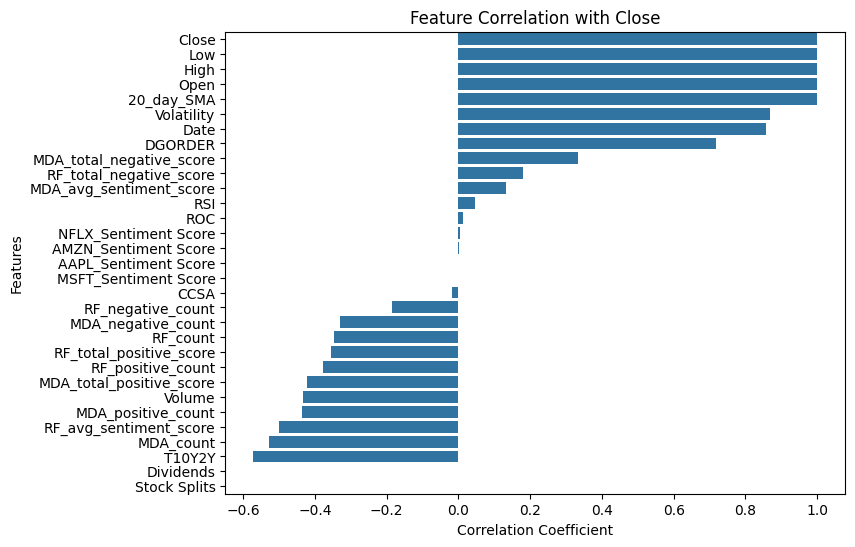

In [ ]:
# Plot correlation

import seaborn as sns
import matplotlib.pyplot as plt

corr_matrix = df_clean.drop(['NFLX_Sentiment Label', 'AAPL_Sentiment Label', 'MSFT_Sentiment Label', 'AMZN_Sentiment Label'], axis=1).corr()
target_corr = corr_matrix[['Close']].sort_values(by='Close', ascending=False)

plt.figure(figsize=(8, 6))
sns.barplot(x=target_corr['Close'], y=target_corr.index)
plt.title('Feature Correlation with Close')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Features')
plt.show()

In [ ]:
# remove cols with perfect correlation (corr=1) or 0 correlation
corr_cols_to_remove = [
    'Open', 'High', 'Low', '20_day_SMA', # corr = 1 - may cause perfect multicollinearity + data leak issues
    'ROC', 'CCSA', 'NFLX_Sentiment Score', 'AMZN_Sentiment Score', 'MSFT_Sentiment Score', 'AAPL_Sentiment Score',  # very low corr
    'Dividends', 'Stock Splits' # 0 correlation
]

df_sel = df_clean.copy()

# Final dataframe
df_sel = df_sel.drop(corr_cols_to_remove, axis = 1)
print(df_sel.shape)

# Final dataframe for Deep Learning Models
df_deep = df_clean.copy()

(6756, 23)


In [ ]:
# download if needed
# df_sel.to_csv('stock_prices.csv', index=False)

# EDA

In [ ]:
df_eda = df_clean.copy()

## OHCLV


<Axes: xlabel='Date', ylabel='Low'>

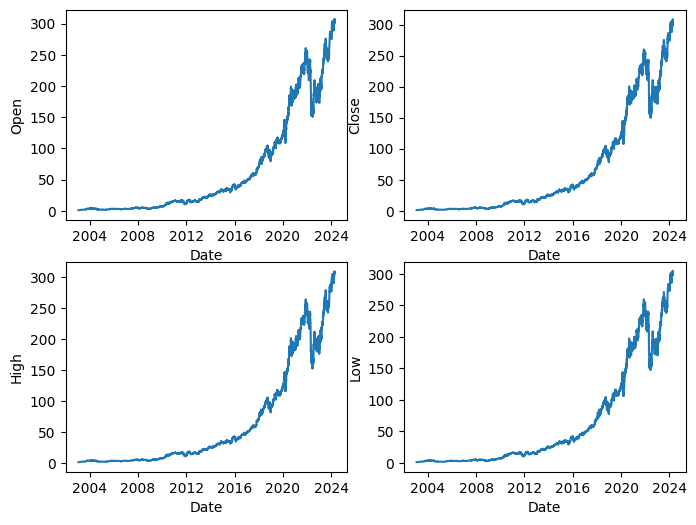

In [ ]:
fig,ax =  plt.subplots(2,2, figsize = (8,6))

df_eda['Date'] = pd.to_datetime(df_eda['Date'])

sns.lineplot(data = df_eda, x=df_eda['Date'], y=df_eda['Open'],ax= ax[0,0])
sns.lineplot(data = df_eda, x=df_eda['Date'], y=df_eda['Close'],ax= ax[0,1])
sns.lineplot(data = df_eda, x=df_eda['Date'], y=df_eda['High'],ax= ax[1,0])
sns.lineplot(data = df_eda, x=df_eda['Date'], y=df_eda['Low'],ax= ax[1,1])
# Observation: 'Open', 'Close', 'High', 'Low' follows the same trend over time

<Axes: xlabel='Volume'>

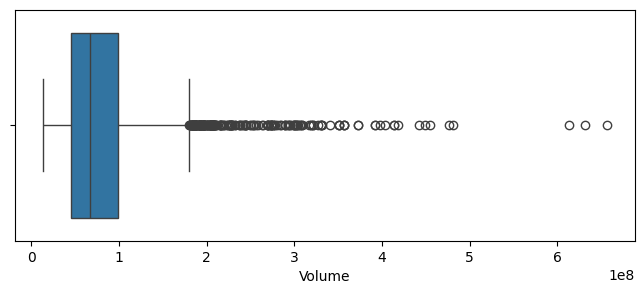

In [ ]:
#Time series plot of Volume shows too much fluctuations, no general trend
#Box Plot of Volume
plt.figure(figsize = (8,3))

sns.boxplot(x= df_eda['Volume'] )

## Volatility

<Axes: xlabel='Date', ylabel='Volatility'>

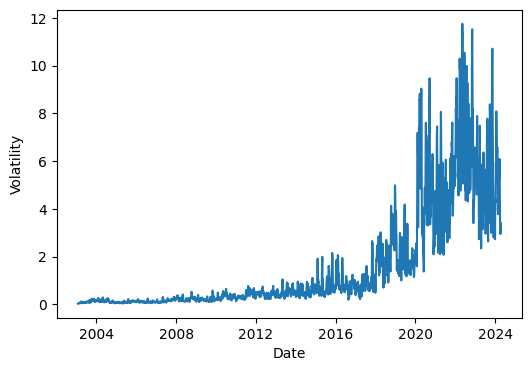

In [ ]:
plt.figure(figsize=(6,4))
sns.lineplot(data = df_eda, x=df_eda['Date'], y=df_eda['Volatility'])
#generally increasing trend with fluctuations

<Axes: xlabel='Date', ylabel='NFLX_Sentiment Score'>

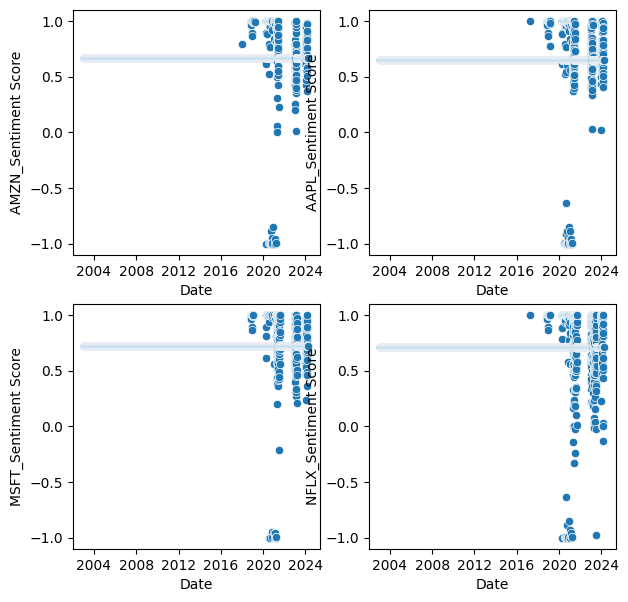

In [ ]:
fig, ax = plt.subplots(2, 2, figsize= (7,7))
sns.scatterplot(y= df_eda['AMZN_Sentiment Score'], x=df_eda['Date'], ax= ax[0,0])
sns.scatterplot(y= df_eda['AAPL_Sentiment Score'], x=df_eda['Date'], ax = ax[0,1])
sns.scatterplot(y= df_eda['MSFT_Sentiment Score'], x=df_eda['Date'], ax = ax[1,0])
sns.scatterplot(y= df_eda['NFLX_Sentiment Score'], x=df_eda['Date'], ax = ax[1,1])

# there are many negative sentiment scores

## T1012Y

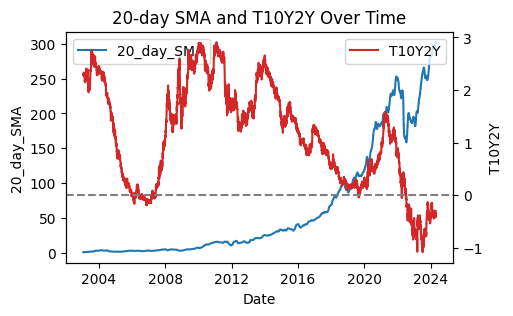

In [ ]:
fig, ax1 = plt.subplots(figsize=(5, 3))

color = 'tab:blue'
ax1.set_xlabel('Date')
ax1.set_ylabel('20_day_SMA')
ax1.plot(df_eda['Date'], df_eda['20_day_SMA'], color=color, label='20_day_SMA')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('T10Y2Y')
ax2.plot(df_eda['Date'], df_eda['T10Y2Y'], color=color, label='T10Y2Y')
ax2.axhline(y=0, color='gray', linestyle='--')

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.title('20-day SMA and T10Y2Y Over Time')
plt.show()

##Financial Report Sentiments

In [ ]:
# Convert form list to wide form
df_report_sentiments = grouped_df

df_report_sentiments['Date'] = pd.to_datetime(df_report_sentiments['Date'])
for ticker in ['AAPL', 'NFLX', 'AMZN', 'MSFT']:
    df_report_sentiments[ticker] = 0

for index, row in df_report_sentiments.iterrows():
    tickers_in_row = row['ticker']
    for ticker in tickers_in_row:
        df_report_sentiments.at[index, ticker] = 1

# Count per ticker
ticker_counts = df_report_sentiments[['AAPL', 'NFLX', 'AMZN', 'MSFT']].sum()
print(ticker_counts)


AAPL    84
NFLX    84
AMZN    84
MSFT    83
dtype: int64


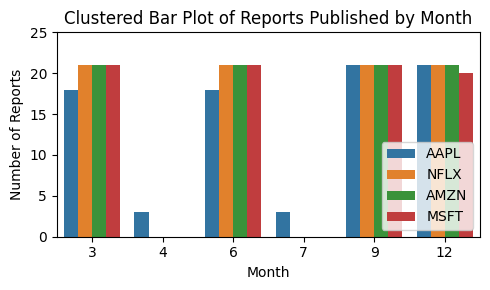

In [ ]:
cols_to_keep = ['Date','AAPL', 'NFLX', 'AMZN', 'MSFT']
df_report_sentiments_dropped = df_report_sentiments.loc[:, cols_to_keep]
df_melted = pd.melt(df_report_sentiments_dropped, id_vars=['Date'], var_name='Ticker', value_name='Presence')

df_report_sentiments_dropped['Month'] = df_report_sentiments_dropped['Date'].apply(lambda x: x.month)
df_report_sentiments_dropped_monthly = df_report_sentiments_dropped.groupby('Month').sum(numeric_only=True)
df_report_sentiments_dropped_monthly = df_report_sentiments_dropped_monthly.reset_index()
df_report_sentiments_dropped_melted = pd.melt(df_report_sentiments_dropped_monthly, id_vars='Month', var_name='Ticker', value_name='Presence')

plt.figure(figsize=(5, 3))
sns.barplot(data=df_report_sentiments_dropped_melted, x='Month', y='Presence', hue='Ticker', errorbar=None)

plt.title('Clustered Bar Plot of Reports Published by Month')
plt.xlabel('Month')
plt.ylabel('Number of Reports')
plt.ylim(0,25)
plt.tight_layout()
plt.legend(loc='lower right')
plt.show()

In [ ]:
df_report_sentiments['Year'] = df_report_sentiments['Date'].dt.year

# melt to convert from wide to long form
cols_to_melt = ['AAPL', 'NFLX', 'AMZN', 'MSFT']
melted_df = df_report_sentiments.melt(id_vars=['Year', 'RF_avg_sentiment_score', 'MDA_avg_sentiment_score','RF_positive_count',
       'RF_negative_count', 'RF_count', 'MDA_positive_count',
       'MDA_negative_count', 'MDA_count',],
        value_vars=cols_to_melt, var_name='Ticker', value_name='Score')
filtered_melted_df = melted_df[melted_df['Score'] == 1]

average_score_melted_df = filtered_melted_df.groupby(['Year', 'Ticker']).agg({
    'RF_avg_sentiment_score': 'mean',
    'MDA_avg_sentiment_score': 'mean'
}).reset_index()

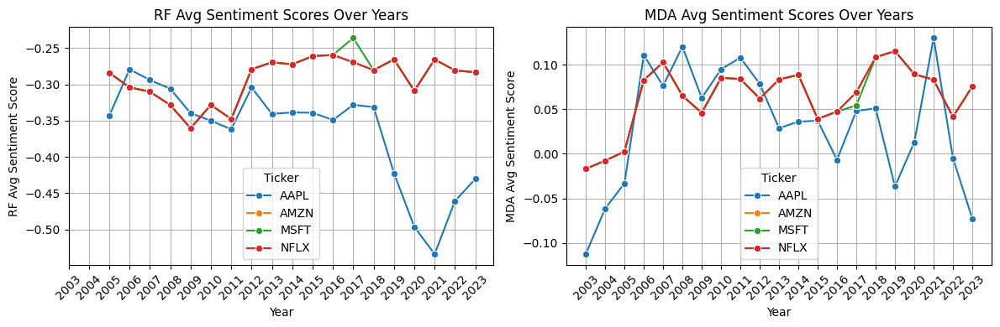

In [ ]:
average_score_melted_df['Year'] = average_score_melted_df['Year'].astype(int)

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Plot RF_avg_sentiment_score
sns.lineplot(data=average_score_melted_df, x='Year', y='RF_avg_sentiment_score', hue='Ticker', ax=axes[0], marker='o')
axes[0].set_title('RF Avg Sentiment Scores Over Years')
axes[0].set_xlabel('Year')
axes[0].set_ylabel('RF Avg Sentiment Score')
axes[0].legend(title='Ticker', loc='lower center')
axes[0].grid(True)
axes[0].set_xticks(average_score_melted_df['Year'].unique())
axes[0].set_xticklabels(average_score_melted_df['Year'].unique(), rotation=45)  # Rotate the tick labels

# Plot MDA_avg_sentiment_score
sns.lineplot(data=average_score_melted_df, x='Year', y='MDA_avg_sentiment_score', hue='Ticker', ax=axes[1], marker='o')
axes[1].set_title('MDA Avg Sentiment Scores Over Years')
axes[1].set_xlabel('Year')
axes[1].set_ylabel('MDA Avg Sentiment Score')
axes[1].legend(title='Ticker', loc='lower center')
axes[1].grid(True)
axes[1].set_xticks(average_score_melted_df['Year'].unique())
axes[1].set_xticklabels(average_score_melted_df['Year'].unique(), rotation=45)  # Rotate the tick labels

plt.tight_layout()
plt.show()

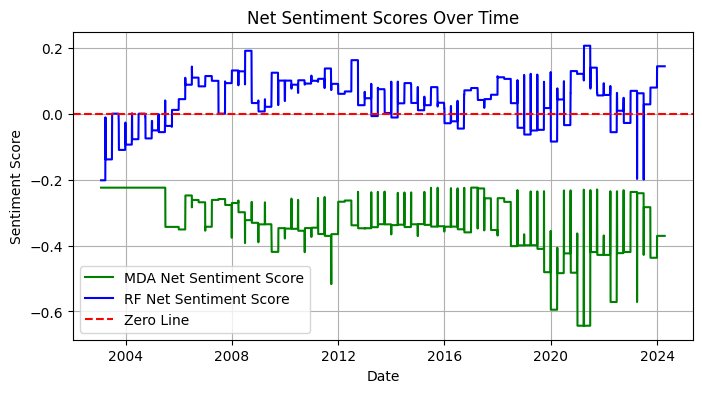

In [ ]:
# Plot avg sentiments over time
plt.figure(figsize=(8, 4))
plt.plot(df_eda['Date'], df_eda['RF_avg_sentiment_score'], color='green', label='MDA Net Sentiment Score')
plt.plot(df_eda['Date'], df_eda['MDA_avg_sentiment_score'], color='blue', label='RF Net Sentiment Score')
plt.axhline(y=0, color='red', linestyle='--', label='Zero Line')

plt.title('Net Sentiment Scores Over Time')
plt.xlabel('Date')
plt.ylabel('Sentiment Score')
plt.grid(True)

plt.legend()
plt.show()

# Feature Engineering for Time Series specifically
No other new columns will be created apart from date-related columns, to avoid Curse of Dim. <br>
Specifically, rolling mean and new lag features won't be created

In [ ]:
df_time = df_sel.copy()

In [ ]:
# extracting date information since the model cannot take in the datetime object directly

df_time['Date_year'] = df_time['Date'].dt.year
df_time['Date_month'] = df_time['Date'].dt.month
df_time['Date_day'] = df_time['Date'].dt.day

# drop original Date col
df_time = df_time.drop(['Date'], axis = 1)

In [ ]:
# lagging all sentiment-related data
sentiment_cols_to_lag = [
    'NFLX_Sentiment Label','AAPL_Sentiment Label', 'MSFT_Sentiment Label','AMZN_Sentiment Label'
]

for i in sentiment_cols_to_lag:
  df_time[i] = df_time[i].shift(1)

In [ ]:
# bfill those new NaNs that appeared
for i in sentiment_cols_to_lag:
  df_time[i] = df_time[i].fillna(method='bfill')

In [ ]:
df_time.isna().sum()

Close                       0
Volume                      0
RSI                         0
Volatility                  0
T10Y2Y                      0
DGORDER                     0
NFLX_Sentiment Label        0
AAPL_Sentiment Label        0
MSFT_Sentiment Label        0
AMZN_Sentiment Label        0
RF_positive_count           0
RF_total_positive_score     0
RF_negative_count           0
RF_total_negative_score     0
RF_count                    0
RF_avg_sentiment_score      0
MDA_positive_count          0
MDA_total_positive_score    0
MDA_negative_count          0
MDA_total_negative_score    0
MDA_count                   0
MDA_avg_sentiment_score     0
Date_year                   0
Date_month                  0
Date_day                    0
dtype: int64

# Printing numerical statistics / unique categories for final report

In [ ]:
df_time.describe()

,Close,Volume,RSI,Volatility,T10Y2Y,DGORDER,RF_positive_count,RF_total_positive_score,RF_negative_count,RF_total_negative_score,RF_count,RF_avg_sentiment_score,MDA_positive_count,MDA_total_positive_score,MDA_negative_count,MDA_total_negative_score,MDA_count,MDA_avg_sentiment_score,Date_year,Date_month,Date_day
count,6755.000000,6.755000e+03,6755.000000,6755.000000,6755.000000,6755.000000,6755.000000,6755.000000,6755.000000,6755.000000,6755.000000,6755.000000,6755.000000,6755.000000,6755.000000,6755.000000,6755.000000,6755.000000,6755.000000,6755.000000,6755.000000
mean,64.896038,7.875729e+07,54.521369,1.572289,1.123538,222373.578386,8.421318,8.062563,87.716210,-82.482357,220.833013,-0.340406,41.294597,39.623999,32.627535,-31.171887,272.567283,0.040506,2013.275056,6.470170,15.656255
std,82.413957,4.824455e+07,13.282248,2.195344,0.976796,31876.376262,3.721878,3.551512,38.214055,36.105756,89.865520,0.090955,21.527265,20.669567,33.558348,32.037060,139.729234,0.073807,6.155436,3.454102,8.854413
min,0.968322,1.330760e+07,16.346262,0.023031,-1.080000,146323.000000,0.000000,0.000000,2.000000,-154.429132,3.000000,-0.643321,0.000000,0.000000,0.000000,-147.103314,1.000000,-0.202127,2003.000000,1.000000,1.000000
25%,4.455506,4.549262e+07,44.989498,0.192549,0.260000,204738.000000,7.000000,6.621378,69.000000,-105.286414,202.000000,-0.370765,24.000000,23.367486,16.000000,-29.269609,185.000000,-0.000571,2008.000000,3.000000,8.000000
50%,22.519668,6.664615e+07,54.983164,0.490724,1.180000,223835.000000,9.000000,8.857180,101.000000,-95.639520,247.000000,-0.342669,40.000000,37.893167,23.000000,-21.784711,267.000000,0.044089,2013.000000,6.000000,16.000000
75%,99.864273,9.933865e+07,64.566718,2.007713,1.920000,236294.000000,11.000000,10.534373,112.000000,-64.261889,283.000000,-0.263509,54.000000,52.711199,30.000000,-15.251804,320.000000,0.092697,2019.000000,9.000000,23.000000
max,308.489998,6.561752e+08,89.089678,11.760311,2.910000,301262.000000,17.000000,16.105502,162.000000,-1.713884,347.000000,-0.224366,110.000000,106.390995,153.000000,0.000000,672.000000,0.206056,2024.000000,12.000000,31.000000


In [ ]:
print(df_time.describe().shape)
df_time.shape

(8, 21)


(6755, 25)

# Machine Learning Models: Traditional models

In [ ]:
df = df_time.copy()

## XGBoost

In [ ]:
df.columns

Index(['Close', 'Volume', 'RSI', 'Volatility', 'T10Y2Y', 'DGORDER',
       'NFLX_Sentiment Label', 'AAPL_Sentiment Label', 'MSFT_Sentiment Label',
       'AMZN_Sentiment Label', 'RF_positive_count', 'RF_total_positive_score',
       'RF_negative_count', 'RF_total_negative_score', 'RF_count',
       'RF_avg_sentiment_score', 'MDA_positive_count',
       'MDA_total_positive_score', 'MDA_negative_count',
       'MDA_total_negative_score', 'MDA_count', 'MDA_avg_sentiment_score',
       'Date_year', 'Date_month', 'Date_day'],
      dtype='object')

In [ ]:
# scaling numeric columns except date-related columns
from sklearn.preprocessing import MinMaxScaler

df_scaled = df.copy()

scaler = MinMaxScaler()
cols_to_scale = ['Close','Volume', 'RSI', 'Volatility', 'T10Y2Y', 'DGORDER',
       'RF_positive_count', 'RF_total_positive_score',
       'RF_negative_count', 'RF_total_negative_score', 'RF_count',
       'RF_avg_sentiment_score', 'MDA_positive_count',
       'MDA_total_positive_score', 'MDA_negative_count',
       'MDA_total_negative_score', 'MDA_count', 'MDA_avg_sentiment_score'
       ]

df_scaled[cols_to_scale] = scaler.fit_transform(df_scaled[cols_to_scale])

In [ ]:
# one hot encoding for categorical
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
categorical_columns = ['NFLX_Sentiment Label', 'AAPL_Sentiment Label', 'MSFT_Sentiment Label', 'AMZN_Sentiment Label']

for column in categorical_columns:
    df_scaled[column] = label_encoder.fit_transform(df_scaled[column])

In [ ]:
# train val test split: 70-15-15
train_idx = int(len(df_scaled) * 0.7)
val_idx = int(len(df_scaled) * 0.85)

train = df_scaled.iloc[:train_idx]
val = df_scaled.iloc[train_idx:val_idx]
test = df_scaled.iloc[val_idx:]

print(train.shape)
print(val.shape)
print(test.shape)

(4727, 25)
(1013, 25)
(1014, 25)


In [ ]:
xtrain = train.drop(['Close'], axis=1)
ytrain = train[['Close']]
xtest = test.drop(['Close'], axis=1)
ytest = test[['Close']]
xval = val.drop(['Close'], axis=1)
yval = val[['Close']]

In [ ]:
# randomised search to find the best hyper params from the start
ytrain_flat = np.ravel(ytrain)
yval_flat = np.ravel(yval)
ytest_flat = np.ravel(ytest)

from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

param_distributions = {
    'n_estimators': [100, 500, 1000, 1300],
    'max_depth': [None, 3, 5, 7, 9],
    'learning_rate': [0.0009, 0.001, 0.01, 0.1, 0.2],
    'reg_alpha': [0, 0.1, 0.5, 1],
    'reg_lambda': [1, 0.1, 0.5, 0]
}

xgb_model = XGBRegressor(objective='reg:squarederror', random_state=42)

# Time series cross-validator
tscv = TimeSeriesSplit(n_splits=5)
random_search = RandomizedSearchCV(estimator=xgb_model,
                                   param_distributions=param_distributions,
                                   cv=tscv, verbose=2,
                                   n_jobs=-1, scoring='r2', random_state = 42)
random_search.fit(xtrain, ytrain_flat)

print("Best Parameters:", random_search.best_params_)
print(f"Best score (R squared): {random_search.best_score_}")

Fitting 5 folds for each of 10 candidates, totalling 50 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


Best Parameters: {'reg_lambda': 0, 'reg_alpha': 0, 'n_estimators': 1300, 'max_depth': 5, 'learning_rate': 0.2}
Best score (R squared): -2.9776654660091877


In [ ]:
# Fitting model with the best hyperparams + some tweaking to achieve better RMSE

xgb_model2 = XGBRegressor(
    n_estimators=1300,
    max_depth=5,
    learning_rate=0.2,
    objective='reg:squarederror',
    random_state=42,
    reg_alpha=0,
    reg_lambda=0
)

xgb_model2.fit(xtrain, ytrain_flat,
              eval_set=[(xtrain, ytrain_flat), (xval, yval_flat)],
              early_stopping_rounds=10,
              verbose=False)

/usr/local/lib/python3.10/dist-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.2, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1300, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [ ]:
# Model evaluation

y_pred = xgb_model2.predict(xval)

val_rmse = mean_squared_error(yval_flat, y_pred, squared=False)
print(f"Validation RMSE: {val_rmse}")
val_r_squared = r2_score(yval_flat, y_pred)
print(f'R-squared: {val_r_squared}')

Validation RMSE: 0.23475935715245122
R-squared: -2.6445007755323493


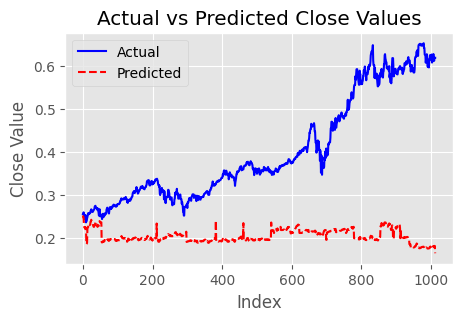

In [ ]:
import matplotlib.pyplot as plt

# Plotting both the actual and predicted values
plt.figure(figsize=(5, 3))
plt.plot(yval_flat, label='Actual', color='blue')
plt.plot(y_pred, label='Predicted', color='red', linestyle='--')

plt.title('Actual vs Predicted Close Values')
plt.xlabel('Index')
plt.ylabel('Close Value')
plt.legend()
plt.show()

## Random Forest Regression

In [ ]:
df_scaled = df.copy()

# scaling numeric columns except date-related columns
from sklearn.preprocessing import MinMaxScaler

df_scaled = df.copy()

scaler = MinMaxScaler()
cols_to_scale = ['Close','Volume', 'RSI', 'Volatility', 'T10Y2Y', 'DGORDER',
       'RF_positive_count', 'RF_total_positive_score',
       'RF_negative_count', 'RF_total_negative_score', 'RF_count',
       'RF_avg_sentiment_score', 'MDA_positive_count',
       'MDA_total_positive_score', 'MDA_negative_count',
       'MDA_total_negative_score', 'MDA_count', 'MDA_avg_sentiment_score']

df_scaled[cols_to_scale] = scaler.fit_transform(df_scaled[cols_to_scale])

In [ ]:
# one hot encoding for categorical
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
categorical_columns = ['NFLX_Sentiment Label', 'AAPL_Sentiment Label', 'MSFT_Sentiment Label', 'AMZN_Sentiment Label']

for column in categorical_columns:
    df_scaled[column] = label_encoder.fit_transform(df_scaled[column])

In [ ]:
# train val test split: 70-15-15
train_idx = int(len(df_scaled) * 0.7)
val_idx = int(len(df_scaled) * 0.85)

train = df_scaled.iloc[:train_idx]
val = df_scaled.iloc[train_idx:val_idx]
test = df_scaled.iloc[val_idx:]

print(train.shape)
print(val.shape)
print(test.shape)

(4727, 25)
(1013, 25)
(1014, 25)


In [ ]:
xtrain = train.drop(['Close'], axis=1)
ytrain = train[['Close']]
xtest = test.drop(['Close'], axis=1)
ytest = test[['Close']]
xval = val.drop(['Close'], axis=1)
yval = val[['Close']]

In [ ]:
# randomised search to find the best hyper params from the start
ytrain_flat = np.ravel(ytrain)
yval_flat = np.ravel(yval)
ytest_flat = np.ravel(ytest)

from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Define the parameter distribution
param_distributions = {
    'n_estimators': np.arange(100, 501, 50),
    'max_depth': [None] + list(np.arange(5, 51, 5)),
    'min_samples_split': np.arange(2, 11),
    'min_samples_leaf': np.arange(1, 11),
    'max_features': [None, 'sqrt', 'log2']
}

# Initialize the Random Forest Regressor
rf_model = RandomForestRegressor(random_state=42)

# Time series cross-validator
tscv = TimeSeriesSplit(n_splits=5)
random_search = RandomizedSearchCV(estimator=rf_model,
                                   param_distributions=param_distributions,
                                   cv=tscv, verbose=2,
                                   n_jobs=-1, scoring='r2', random_state = 42)
random_search.fit(xtrain, ytrain_flat)

# Print the best parameters and the best score
print("Best Parameters:", random_search.best_params_)
print(f"Best score (R squared): {random_search.best_score_}")

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'n_estimators': 350, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': None, 'max_depth': 45}
Best score (R squared): -3.159708038897515


In [ ]:
# Fitting model with the best hyperparams
rf_model2 = RandomForestRegressor(n_estimators = 350,
                                  min_samples_split = 2,
                                  min_samples_leaf = 4,
                                  max_features = None,
                                  max_depth = 45,
                                  random_state=42)

rf_model2.fit(xtrain, ytrain_flat)

RandomForestRegressor(max_depth=45, max_features=None, min_samples_leaf=4,
                      n_estimators=350, random_state=42)

In [ ]:
# Model evaluation

y_pred = rf_model2.predict(xval)

rmse = mean_squared_error(yval_flat, y_pred, squared=False)
print(f"Validation RMSE: {rmse}")
r_squared = r2_score(yval_flat, y_pred)
print(f'R-squared: {r_squared}')

Validation RMSE: 0.22577613291100093
R-squared: -2.370918745207944


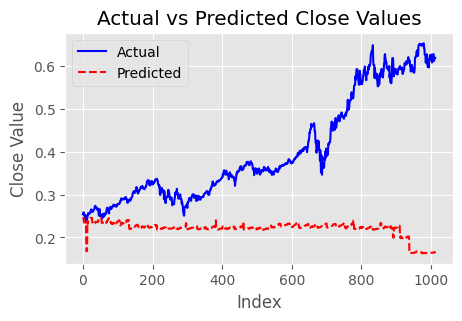

In [ ]:
import matplotlib.pyplot as plt

# Plotting both the actual and predicted values
plt.figure(figsize=(5, 3))
plt.plot(yval_flat, label='Actual', color='blue')
plt.plot(y_pred, label='Predicted', color='red', linestyle='--')

plt.title('Actual vs Predicted Close Values')
plt.xlabel('Index')
plt.ylabel('Close Value')
plt.legend()
plt.show()

## Random Forest Regression with Lagged Variables of Closing Price

In [ ]:
# New Lagged Variables
df_scaled_lag = df.copy()
df_scaled_lag['Close_lagged_1'] = df_scaled_lag['Close'].shift(1)
df_scaled_lag['Close_lagged_7'] = df_scaled_lag['Close'].shift(7)
df_scaled_lag['Close_lagged_14'] = df_scaled_lag['Close'].shift(14)
df_scaled_lag['Close_lagged_30'] = df_scaled_lag['Close'].shift(30)

# Variables to determine if lagged variables have close price or NaN
df_scaled_lag['lagged_1_ava'] = (~df_scaled_lag['Close_lagged_1'].isna()).astype(int)
df_scaled_lag['lagged_7_ava'] = (~df_scaled_lag['Close_lagged_7'].isna()).astype(int)
df_scaled_lag['lagged_14_ava'] = (~df_scaled_lag['Close_lagged_14'].isna()).astype(int)
df_scaled_lag['lagged_30_ava'] = (~df_scaled_lag['Close_lagged_30'].isna()).astype(int)

df_scaled_lag = df_scaled_lag.fillna(0)

In [ ]:
# scaling numeric columns except date-related columns
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
cols_to_scale = ['Close','Volume', 'RSI', 'Volatility', 'T10Y2Y', 'DGORDER',
       'RF_positive_count', 'RF_total_positive_score',
       'RF_negative_count', 'RF_total_negative_score', 'RF_count',
       'RF_avg_sentiment_score', 'MDA_positive_count',
       'MDA_total_positive_score', 'MDA_negative_count',
       'MDA_total_negative_score', 'MDA_count', 'MDA_avg_sentiment_score',
       'Close_lagged_1', 'Close_lagged_7', 'Close_lagged_14', 'Close_lagged_30']

df_scaled_lag[cols_to_scale] = scaler.fit_transform(df_scaled_lag[cols_to_scale])

In [ ]:
# one hot encoding for categorical
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
categorical_columns = ['NFLX_Sentiment Label', 'AAPL_Sentiment Label', 'MSFT_Sentiment Label', 'AMZN_Sentiment Label']

for column in categorical_columns:
    df_scaled_lag[column] = label_encoder.fit_transform(df_scaled_lag[column])

In [ ]:
# train val test split: 70-15-15
train_idx = int(len(df_scaled_lag) * 0.7)
val_idx = int(len(df_scaled_lag) * 0.85)

train = df_scaled_lag.iloc[:train_idx]
val = df_scaled_lag.iloc[train_idx:val_idx]
test = df_scaled_lag.iloc[val_idx:]

print(train.shape)
print(val.shape)
print(test.shape)

(4727, 33)
(1013, 33)
(1014, 33)


In [ ]:
xtrain = train.drop(['Close'], axis=1)
ytrain = train[['Close']]
xtest = test.drop(['Close'], axis=1)
ytest = test[['Close']]
xval = val.drop(['Close'], axis=1)
yval = val[['Close']]

In [ ]:
# randomised search to find the best hyper params from the start
ytrain_flat = np.ravel(ytrain)
yval_flat = np.ravel(yval)
ytest_flat = np.ravel(ytest)

from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Define the parameter distribution
param_distributions = {
    'n_estimators': np.arange(100, 501, 50),
    'max_depth': [None] + list(np.arange(5, 51, 5)),
    'min_samples_split': np.arange(2, 11),
    'min_samples_leaf': np.arange(1, 11),
    'max_features': [None, 'sqrt', 'log2']
}

# Initialize the Random Forest Regressor
rf_model_lag = RandomForestRegressor(random_state=42)

# Time series cross-validator
tscv = TimeSeriesSplit(n_splits=5)

# Initialize the Random Search model
random_search = RandomizedSearchCV(estimator=rf_model_lag, param_distributions=param_distributions, cv=tscv, verbose=2, n_jobs=-1, scoring='r2', random_state=42)

# Fit the Random Search model
random_search.fit(xtrain, ytrain_flat)

# Print the best parameters and the best score
print("Best Parameters:", random_search.best_params_)
print(f"Best score (R squared): {random_search.best_score_}")

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'n_estimators': 350, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': None, 'max_depth': 45}
Best score (R squared): -1.178200032919806


In [ ]:
# Fitting model with the best hyperparams
rf_model_lag2 = RandomForestRegressor(n_estimators = 350,
                                  min_samples_split = 2,
                                  min_samples_leaf = 4,
                                  max_features = None,
                                  max_depth = 45,
                                  random_state=42)

rf_model_lag2.fit(xtrain, ytrain_flat)

RandomForestRegressor(max_depth=45, max_features=None, min_samples_leaf=4,
                      n_estimators=350, random_state=42)

In [ ]:
# Model evaluation

y_pred = rf_model_lag2.predict(xval)

rmse = mean_squared_error(yval_flat, y_pred, squared=False)
print(f"Validation RMSE: {rmse}")
r_squared = r2_score(yval_flat, y_pred)
print(f'R-squared: {r_squared}')

Validation RMSE: 0.20055980911104296
R-squared: -1.6599902145288823


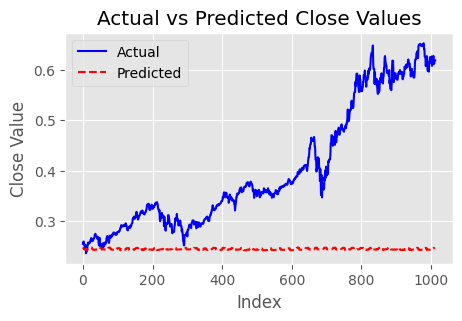

In [ ]:
import matplotlib.pyplot as plt

# Plotting both the actual and predicted values
plt.figure(figsize=(5, 3))
plt.plot(yval_flat, label='Actual', color='blue')
plt.plot(y_pred, label='Predicted', color='red', linestyle='--')

plt.title('Actual vs Predicted Close Values')
plt.xlabel('Index')
plt.ylabel('Close Value')
plt.legend()
plt.show()

# Machine Learning Models: Deep Learning Models

### Processing steps before training and running models

In [ ]:
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import json
import math
import os

from sklearn.preprocessing import MinMaxScaler

In [ ]:
df_merged_lagged = df_deep.copy()
df_merged_lagged['NFLX_Sentiment Score'] = df_merged_lagged['NFLX_Sentiment Score'].shift(1)
df_merged_lagged['AAPL_Sentiment Score'] = df_merged_lagged['AAPL_Sentiment Score'].shift(1)
df_merged_lagged['MSFT_Sentiment Score'] = df_merged_lagged['MSFT_Sentiment Score'].shift(1)
df_merged_lagged['AMZN_Sentiment Score'] = df_merged_lagged['AMZN_Sentiment Score'].shift(1)

df_merged_lagged = df_merged_lagged.dropna()

# print(df_merged_lagged.shape)

df_merged = df_merged_lagged.copy()

X_initial = df_merged.drop(columns=['Date', 'NFLX_Sentiment Label', 'AAPL_Sentiment Label', 'MSFT_Sentiment Label', 'AMZN_Sentiment Label'])
X_initial_tft = df_merged.drop(columns=[ 'NFLX_Sentiment Label', 'AAPL_Sentiment Label', 'MSFT_Sentiment Label', 'AMZN_Sentiment Label'])
y_initial = df_merged['Close']
date_initial = df_merged['Date']

# print(df_merged['NFLX_Sentiment Score'].iloc[6700:6710])
# print(df_merged_lagged['NFLX_Sentiment Score'].iloc[6700:6710])
print(X_initial.shape)
print(X_initial_tft.shape)
print(y_initial.shape)
print(date_initial.shape)
# print(X.iloc[:5])
# print(X.iloc[-5:])
# print(df_merged)



(6755, 30)
(6755, 31)
(6755,)
(6755,)


#### pip installs and imports needed for LSTM and GRU

In [ ]:
pip install -q -U keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.9 MB/s eta 0:00:00


In [ ]:
# Import Libraries and packages from Keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from keras.optimizers import Adam

# Importing dependencies
import numpy as np
np.random.seed(1)
import tensorflow
tensorflow.random.set_seed(2)
import pandas as pd
import matplotlib.pyplot as plt
from keras.models import Sequential, load_model
from keras.layers import GRU
from keras import optimizers
from keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score
from math import sqrt
import datetime as dt
import time
plt.style.use('ggplot')
import random as python_random

In [ ]:
import keras_tuner as kt

#### pip installs and imports needed for Google Temporal Fusion Transformer

In [ ]:
!pip install torch==2.0.1 pytorch-lightning==2.0.2 pytorch_forecasting==1.0.0 torchaudio==2.0.2 torchdata==0.6.1 torchtext==0.15.2 torchvision==0.15.2 optuna==3.4

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 619.9/619.9 MB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.0/719.0 kB 40.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.4/140.4 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.4/4.4 MB 67.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 37.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 57.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 64.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 409.6/409.6 kB 26.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.0/21.0 MB 34.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 849.3/849.3 kB 36.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 61.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 557.1/557.1 MB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import copy
from pathlib import Path
import warnings

import lightning.pytorch as pl
from lightning.pytorch.callbacks import EarlyStopping, LearningRateMonitor, ModelCheckpoint
from lightning.pytorch.loggers import TensorBoardLogger
import numpy as np
import pandas as pd
import torch

from pytorch_forecasting import Baseline, TemporalFusionTransformer, TimeSeriesDataSet
from pytorch_forecasting.data import GroupNormalizer
from pytorch_forecasting.metrics import MAE, SMAPE, PoissonLoss, QuantileLoss, MultiLoss, RMSE
from pytorch_forecasting.models.temporal_fusion_transformer.tuning import optimize_hyperparameters
from torch.nn import MSELoss
from lightning.pytorch.tuner import Tuner

from sklearn.metrics import mean_squared_error, r2_score

#### Setting seed for LSTM, GRU and Google Temporal Fusion Transformer

In [ ]:
def reset_random_seeds():
   tensorflow.random.set_seed(2022)
   np.random.seed(2022)
   python_random.seed(2022)

reset_random_seeds()

In [ ]:
pl.seed_everything(2022,workers=True)

INFO: Seed set to 2022
INFO:lightning.fabric.utilities.seed:Seed set to 2022


2022

#### Loading functions definining LSTM and GRU models, and evaluate model

In [ ]:
def model_builder_LSTM(hp):
  model = tensorflow.keras.Sequential()
  # model.add(tensorflow.keras.layers.Flatten(input_shape=(10, 11)))

  model.add(LSTM(units=hp.Int('units', min_value=32, max_value=512, step=32),
                  input_shape=(10, 30), return_sequences=False))
  model.add(Dense(units=hp.Int('dense_units', min_value=32, max_value=128, step=32), activation='relu'))
  model.add(Dense(3, activation='linear'))  # Predicting 3 future values

  model.compile(optimizer='adam',
                  loss='mean_squared_error',
                  metrics=['mae'])
  return model

def model_builder_GRU(hp):
  model = tensorflow.keras.Sequential()
  # model.add(tensorflow.keras.layers.Flatten(input_shape=(10, 11)))

  model.add(GRU(units=hp.Int('units', min_value=32, max_value=512, step=32),
                  input_shape=(10, 30), return_sequences=False))
  model.add(Dense(units=hp.Int('dense_units', min_value=32, max_value=128, step=32), activation='relu'))
  model.add(Dense(3, activation='linear'))  # Predicting 3 future values

  model.compile(optimizer='adam',
                  loss='mean_squared_error',
                  metrics=['mae'])
  return model

# Evaluating the model
def evaluate_model(model,test,timesteps):
  X_test = []
  Y_test = []

  # print(test.shape)

  # Loop for testing data
  for i in range(timesteps, test.shape[0] - 3):
      X_test.append(test[i-timesteps:i])
      Y_test.append(test[i+1:i+4, 3])
  X_test,Y_test = np.array(X_test),np.array(Y_test)



  # Prediction
  Y_hat = model.predict(X_test)
  # print(Y_test)
  # print(Y_hat)

  # return mse,rmse, r2, Y_test, Y_hat
  return Y_test, Y_hat

In [ ]:
def model_builder_LSTM_from_saved_hp(hp_dict):
    model = tensorflow.keras.Sequential()

    # Directly use 'units' and 'dense_units' from the dictionary
    model.add(LSTM(units=hp_dict['units'], input_shape=(10, 30), return_sequences=False))
    model.add(Dense(units=hp_dict['dense_units'], activation='relu'))
    model.add(Dense(3, activation='linear'))  # Predicting 3 future values

    model.compile(optimizer='adam',
                  loss='mean_squared_error',
                  metrics=['mae'])
    return model

def model_builder_GRU_from_saved_hp(hp_dict):
    model = tensorflow.keras.Sequential()

    # Directly use 'units' and 'dense_units' from the dictionary
    model.add(GRU(units=hp_dict['units'], input_shape=(10, 30), return_sequences=False))
    model.add(Dense(units=hp_dict['dense_units'], activation='relu'))
    model.add(Dense(3, activation='linear'))  # Predicting 3 future values

    model.compile(optimizer='adam',
                  loss='mean_squared_error',
                  metrics=['mae'])
    return model

In [ ]:
stop_early = tensorflow.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)

# Deep Learning on dataset with different train-val-test split to determine accuracy in each split ratio

### Predicting for stock using 70-15-15 train-val-test split

#### Loading specific dataset for training and testing (For LSTM and GRU)

In [ ]:
# X = X.loc[:len(df_merged) * 0.80+50]
# Y = y.loc[:len(df_merged) * 0.80 + 80]
# Date = date_initial.loc[:len(df_merged) * 0.80 + 80]
X = X_initial.copy()
Y = y_initial.copy()
Date = date_initial.copy()

print(X.shape)
print(Y.shape)
print(Date.shape)

# Normalisation
sc = MinMaxScaler()
train = sc.fit_transform(X.loc[0: len(X) * 0.7])
val = sc.transform(X.loc[len(X)* 0.7 - 10: len(X) * 0.85])
test = sc.transform(X.loc[len(X) * 0.85  - 10:])


sc2 = MinMaxScaler()
train2 = sc2.fit_transform(Y.loc[0: len(Y) * 0.7].to_numpy().reshape(-1, 1))
val2 = sc2.transform(Y.loc[len(Y)* 0.7 - 10: len(Y) * 0.85].to_numpy().reshape(-1, 1))
test2 = sc2.transform(Y.loc[len(Y) * 0.85 - 10:].to_numpy().reshape(-1, 1))

Date_val = Date.loc[len(Date)* 0.7: len(Date) * 0.85 - 3]
Date_test = Date.loc[len(Date) * 0.85: len(Date) - 3]

print(train.shape,val.shape,test.shape)
print(train2.shape,val2.shape,test2.shape)
print(math.floor(len(Date) * 0.7))
print(math.ceil(len(Date) * 0.85 - 3))
print(Date_val)
print(Date_test)

(6754, 30)
(6754,)
(6754,)
(4727, 30) (1023, 30) (1024, 30)
(4727, 1) (1023, 1) (1024, 1)
4727
5738
4728   2018-01-30
4729   2018-01-31
4730   2018-02-01
4731   2018-02-02
4732   2018-02-03
          ...    
5733   2021-03-22
5734   2021-03-23
5735   2021-03-24
5736   2021-03-25
5737   2021-03-26
Name: Date, Length: 1010, dtype: datetime64[ns]
5741   2021-03-31
5742   2021-04-01
5743   2021-04-02
5744   2021-04-03
5745   2021-04-05
          ...    
6747   2024-04-04
6748   2024-04-05
6749   2024-04-08
6750   2024-04-09
6751   2024-04-10
Name: Date, Length: 1011, dtype: datetime64[ns]


#### For LSTM

##### Hyperparameter tuning, training models

In [ ]:
# hps vlaues are to be removed for new run of tuner.search

!rm -rf ./untitled_project  # Be cautious with this command to avoid deleting unintended files

In [ ]:
# Remember to change the modle builder depending on whether you are trying out GRU or LSTm

timesteps = 10

tuner = kt.Hyperband(model_builder_LSTM,
                     objective='val_loss',
                     max_epochs=100)

# print(df_merged[11 : 14]['Close'])

X_train = []
Y_train = []
X_val = []
Y_val = []


# Loop for training data
for i in range(timesteps, train.shape[0] - timesteps):
    X_train.append(train[i-timesteps:i])
    Y_train.append(train[i+1 : i+4, 3])
X_train,y_train = np.array(X_train),np.array(Y_train)

# Loop for val data
for i in range(timesteps, val.shape[0] - timesteps):
    X_val.append(val[i-timesteps:i])
    Y_val.append(val[i+1 : i+4, 3])
X_val,y_val = np.array(X_val),np.array(Y_val)

# X_train = np.delete(X_train, 0, axis=1)
print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)

# print(X_train[0])

tuner.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val), callbacks=[stop_early])
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

Trial 61 Complete [00h 00m 24s]
val_loss: 0.13819825649261475

Best val_loss So Far: 0.0696268230676651
Total elapsed time: 00h 28m 40s


In [ ]:
print(best_hps)
print(best_hps.values)

{'units': 384, 'dense_units': 128, 'tuner/epochs': 2, 'tuner/initial_epoch': 0, 'tuner/bracket': 4, 'tuner/round': 0}


In [ ]:
model = tuner.hypermodel.build(best_hps)
history = model.fit(X_train, y_train, epochs=1000, validation_data=(X_val, y_val),
                    callbacks=[stop_early])
val_loss = history.history['val_loss']

Epoch 1/1000
148/148 [==============================] - 13s 68ms/step - loss: 0.0023 - mae: 0.0194 - val_loss: 0.1010 - val_mae: 0.2013
Epoch 2/1000
148/148 [==============================] - 11s 76ms/step - loss: 1.3153e-04 - mae: 0.0085 - val_loss: 0.1201 - val_mae: 0.2306
Epoch 3/1000
148/148 [==============================] - 11s 74ms/step - loss: 1.1487e-04 - mae: 0.0079 - val_loss: 0.1309 - val_mae: 0.2416
Epoch 4/1000
148/148 [==============================] - 11s 74ms/step - loss: 8.7085e-05 - mae: 0.0068 - val_loss: 0.1362 - val_mae: 0.2485


In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 384)               637440    
                                                                 
 dense_2 (Dense)             (None, 128)               49280     
                                                                 
 dense_3 (Dense)             (None, 3)                 387       
                                                                 
Total params: 687107 (2.62 MB)
Trainable params: 687107 (2.62 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


##### Predicting Validation dataset

In [ ]:
timesteps = 10

In [ ]:
# mse,rmse,r2_value,true,predicted = evaluate_model(model,test,timesteps)
true, predicted = evaluate_model(model,val,timesteps)

# print("MSE =",mse)
# print("RMSE =",rmse)
# print("R2-Score =",r2_value)

print(predicted.shape)
print(true.shape)

32/32 [==============================] - 1s 18ms/step
(1010, 3)
(1010, 3)


In [ ]:
predicted_inversed = np.zeros(predicted.shape)
true_inversed = np.zeros(true.shape)

for i in range(predicted.shape[1]):  # Loop over each feature
    predicted_inversed[:, i] = sc2.inverse_transform(predicted[:, i].reshape(-1, 1)).flatten()
    true_inversed[:, i] = sc2.inverse_transform(true[:, i].reshape(-1, 1)).flatten()

mse = mean_squared_error(true_inversed, predicted_inversed)
rmse = sqrt(mse)
r2_value = r2_score(true_inversed ,predicted_inversed)


# print(predicted_inversed)
# print(true_inversed)

print("MSE =",mse)
print("RMSE =",rmse)
print("R2-Score =",r2_value)

MSE = 853.2147178320238
RMSE = 29.209839400996778
R2-Score = 0.4025455390797732


In [ ]:
Date_val = pd.to_datetime(Date_val)
print(Date_val.shape)
print(predicted_inversed[:,0].shape)
print(predicted_inversed[:,1].shape)
print(predicted_inversed[:,2].shape)

(1010,)
(1010,)
(1010,)
(1010,)


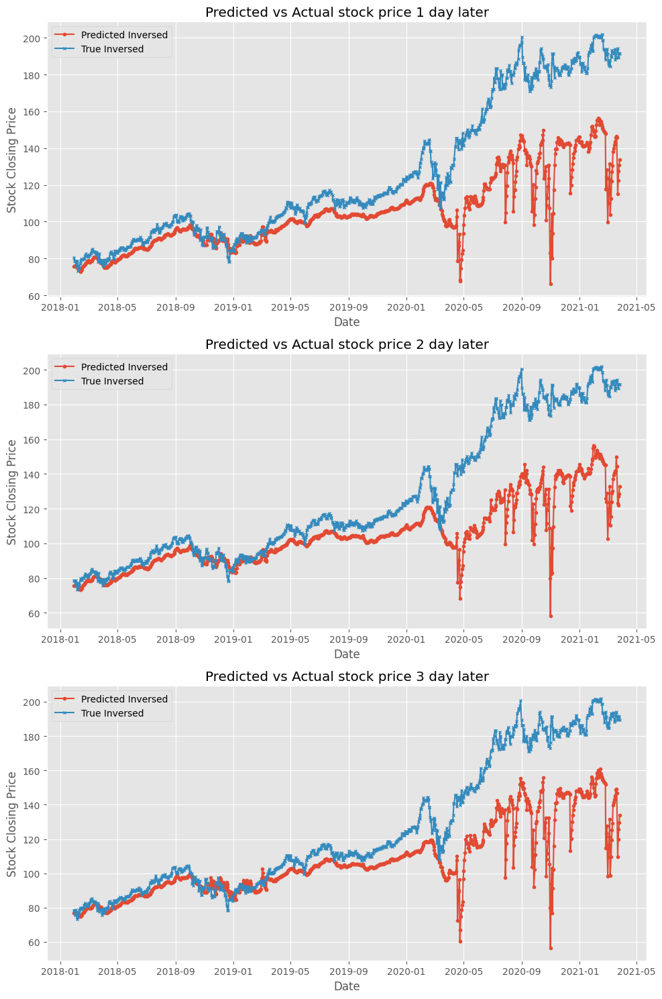

In [ ]:
# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 15))  # Create 3 subplots vertically


for i in range(3):  # Assuming 3 features
    axs[i].plot(Date_val, predicted_inversed[:, i], label='Predicted Inversed', marker='o', linestyle='-', markersize=3)
    axs[i].plot(Date_val, true_inversed[:, i], label='True Inversed', marker='x', linestyle='-', markersize=3)
    axs[i].set_title(f'Predicted vs Actual stock price {i+1} day later')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Stock Closing Price')
    axs[i].legend()

plt.tight_layout()
plt.show()

##### Predicting and saving Test dataset

In [ ]:
# mse,rmse,r2_value,true,predicted = evaluate_model(model,test,timesteps)
true, predicted = evaluate_model(model,test,timesteps)

# print("MSE =",mse)
# print("RMSE =",rmse)
# print("R2-Score =",r2_value)

print(predicted.shape)
print(true.shape)

32/32 [==============================] - 1s 19ms/step
(1011, 3)
(1011, 3)


In [ ]:
predicted_inversed = np.zeros(predicted.shape)
true_inversed = np.zeros(true.shape)

for i in range(predicted.shape[1]):  # Loop over each feature
    predicted_inversed[:, i] = sc2.inverse_transform(predicted[:, i].reshape(-1, 1)).flatten()
    true_inversed[:, i] = sc2.inverse_transform(true[:, i].reshape(-1, 1)).flatten()

mse = mean_squared_error(true_inversed, predicted_inversed)
rmse = sqrt(mse)
r2_value = r2_score(true_inversed ,predicted_inversed)


# print(predicted_inversed)
# print(true_inversed)

print("MSE =",mse)
print("RMSE =",rmse)
print("R2-Score =",r2_value)

MSE = 5247.2337481012755
RMSE = 72.43779226413017
R2-Score = -2.8422486995708582


In [ ]:
Date_test = pd.to_datetime(Date_test)
print(Date_test.shape)
print(predicted_inversed[:,1].shape)

(1011,)
(1011,)


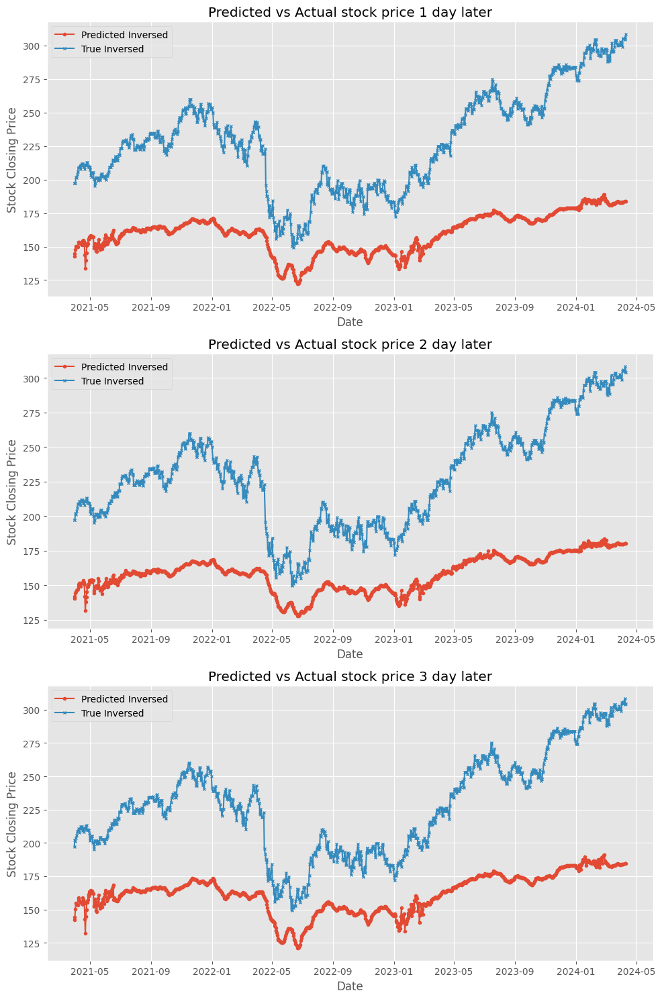

In [ ]:
# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 15))  # Create 3 subplots vertically


for i in range(3):  # Assuming 3 features
    axs[i].plot(Date_test, predicted_inversed[:, i], label='Predicted Inversed', marker='o', linestyle='-', markersize=3)
    axs[i].plot(Date_test, true_inversed[:, i], label='True Inversed', marker='x', linestyle='-', markersize=3)
    axs[i].set_title(f'Predicted vs Actual stock price {i+1} day later')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Stock Closing Price')
    axs[i].legend()

plt.tight_layout()
plt.show()


#### For GRU

##### Hyperparameter tuning, training models

In [ ]:
# hps vlaues are to be removed for new run of tuner.search

!rm -rf ./untitled_project  # Be cautious with this command to avoid deleting unintended files

In [ ]:
# Remember to change the modle builder depending on whether you are trying out GRU or LSTm

timesteps = 10

tuner = kt.Hyperband(model_builder_GRU,
                     objective='val_loss',
                     max_epochs=100)

# print(df_merged[11 : 14]['Close'])

X_train = []
Y_train = []
X_val = []
Y_val = []


# Loop for training data
for i in range(timesteps, train.shape[0] - timesteps):
    X_train.append(train[i-timesteps:i])
    Y_train.append(train[i+1 : i+4, 3])
X_train,y_train = np.array(X_train),np.array(Y_train)

# Loop for val data
for i in range(timesteps, val.shape[0] - timesteps):
    X_val.append(val[i-timesteps:i])
    Y_val.append(val[i+1 : i+4, 3])
X_val,y_val = np.array(X_val),np.array(Y_val)

# X_train = np.delete(X_train, 0, axis=1)
print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)

# print(X_train[0])

tuner.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val), callbacks=[stop_early])
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

Trial 61 Complete [00h 00m 27s]
val_loss: 0.05515164136886597

Best val_loss So Far: 0.013594252057373524
Total elapsed time: 00h 24m 03s


In [ ]:
print(best_hps)
print(best_hps.values)

{'units': 384, 'dense_units': 128, 'tuner/epochs': 2, 'tuner/initial_epoch': 0, 'tuner/bracket': 4, 'tuner/round': 0}


In [ ]:
model = tuner.hypermodel.build(best_hps)
history = model.fit(X_train, y_train, epochs=1000, validation_data=(X_val, y_val),
                    callbacks=[stop_early])
val_loss = history.history['val_loss']

Epoch 1/1000
148/148 [==============================] - 11s 62ms/step - loss: 0.0016 - mae: 0.0167 - val_loss: 0.0254 - val_mae: 0.1001
Epoch 2/1000
148/148 [==============================] - 7s 47ms/step - loss: 9.7746e-05 - mae: 0.0074 - val_loss: 0.0259 - val_mae: 0.0983
Epoch 3/1000
148/148 [==============================] - 9s 58ms/step - loss: 1.0393e-04 - mae: 0.0075 - val_loss: 0.0269 - val_mae: 0.1016
Epoch 4/1000
148/148 [==============================] - 8s 56ms/step - loss: 7.8180e-05 - mae: 0.0065 - val_loss: 0.0273 - val_mae: 0.1046


In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_1 (GRU)                 (None, 384)               479232    
                                                                 
 dense_2 (Dense)             (None, 128)               49280     
                                                                 
 dense_3 (Dense)             (None, 3)                 387       
                                                                 
Total params: 528899 (2.02 MB)
Trainable params: 528899 (2.02 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


##### Predicting Validation dataset

In [ ]:
timesteps = 10

In [ ]:
# mse,rmse,r2_value,true,predicted = evaluate_model(model,test,timesteps)
true, predicted = evaluate_model(model,val,timesteps)

# print("MSE =",mse)
# print("RMSE =",rmse)
# print("R2-Score =",r2_value)

print(predicted.shape)
print(true.shape)

32/32 [==============================] - 1s 15ms/step
(1010, 3)
(1010, 3)


In [ ]:
predicted_inversed = np.zeros(predicted.shape)
true_inversed = np.zeros(true.shape)

for i in range(predicted.shape[1]):  # Loop over each feature
    predicted_inversed[:, i] = sc2.inverse_transform(predicted[:, i].reshape(-1, 1)).flatten()
    true_inversed[:, i] = sc2.inverse_transform(true[:, i].reshape(-1, 1)).flatten()

mse = mean_squared_error(true_inversed, predicted_inversed)
rmse = sqrt(mse)
r2_value = r2_score(true_inversed ,predicted_inversed)


# print(predicted_inversed)
# print(true_inversed)

print("MSE =",mse)
print("RMSE =",rmse)
print("R2-Score =",r2_value)

MSE = 171.32541915466686
RMSE = 13.089133628879601
R2-Score = 0.8800953107381937


In [ ]:
Date_val = pd.to_datetime(Date_val)
print(Date_val.shape)
print(predicted_inversed[:,1].shape)

(1010,)
(1010,)


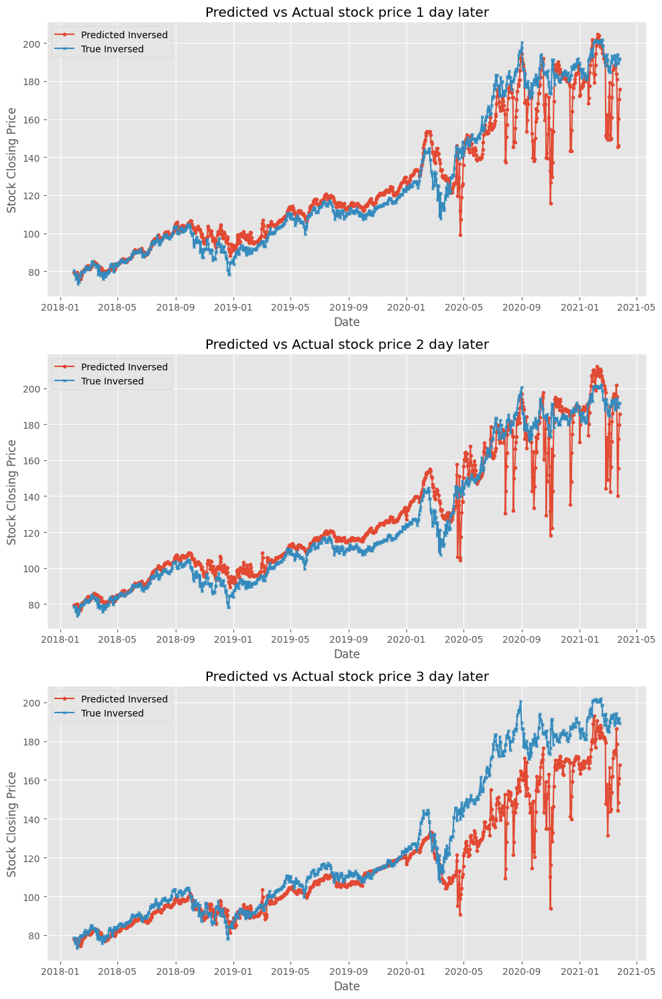

In [ ]:
# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 15))  # Create 3 subplots vertically


for i in range(3):  # Assuming 3 features
    axs[i].plot(Date_val, predicted_inversed[:, i], label='Predicted Inversed', marker='o', linestyle='-', markersize=3)
    axs[i].plot(Date_val, true_inversed[:, i], label='True Inversed', marker='x', linestyle='-', markersize=3)
    axs[i].set_title(f'Predicted vs Actual stock price {i+1} day later')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Stock Closing Price')
    axs[i].legend()

plt.tight_layout()
plt.show()


##### Predicting Test dataset

In [ ]:
# mse,rmse,r2_value,true,predicted = evaluate_model(model,test,timesteps)
true, predicted = evaluate_model(model,test,timesteps)

# print("MSE =",mse)
# print("RMSE =",rmse)
# print("R2-Score =",r2_value)

print(predicted.shape)
print(true.shape)

32/32 [==============================] - 1s 24ms/step
(1011, 3)
(1011, 3)


In [ ]:
predicted_inversed = np.zeros(predicted.shape)
true_inversed = np.zeros(true.shape)

for i in range(predicted.shape[1]):  # Loop over each feature
    predicted_inversed[:, i] = sc2.inverse_transform(predicted[:, i].reshape(-1, 1)).flatten()
    true_inversed[:, i] = sc2.inverse_transform(true[:, i].reshape(-1, 1)).flatten()

mse = mean_squared_error(true_inversed, predicted_inversed)
rmse = sqrt(mse)
r2_value = r2_score(true_inversed ,predicted_inversed)


# print(predicted_inversed)
# print(true_inversed)

print("MSE =",mse)
print("RMSE =",rmse)
print("R2-Score =",r2_value)

MSE = 637.1762624235558
RMSE = 25.242350572471572
R2-Score = 0.5343342611302242


In [ ]:
Date_test = pd.to_datetime(Date_test)
print(Date_test.shape)
print(predicted_inversed[:,1].shape)

(1011,)
(1011,)


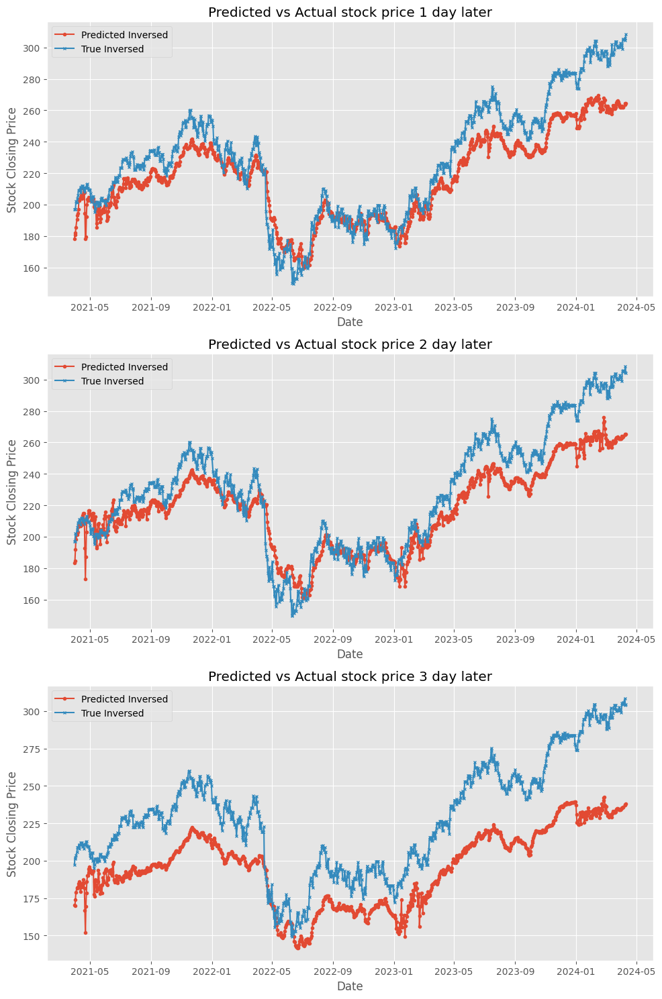

In [ ]:
# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 15))  # Create 3 subplots vertically


for i in range(3):  # Assuming 3 features
    axs[i].plot(Date_test, predicted_inversed[:, i], label='Predicted Inversed', marker='o', linestyle='-', markersize=3)
    axs[i].plot(Date_test, true_inversed[:, i], label='True Inversed', marker='x', linestyle='-', markersize=3)
    axs[i].set_title(f'Predicted vs Actual stock price {i+1} day later')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Stock Closing Price')
    axs[i].legend()

plt.tight_layout()
plt.show()


#### For Google Temporal Fusion Transformer

##### Data prep for TFT using TimeSeriesDataSet class from Lightning Pytorch

In [ ]:
# X = df_merged.drop(columns=['NFLX_Sentiment Label', 'AAPL_Sentiment Label', 'MSFT_Sentiment Label', 'AMZN_Sentiment Label' , 'ticker'])
# y = df_merged['Close']
max_prediction_length = 3
max_encoder_length = 10

# Convert the 'Date' column to datetime format
X_initial_tft['Date'] = pd.to_datetime(X_initial_tft['Date'])

# Calculate the difference in days from the minimum date
X_initial_tft['time_idx'] = (X_initial_tft['Date'] - X_initial_tft['Date'].min()).dt.days


# Creating a constant column
X_initial_tft['group_id'] = 'group'

# X_initial_tft.head()
# X_initial_tft.tail()

X_initial_tft_train = X_initial_tft.loc[:len(X_initial_tft) * 0.7]
X_initial_tft_val = X_initial_tft.loc[len(X_initial_tft) * 0.7 - max_encoder_length : len(X_initial_tft) * 0.85]
X_initial_tft_test = X_initial_tft.loc[len(X_initial_tft) * 0.85 - max_encoder_length : len(X_initial_tft)]


print(len(X_initial_tft))
print(len(X_initial_tft_train))
print(len(X_initial_tft_val))

6754
4727
1023


In [ ]:
X_initial_tft.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Dividends',
       'Stock Splits', '20_day_SMA', 'RSI', 'ROC', 'Volatility', 'T10Y2Y',
       'CCSA', 'DGORDER', 'NFLX_Sentiment Score', 'AAPL_Sentiment Score',
       'MSFT_Sentiment Score', 'AMZN_Sentiment Score', 'RF_positive_count',
       'RF_total_positive_score', 'RF_negative_count',
       'RF_total_negative_score', 'RF_count', 'RF_avg_sentiment_score',
       'MDA_positive_count', 'MDA_total_positive_score', 'MDA_negative_count',
       'MDA_total_negative_score', 'MDA_count', 'MDA_avg_sentiment_score',
       'time_idx', 'group_id'],
      dtype='object')

In [ ]:
training_cutoff = X_initial_tft_train["time_idx"].max() - max_prediction_length


dataset = TimeSeriesDataSet(
    X_initial_tft_train,
    group_ids=['group_id'],
    target="Close",
    time_idx="time_idx",
    min_encoder_length=max_encoder_length,
    max_encoder_length=max_encoder_length,
    min_prediction_length=3,
    max_prediction_length=3,
    time_varying_known_reals=[],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=['20_day_SMA', 'RSI', 'ROC', 'Volatility', 'T10Y2Y',
       'CCSA', 'DGORDER', 'NFLX_Sentiment Score', 'AAPL_Sentiment Score',
       'MSFT_Sentiment Score', 'AMZN_Sentiment Score', 'RF_positive_count',
       'RF_total_positive_score', 'RF_negative_count',
       'RF_total_negative_score', 'RF_count', 'RF_avg_sentiment_score',
       'MDA_positive_count', 'MDA_total_positive_score', 'MDA_negative_count',
       'MDA_total_negative_score', 'MDA_count', 'MDA_avg_sentiment_score', "Open", "High", "Low", "Close", "Volume"],
    allow_missing_timesteps=True,
    add_relative_time_idx = True,
    add_target_scales=True,
    add_encoder_length=True,
    # time_varying_unknown_reals=["value"]
)


# create validation set (predict=True) which means to predict the last max_prediction_length points in time
# for each series
validation = TimeSeriesDataSet.from_dataset(dataset, X_initial_tft_val, predict=False, stop_randomization=True)

# create dataloaders for model
batch_size = 128  # set this between 32 to 128
train_dataloader = dataset.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, shuffle=False, drop_last=True, num_workers=0)

##### Hyperparameter tuning to find lr, Training model

In [ ]:
# configure network and trainer
pl.seed_everything(42)
trainer = pl.Trainer(
    accelerator="cpu",
    # clipping gradients is a hyperparameter and important to prevent divergance
    # of the gradient for recurrent neural networks
    gradient_clip_val=0.1,
)


tft = TemporalFusionTransformer.from_dataset(
    dataset,
    # not meaningful for finding the learning rate but otherwise very important
    learning_rate=0.03,
    hidden_size=8,  # most important hyperparameter apart from learning rate
    # number of attention heads. Set to up to 4 for large datasets
    attention_head_size=1,
    dropout=0.1,  # between 0.1 and 0.3 are good values
    hidden_continuous_size=8,  # set to <= hidden_size
    loss=RMSE(),
    optimizer="Ranger"
    # reduce learning rate if no improvement in validation loss after x epochs
    # reduce_on_plateau_patience=1000,
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/parsing.py:199: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/parsing.py:199: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.


Number of parameters in network: 17.1k


/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/utilities.py:73: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (31) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/data.py:104: Total length of `DataLoader` across ranks is zero. Please make sure this was your intention.


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=100` reached.
INFO: Learning rate set to 0.09332543007969905
INFO:lightning.pytorch.tuner.lr_finder:Learning rate set to 0.09332543007969905
INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/.lr_find_24bf70d8-fbf3-483e-bd2b-e46a85e01db6.ckpt
INFO:pytorch_lightning.utilities.rank_zero:Restored all states from the checkpoint at /content/.lr_find_24bf70d8-fbf3-483e-bd2b-e46a85e01db6.ckpt


suggested learning rate: 0.09332543007969905


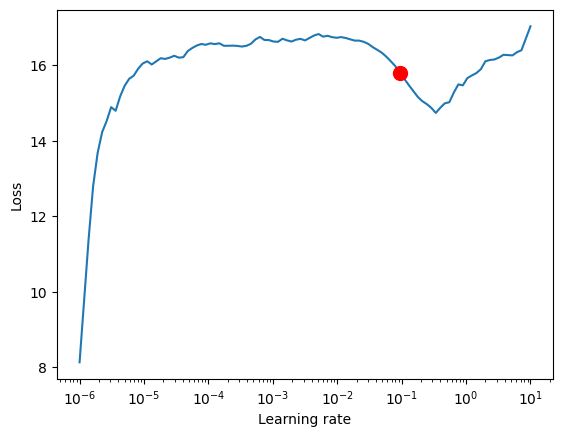

In [ ]:
# find optimal learning rate
# NOTE: Got error finding optimal learning rate?

res = Tuner(trainer).lr_find(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
    max_lr=10.0,
    min_lr=1e-6,
    early_stop_threshold=None
)



print(f"suggested learning rate: {res.suggestion()}")
fig = res.plot(show=True, suggest=True)
fig.show()

In [ ]:
# from pytorch_lightning.callbacks import ModelCheckpoint

val_dataset = TimeSeriesDataSet(
    X_initial_tft_val,
    time_idx="time_idx",
    target="Close",
    group_ids=["group_id"],
    min_encoder_length=max_encoder_length,  # Adjust as per your requirement
    max_encoder_length=max_encoder_length,
    min_prediction_length=max_prediction_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=[],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=['20_day_SMA', 'RSI', 'ROC', 'Volatility', 'T10Y2Y',
       'CCSA', 'DGORDER', 'NFLX_Sentiment Score', 'AAPL_Sentiment Score',
       'MSFT_Sentiment Score', 'AMZN_Sentiment Score', 'RF_positive_count',
       'RF_total_positive_score', 'RF_negative_count',
       'RF_total_negative_score', 'RF_count', 'RF_avg_sentiment_score',
       'MDA_positive_count', 'MDA_total_positive_score', 'MDA_negative_count',
       'MDA_total_negative_score', 'MDA_count', 'MDA_avg_sentiment_score', "Open", "High", "Low", "Close", "Volume"],
    allow_missing_timesteps=True,
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
)

# Convert the test dataset to a DataLoader
val_dataloader = val_dataset.to_dataloader(train=False, batch_size=batch_size, num_workers=0, shuffle=False)
print(f"Number of validation batches: {len(val_dataloader)}")

Number of validation batches: 7


In [ ]:
# configure network and trainer
early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=False, mode="min")
lr_logger = LearningRateMonitor()  # log the learning rate
logger = TensorBoardLogger("lightning_logs")  # logging results to a tensorboard

trainer = pl.Trainer(
    max_epochs=100,
    accelerator="cpu",
    enable_model_summary=True,
    gradient_clip_val=0.1,
    limit_train_batches=50,  # coment in for training, running valiation every 30 batches
    # fast_dev_run=True,  # comment in to check that networkor dataset has no serious bugs
    callbacks=[lr_logger, early_stop_callback],
    logger=logger,
)

# Note: learning rate should be adjusted based on recommended options from hyperparameter tuning
tft = TemporalFusionTransformer.from_dataset(
    dataset,
    learning_rate= res.suggestion(),
    hidden_size=16,
    attention_head_size=2,
    dropout=0.1,
    hidden_continuous_size=8,
    loss=MAE(),
    log_interval=10,  # uncomment for learning rate finder and otherwise, e.g. to 10 for logging every 10 batches
    optimizer="Ranger",
    reduce_on_plateau_patience=4,
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Number of parameters in network: 36.8k


/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/parsing.py:199: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/parsing.py:199: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.


In [ ]:
print(f"Train dataset length: {len(train_dataloader.dataset)}")
print(f"Validation dataset length: {len(val_dataloader.dataset)}")
print(f"Number of training batches: {len(train_dataloader)}")
print(f"Number of validation batches: {len(val_dataloader)}")

Train dataset length: 3968
Validation dataset length: 870
Number of training batches: 31
Number of validation batches: 7


In [ ]:
# fit network
trainer.fit(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,

)

INFO: 
   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | MAE                             | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 0     
3  | prescalers                         | ModuleDict                      | 512   
4  | static_variable_selection          | VariableSelectionNetwork        | 1.7 K 
5  | encoder_variable_selection         | VariableSelectionNetwork        | 20.7 K
6  | decoder_variable_selection         | VariableSelectionNetwork        | 528   
7  | static_context_variable_selection  | GatedResidualNetwork            | 1.1 K 
8  | static_context_initial_hidden_lstm | GatedResidualNetwork            | 1.1 K 
9  | static_context_initial_cell_lstm   | GatedResidualNetwork            

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (31) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

##### Load the best model according to the validation loss

In [ ]:
best_model_path = trainer.checkpoint_callback.best_model_path
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)

##### Determining the accuracy on the validation dataset

In [ ]:
val_dataset = TimeSeriesDataSet(
    X_initial_tft_val,
    time_idx="time_idx",
    target="Close",
    group_ids=["group_id"],
    min_encoder_length=max_encoder_length,  # Adjust as per your requirement
    max_encoder_length=max_encoder_length,
    min_prediction_length=max_prediction_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=[],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=['20_day_SMA', 'RSI', 'ROC', 'Volatility', 'T10Y2Y',
       'CCSA', 'DGORDER', 'NFLX_Sentiment Score', 'AAPL_Sentiment Score',
       'MSFT_Sentiment Score', 'AMZN_Sentiment Score', 'RF_positive_count',
       'RF_total_positive_score', 'RF_negative_count',
       'RF_total_negative_score', 'RF_count', 'RF_avg_sentiment_score',
       'MDA_positive_count', 'MDA_total_positive_score', 'MDA_negative_count',
       'MDA_total_negative_score', 'MDA_count', 'MDA_avg_sentiment_score', "Open", "High", "Low", "Close", "Volume"],
    allow_missing_timesteps=True,
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
)

# Convert the test dataset to a DataLoader
val_dataloader = val_dataset.to_dataloader(train=False, batch_size=batch_size, num_workers=0, shuffle=False)

# Now, use the trained model to make predictions on the test set
predictions = trainer.test(
    best_tft,
    dataloaders=val_dataloader,
)

pred = best_tft.predict(
    val_dataloader,
    mode = "raw",
    return_x = True
)

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_MAE          │    4.2751946449279785     │
│         test_MAPE         │   0.037009499967098236    │
│         test_RMSE         │     5.295012950897217     │
│        test_SMAPE         │    0.03642602637410164    │
│         test_loss         │    4.2751946449279785     │
└───────────────────────────┴───────────────────────────┘

In [ ]:
decoder_time_idx = pred.x['decoder_time_idx']

time_idx_list_1 = decoder_time_idx[:,0].numpy()
time_idx_list_2 = decoder_time_idx[:,1].numpy()
time_idx_list_3 = decoder_time_idx[:,2].numpy()

filtered_df_true_1_date = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_list_1)]['Date']
filtered_df_true_2_date = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_list_2)]['Date']
filtered_df_true_3_date = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_list_3)]['Date']

concatenated_array_true_date = [filtered_df_true_1_date, filtered_df_true_2_date, filtered_df_true_3_date]
# print(concatenated_array_true_date)

filtered_df_true_1_close = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_list_1)]['Close']
filtered_df_true_2_close = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_list_2)]['Close']
filtered_df_true_3_close = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_list_3)]['Close']

concatenated_array_true = [filtered_df_true_1_close, filtered_df_true_2_close, filtered_df_true_3_close]
# print(concatenated_array_true)

In [ ]:
time_idx_np = decoder_time_idx.numpy()  # Convert time_idx tensor to numpy array
true_values_np = X_initial_tft_val['Close'].to_numpy()  # Convert true values tensor to numpy array
predicted_values_np = pred.output.prediction.numpy().squeeze()  # Convert predicted values tensor to numpy array

# This gives you an idea of whether duplicate time_idx values are causing the discrepancy

print(time_idx_np.shape)
print(predicted_values_np.shape)

filtered_df_predicted_1_date = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_np[:,0])]['Date']
filtered_df_predicted_2_date = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_np[:,1])]['Date']
filtered_df_predicted_3_date = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_np[:,2])]['Date']


concatenated_array_date = [filtered_df_predicted_1_date, filtered_df_predicted_2_date, filtered_df_predicted_3_date]


filtered_df_predicted_1 = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_np[:,0])]
filtered_df_predicted_2 = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_np[:,1])]
filtered_df_predicted_3 = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_np[:,2])]


# print(predicted_values_np.shape)
# print(time_idx_np[:,0])
# print(filtered_df_predicted_2_date)

indexes_predicted_1 = np.nonzero(np.isin(time_idx_np[:,0], filtered_df_predicted_1['time_idx']).flatten())[0]
indexes_predicted_2 = np.nonzero(np.isin(time_idx_np[:,1], filtered_df_predicted_2['time_idx']).flatten())[0]
indexes_predicted_3 = np.nonzero(np.isin(time_idx_np[:,2], filtered_df_predicted_3['time_idx']).flatten())[0]

# print(len(indexes_predicted_1))

filtered_predicted_values_np_1 = predicted_values_np[indexes_predicted_1][:,0]
filtered_predicted_values_np_2 = predicted_values_np[indexes_predicted_2][:,1]
filtered_predicted_values_np_3 = predicted_values_np[indexes_predicted_3][:,2]


# Convert each 1D array to a 2D array of shape (819, 1)
filtered_predicted_values_np_1_2d = np.expand_dims(filtered_predicted_values_np_1, axis=1)
filtered_predicted_values_np_2_2d = np.expand_dims(filtered_predicted_values_np_2, axis=1)
filtered_predicted_values_np_3_2d = np.expand_dims(filtered_predicted_values_np_3, axis=1)


# Concatenate the arrays to get an array of predicted values
concatenated_array = []
concatenated_array = [filtered_predicted_values_np_1, filtered_predicted_values_np_2, filtered_predicted_values_np_3]

# Print the shape to confirm
print(concatenated_array[0][-5:])
print(concatenated_array[1][-5:])
print(concatenated_array[2][-5:])

(870, 3)
(870, 3)
[191.2793  190.19458 190.2377  190.24261 189.69183]
[190.87674 190.38905 190.37576 190.34093 189.76888]
[190.42978 190.37881 190.31982 189.82663 189.76556]


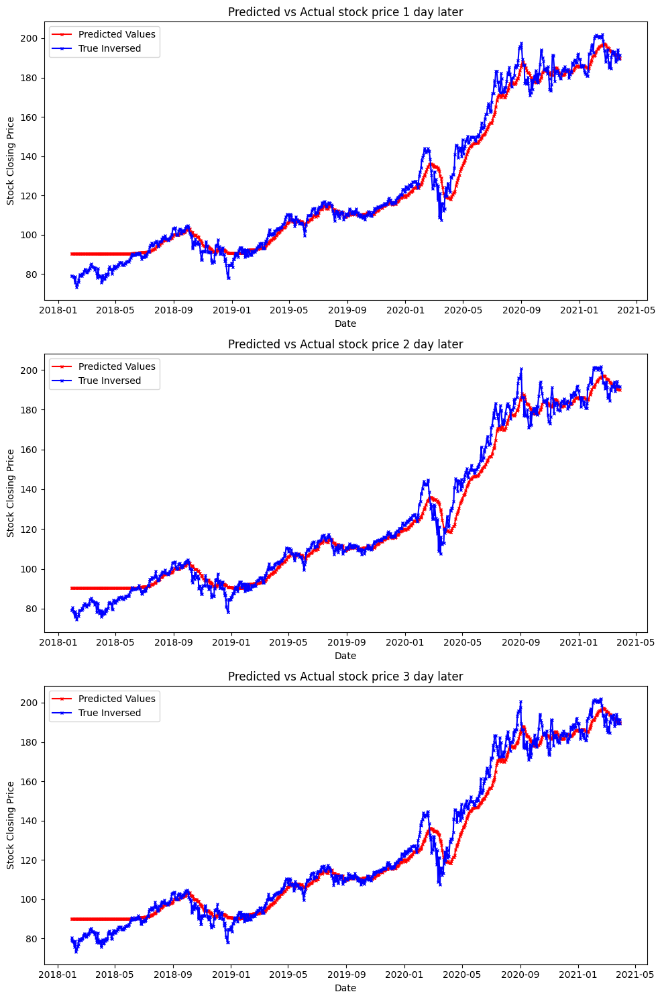

In [ ]:
# Convert your tensors to numpy arrays (assuming they are already tensors)

# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 15))  # Create 3 subplots vertically


for i in range(3):  # Assuming 3 features
    axs[i].plot(concatenated_array_date[i], concatenated_array[i], label='Predicted Values', marker='x', linestyle='-', color='red', markersize=3)
    axs[i].plot(concatenated_array_true_date[i], concatenated_array_true[i], label='True Inversed', marker='x', linestyle='-', markersize=3, color = "blue")
    axs[i].set_title(f'Predicted vs Actual stock price {i+1} day later')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Stock Closing Price')
    axs[i].legend()

plt.tight_layout()
plt.show()

In [ ]:
concatenated_array_true = [np.array(subarray) for subarray in concatenated_array_true]

concatenated_array_true_date_final = concatenated_array_true_date.copy()
for i, series in enumerate(concatenated_array_true_date_final):
    concatenated_array_true_date_final[i] = series - pd.Timedelta(days=i+1)

In [ ]:
# Create a dictionary to store the data for prediction
data_dict = {}

for index, d in enumerate(concatenated_array_date):
    for date_idx, date in enumerate(d):
        if date not in data_dict:
            # Initialize an empty list that will store values from all arrays for this date
            data_dict[date] = [None] * len(concatenated_array_date)
        # Insert the value in the correct position
        data_dict[date][index] = concatenated_array[index][date_idx]

# Create a list of dates and corresponding values for prediction data in final_pred_data
final_pred_data = []
for date, values in sorted(data_dict.items()):
    final_pred_data.append([date] + values)

# Define headers
headers_pred = ['Date'] + [f'Predicted_values_from_{i}_day_back' for i in range(len(concatenated_array))]


# Create a dictionary to store the data for prediction
data_dict = {}

for index, d in enumerate(concatenated_array_true_date_final):
    for date_idx, date in enumerate(d):
        if date not in data_dict:
            # Initialize an empty list that will store values from all arrays for this date
            data_dict[date] = [None] * len(concatenated_array_true_date_final)
        # Insert the value in the correct position
        data_dict[date][index] = concatenated_array_true[index][date_idx]

# Create a list of dates and corresponding values for prediction data in final_pred_data
final_true_data = []
for date, values in sorted(data_dict.items()):
    final_true_data.append([date] + values)

# Define headers
headers_true = ['Date'] + [f'True_values_from_{i}_day_back' for i in range(len(concatenated_array_true))]

# print(final_pred_data)
# print(final_true_data)

In [ ]:
# Convert arrays to DataFrames
columns = ['date', '+1 timestep', '+2 timestep', '+3 timestep']
df_pred = pd.DataFrame(final_pred_data, columns=columns)
df_true = pd.DataFrame(final_true_data, columns=columns)

# Convert date columns to datetime and data columns to numeric
df_pred['date'] = pd.to_datetime(df_pred['date'])
df_true['date'] = pd.to_datetime(df_true['date'])
for col in columns[1:]:
    df_pred[col] = pd.to_numeric(df_pred[col], errors='coerce')
    df_true[col] = pd.to_numeric(df_true[col], errors='coerce')

# Stack and dropna to filter out None or NaN entries
stacked_pred = df_pred.set_index('date')[columns[1:]].stack(dropna=True)
stacked_true = df_true.set_index('date')[columns[1:]].stack(dropna=True)

# Align predictions and true values by their index (date and timestep)
aligned_data = pd.DataFrame({'pred': stacked_pred, 'true': stacked_true}).dropna()

# Calculate combined MSE, RMSE, and R^2
mse = mean_squared_error(aligned_data['true'], aligned_data['pred'])
rmse = np.sqrt(mse)
r2_value = r2_score(aligned_data['true'], aligned_data['pred'])

print(f"Combined MSE: {mse}")
print(f"Combined RMSE: {rmse}")
print(f"Combined R^2: {r2_value}")

Combined MSE: 37.943962355999716
Combined RMSE: 6.159867072916405
Combined R^2: 0.9709762960240661


##### Determining accuracy on test dataset

In [ ]:
# Create a TimeSeriesDataSet for the test data

test_dataset = TimeSeriesDataSet(
    X_initial_tft_test,
    time_idx="time_idx",
    target="Close",
    group_ids=["group_id"],
    min_encoder_length=max_encoder_length,  # Adjust as per your requirement
    max_encoder_length=max_encoder_length,
    min_prediction_length=max_prediction_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=[],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=['20_day_SMA', 'RSI', 'ROC', 'Volatility', 'T10Y2Y',
       'CCSA', 'DGORDER', 'NFLX_Sentiment Score', 'AAPL_Sentiment Score',
       'MSFT_Sentiment Score', 'AMZN_Sentiment Score', 'RF_positive_count',
       'RF_total_positive_score', 'RF_negative_count',
       'RF_total_negative_score', 'RF_count', 'RF_avg_sentiment_score',
       'MDA_positive_count', 'MDA_total_positive_score', 'MDA_negative_count',
       'MDA_total_negative_score', 'MDA_count', 'MDA_avg_sentiment_score', "Open", "High", "Low", "Close", "Volume"],
    allow_missing_timesteps=True,
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
)


# Convert the test dataset to a DataLoader
test_dataloader = test_dataset.to_dataloader(train=False, batch_size=batch_size, num_workers=0, shuffle=False)

# Now, use the trained model to make predictions on the test set
predictions = trainer.test(
    best_tft,
    dataloaders=test_dataloader,
)

pred = best_tft.predict(
    test_dataloader,
    mode = "raw",
    return_x = True)

# print(pred)

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_MAE          │     8.883658409118652     │
│         test_MAPE         │    0.04323187842965126    │
│         test_RMSE         │     10.75219440460205     │
│        test_SMAPE         │    0.04175537824630737    │
│         test_loss         │     8.883658409118652     │
└───────────────────────────┴───────────────────────────┘

In [ ]:
decoder_time_idx = pred.x['decoder_time_idx']

time_idx_list_1 = decoder_time_idx[:,0].numpy()
time_idx_list_2 = decoder_time_idx[:,1].numpy()
time_idx_list_3 = decoder_time_idx[:,2].numpy()


filtered_df_true_1_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_1)]['Date']
filtered_df_true_2_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_2)]['Date']
filtered_df_true_3_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_3)]['Date']

concatenated_array_true_date = [filtered_df_true_1_date, filtered_df_true_2_date, filtered_df_true_3_date]
# print(concatenated_array_true_date)

filtered_df_true_1_close = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_1)]['Close']
filtered_df_true_2_close = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_2)]['Close']
filtered_df_true_3_close = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_3)]['Close']

concatenated_array_true = [filtered_df_true_1_close, filtered_df_true_2_close, filtered_df_true_3_close]
# print(concatenated_array_true)

In [ ]:
time_idx_np = decoder_time_idx.numpy()  # Convert time_idx tensor to numpy array
true_values_np = X_initial_tft_test['Close'].to_numpy()  # Convert true values tensor to numpy array
predicted_values_np = pred.output.prediction.numpy().squeeze()  # Convert predicted values tensor to numpy array

# This gives you an idea of whether duplicate time_idx values are causing the discrepancy

print(time_idx_np.shape)
print(predicted_values_np.shape)

filtered_df_predicted_1_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,0])]['Date']
filtered_df_predicted_2_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,1])]['Date']
filtered_df_predicted_3_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,2])]['Date']


concatenated_array_date = [filtered_df_predicted_1_date, filtered_df_predicted_2_date, filtered_df_predicted_3_date]


filtered_df_predicted_1 = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,0])]
filtered_df_predicted_2 = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,1])]
filtered_df_predicted_3 = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,2])]


indexes_predicted_1 = np.nonzero(np.isin(time_idx_np[:,0], filtered_df_predicted_1['time_idx']).flatten())[0]
indexes_predicted_2 = np.nonzero(np.isin(time_idx_np[:,1], filtered_df_predicted_2['time_idx']).flatten())[0]
indexes_predicted_3 = np.nonzero(np.isin(time_idx_np[:,2], filtered_df_predicted_3['time_idx']).flatten())[0]

# print(len(indexes_predicted_1))

filtered_predicted_values_np_1 = predicted_values_np[indexes_predicted_1][:,0]
filtered_predicted_values_np_2 = predicted_values_np[indexes_predicted_2][:,1]
filtered_predicted_values_np_3 = predicted_values_np[indexes_predicted_3][:,2]


# Convert each 1D array to a 2D array of shape (819, 1)
filtered_predicted_values_np_1_2d = np.expand_dims(filtered_predicted_values_np_1, axis=1)
filtered_predicted_values_np_2_2d = np.expand_dims(filtered_predicted_values_np_2, axis=1)
filtered_predicted_values_np_3_2d = np.expand_dims(filtered_predicted_values_np_3, axis=1)


# Concatenate the arrays to get a shape of (819, 3)
concatenated_array = []
concatenated_array = [filtered_predicted_values_np_1, filtered_predicted_values_np_2, filtered_predicted_values_np_3]

# Print the shape to confirm
print(concatenated_array[0][-5:])
print(concatenated_array[1][-5:])
print(concatenated_array[2][-5:])

(918, 3)
(918, 3)
[295.06702 294.99805 295.09302 296.5945  296.98358]
[295.1445  295.22656 296.32285 296.67853 297.0651 ]
[295.9464  296.32596 296.68393 297.07285 298.84125]


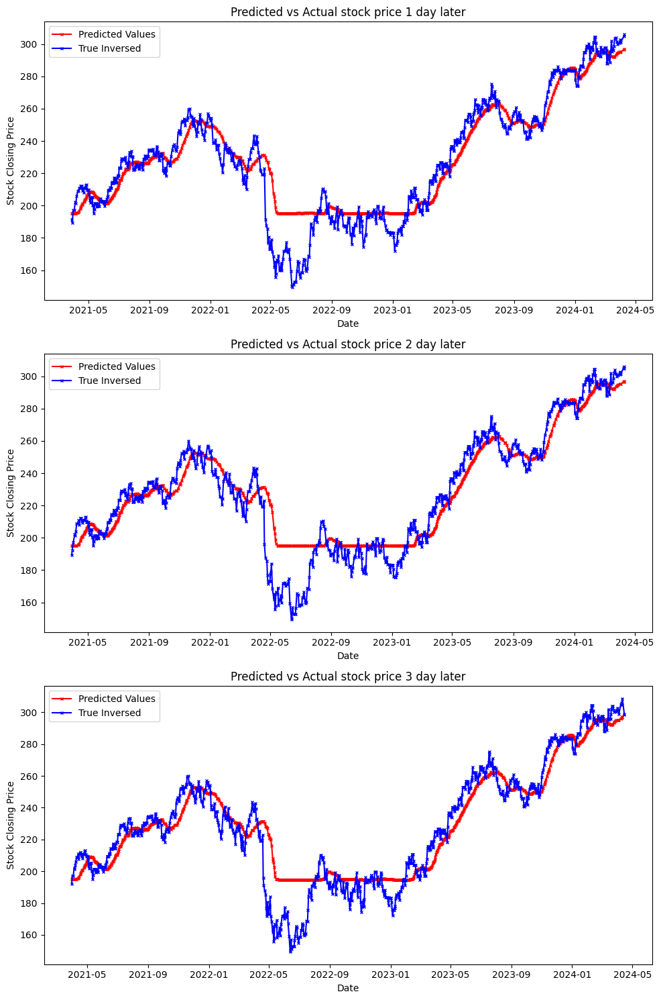

In [ ]:
# Convert your tensors to numpy arrays (assuming they are already tensors)

# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 15))  # Create 3 subplots vertically


for i in range(3):  # Assuming 3 features
    axs[i].plot(concatenated_array_date[i], concatenated_array[i], label='Predicted Values', marker='x', linestyle='-', color='red', markersize=3)
    axs[i].plot(concatenated_array_true_date[i], concatenated_array_true[i], label='True Inversed', marker='x', linestyle='-', markersize=3, color = "blue")
    axs[i].set_title(f'Predicted vs Actual stock price {i+1} day later')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Stock Closing Price')
    axs[i].legend()

plt.tight_layout()
plt.show()

In [ ]:
concatenated_array_true = [np.array(subarray) for subarray in concatenated_array_true]

concatenated_array_true_date_final = concatenated_array_true_date.copy()
for i, series in enumerate(concatenated_array_true_date_final):
    concatenated_array_true_date_final[i] = series - pd.Timedelta(days=i+1)


In [ ]:
# Create a dictionary to store the data for prediction
data_dict = {}

for index, d in enumerate(concatenated_array_date):
    for date_idx, date in enumerate(d):
        if date not in data_dict:
            # Initialize an empty list that will store values from all arrays for this date
            data_dict[date] = [None] * len(concatenated_array_date)
        # Insert the value in the correct position
        data_dict[date][index] = concatenated_array[index][date_idx]

# Create a list of dates and corresponding values for prediction data in final_pred_data
final_pred_data = []
for date, values in sorted(data_dict.items()):
    final_pred_data.append([date] + values)

# Define headers
headers_pred = ['Date'] + [f'Predicted_values_from_{i}_day_back' for i in range(len(concatenated_array))]


# Create a dictionary to store the data for prediction
data_dict = {}

for index, d in enumerate(concatenated_array_true_date_final):
    for date_idx, date in enumerate(d):
        if date not in data_dict:
            # Initialize an empty list that will store values from all arrays for this date
            data_dict[date] = [None] * len(concatenated_array_true_date_final)
        # Insert the value in the correct position
        data_dict[date][index] = concatenated_array_true[index][date_idx]

# Create a list of dates and corresponding values for prediction data in final_pred_data
final_true_data = []
for date, values in sorted(data_dict.items()):
    final_true_data.append([date] + values)

# Define headers
headers_true = ['Date'] + [f'True_values_from_{i}_day_back' for i in range(len(concatenated_array_true))]


# print(final_pred_data)
# print(final_true_data)

In [ ]:
# Convert arrays to DataFrames
columns = ['date', '+1 timestep', '+2 timestep', '+3 timestep']
df_pred = pd.DataFrame(final_pred_data, columns=columns)
df_true = pd.DataFrame(final_true_data, columns=columns)

# Convert date columns to datetime and data columns to numeric
df_pred['date'] = pd.to_datetime(df_pred['date'])
df_true['date'] = pd.to_datetime(df_true['date'])
for col in columns[1:]:
    df_pred[col] = pd.to_numeric(df_pred[col], errors='coerce')
    df_true[col] = pd.to_numeric(df_true[col], errors='coerce')

# Stack and dropna to filter out None or NaN entries
stacked_pred = df_pred.set_index('date')[columns[1:]].stack(dropna=True)
stacked_true = df_true.set_index('date')[columns[1:]].stack(dropna=True)

# Align predictions and true values by their index (date and timestep)
aligned_data = pd.DataFrame({'pred': stacked_pred, 'true': stacked_true}).dropna()

# Calculate combined MSE, RMSE, and R^2
mse = mean_squared_error(aligned_data['true'], aligned_data['pred'])
rmse = np.sqrt(mse)
r2_value = r2_score(aligned_data['true'], aligned_data['pred'])

print(f"Combined MSE: {mse}")
print(f"Combined RMSE: {rmse}")
print(f"Combined R^2: {r2_value}")

Combined MSE: 147.3879158091528
Combined RMSE: 12.1403424914272
Combined R^2: 0.8829273932236148


### Predicting for stock using 80-10-10 train-val-test split

#### Loading specific dataset for training and testing (For LSTM and GRU)

In [ ]:
# X = X.loc[:len(df_merged) * 0.80+50]
# Y = y.loc[:len(df_merged) * 0.80 + 80]
# Date = date_initial.loc[:len(df_merged) * 0.80 + 80]
X = X_initial.copy()
Y = y_initial.copy()
Date = date_initial.copy()

print(X.shape)
print(Y.shape)
print(Date.shape)

# Normalisation
sc = MinMaxScaler()
train = sc.fit_transform(X.loc[0: len(X) * 0.8])
val = sc.transform(X.loc[len(X)* 0.8 - 10: len(X) * 0.9])
test = sc.transform(X.loc[len(X) * 0.9  - 10:])


sc2 = MinMaxScaler()
train2 = sc2.fit_transform(Y.loc[0: len(Y) * 0.8].to_numpy().reshape(-1, 1))
val2 = sc2.transform(Y.loc[len(Y)* 0.8 - 10: len(Y) * 0.9].to_numpy().reshape(-1, 1))
test2 = sc2.transform(Y.loc[len(Y) * 0.9 - 10:].to_numpy().reshape(-1, 1))

Date_val = Date.loc[len(Date)* 0.8: len(Date) * 0.9 - 3]
Date_test = Date.loc[len(Date) * 0.9: len(Date) - 3]

print(train.shape,val.shape,test.shape)
print(train2.shape,val2.shape,test2.shape)

(6754, 30)
(6754,)
(6754,)
(5403, 30) (685, 30) (686, 30)
(5403, 1) (685, 1) (686, 1)


#### For LSTM

##### Hyperparameter tuning, training models

In [ ]:
# hps vlaues are to be removed for new run of tuner.search

!rm -rf ./untitled_project  # Be cautious with this command to avoid deleting unintended files

In [ ]:
# Remember to change the modle builder depending on whether you are trying out GRU or LSTm

timesteps = 10

tuner = kt.Hyperband(model_builder_LSTM,
                     objective='val_loss',
                     max_epochs=100)

# print(df_merged[11 : 14]['Close'])

X_train = []
Y_train = []
X_val = []
Y_val = []


# Loop for training data
for i in range(timesteps, train.shape[0] - timesteps):
    X_train.append(train[i-timesteps:i])
    Y_train.append(train[i+1 : i+4, 3])
X_train,y_train = np.array(X_train),np.array(Y_train)

# Loop for val data
for i in range(timesteps, val.shape[0] - timesteps):
    X_val.append(val[i-timesteps:i])
    Y_val.append(val[i+1 : i+4, 3])
X_val,y_val = np.array(X_val),np.array(Y_val)

# X_train = np.delete(X_train, 0, axis=1)
print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)

# print(X_train[0])

tuner.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val), callbacks=[stop_early])
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

Trial 53 Complete [00h 00m 20s]
val_loss: 0.0564570426940918

Best val_loss So Far: 0.015865840017795563
Total elapsed time: 00h 26m 20s


In [ ]:
print(best_hps)
print(best_hps.values)

{'units': 512, 'dense_units': 128, 'tuner/epochs': 2, 'tuner/initial_epoch': 0, 'tuner/bracket': 4, 'tuner/round': 0}


In [ ]:
model = tuner.hypermodel.build(best_hps)
history = model.fit(X_train, y_train, epochs=1000, validation_data=(X_val, y_val),
                    callbacks=[stop_early])
val_loss = history.history['val_loss']

Epoch 1/1000
169/169 [==============================] - 27s 143ms/step - loss: 0.0023 - mae: 0.0187 - val_loss: 0.0399 - val_mae: 0.1854
Epoch 2/1000
169/169 [==============================] - 23s 138ms/step - loss: 1.3829e-04 - mae: 0.0083 - val_loss: 0.0279 - val_mae: 0.1517
Epoch 3/1000
169/169 [==============================] - 24s 141ms/step - loss: 1.1919e-04 - mae: 0.0077 - val_loss: 0.0401 - val_mae: 0.1863
Epoch 4/1000
169/169 [==============================] - 24s 142ms/step - loss: 1.3238e-04 - mae: 0.0081 - val_loss: 0.0385 - val_mae: 0.1824
Epoch 5/1000
169/169 [==============================] - 23s 134ms/step - loss: 1.0631e-04 - mae: 0.0072 - val_loss: 0.0332 - val_mae: 0.1689


In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 512)               1112064   
                                                                 
 dense_2 (Dense)             (None, 128)               65664     
                                                                 
 dense_3 (Dense)             (None, 3)                 387       
                                                                 
Total params: 1178115 (4.49 MB)
Trainable params: 1178115 (4.49 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


##### Predicting Validation dataset

In [ ]:
timesteps = 10

In [ ]:
# mse,rmse,r2_value,true,predicted = evaluate_model(model,test,timesteps)
true, predicted = evaluate_model(model,val,timesteps)

# print("MSE =",mse)
# print("RMSE =",rmse)
# print("R2-Score =",r2_value)

print(predicted.shape)
print(true.shape)

21/21 [==============================] - 1s 35ms/step
(672, 3)
(672, 3)


In [ ]:
predicted_inversed = np.zeros(predicted.shape)
true_inversed = np.zeros(true.shape)

for i in range(predicted.shape[1]):  # Loop over each feature
    predicted_inversed[:, i] = sc2.inverse_transform(predicted[:, i].reshape(-1, 1)).flatten()
    true_inversed[:, i] = sc2.inverse_transform(true[:, i].reshape(-1, 1)).flatten()

mse = mean_squared_error(true_inversed, predicted_inversed)
rmse = sqrt(mse)
r2_value = r2_score(true_inversed ,predicted_inversed)


# print(predicted_inversed)
# print(true_inversed)

print("MSE =",mse)
print("RMSE =",rmse)
print("R2-Score =",r2_value)

MSE = 689.0548237532367
RMSE = 26.249853785368725
R2-Score = 0.3936159689555178


In [ ]:
Date_val = pd.to_datetime(Date_val)
print(Date_val.shape)
print(predicted_inversed[:,0].shape)
print(predicted_inversed[:,1].shape)
print(predicted_inversed[:,2].shape)

(672,)
(672,)
(672,)
(672,)


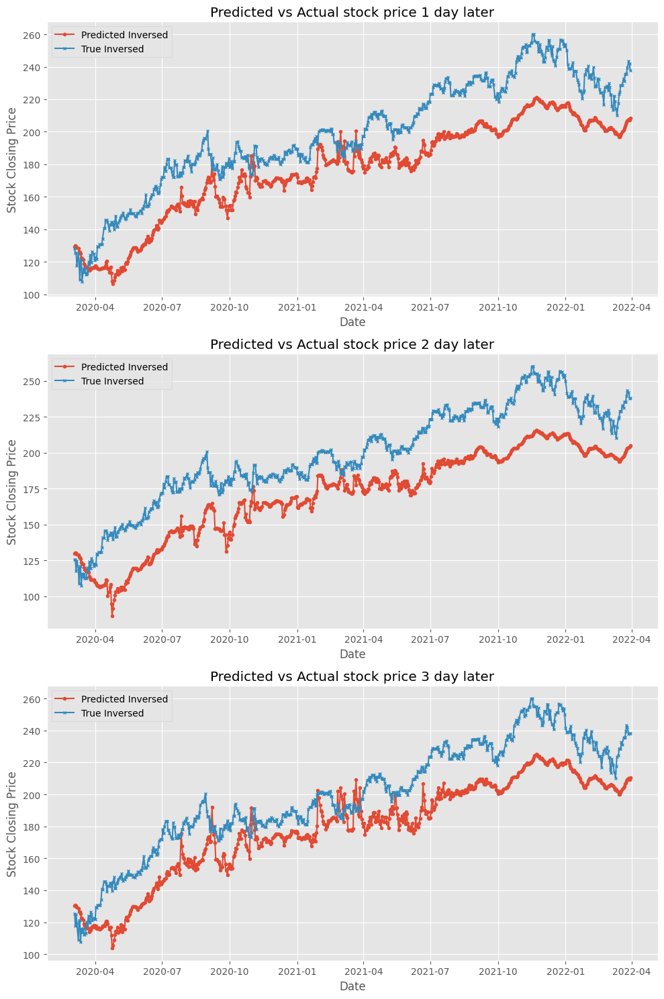

In [ ]:
# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 15))  # Create 3 subplots vertically


for i in range(3):  # Assuming 3 features
    axs[i].plot(Date_val, predicted_inversed[:, i], label='Predicted Inversed', marker='o', linestyle='-', markersize=3)
    axs[i].plot(Date_val, true_inversed[:, i], label='True Inversed', marker='x', linestyle='-', markersize=3)
    axs[i].set_title(f'Predicted vs Actual stock price {i+1} day later')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Stock Closing Price')
    axs[i].legend()

plt.tight_layout()
plt.show()


##### Predicting Test dataset


In [ ]:
# mse,rmse,r2_value,true,predicted = evaluate_model(model,test,timesteps)
true, predicted = evaluate_model(model,test,timesteps)

# print("MSE =",mse)
# print("RMSE =",rmse)
# print("R2-Score =",r2_value)

print(predicted.shape)
print(true.shape)

22/22 [==============================] - 2s 48ms/step
(673, 3)
(673, 3)


In [ ]:
predicted_inversed = np.zeros(predicted.shape)
true_inversed = np.zeros(true.shape)

for i in range(predicted.shape[1]):  # Loop over each feature
    predicted_inversed[:, i] = sc2.inverse_transform(predicted[:, i].reshape(-1, 1)).flatten()
    true_inversed[:, i] = sc2.inverse_transform(true[:, i].reshape(-1, 1)).flatten()

mse = mean_squared_error(true_inversed, predicted_inversed)
rmse = sqrt(mse)
r2_value = r2_score(true_inversed ,predicted_inversed)


# print(predicted_inversed)
# print(true_inversed)

print("MSE =",mse)
print("RMSE =",rmse)
print("R2-Score =",r2_value)

MSE = 1151.8157462709257
RMSE = 33.93841107463527
R2-Score = 0.40274072229684493


In [ ]:
Date_test = pd.to_datetime(Date_test)
print(Date_test.shape)
print(predicted_inversed[:,1].shape)

(673,)
(673,)


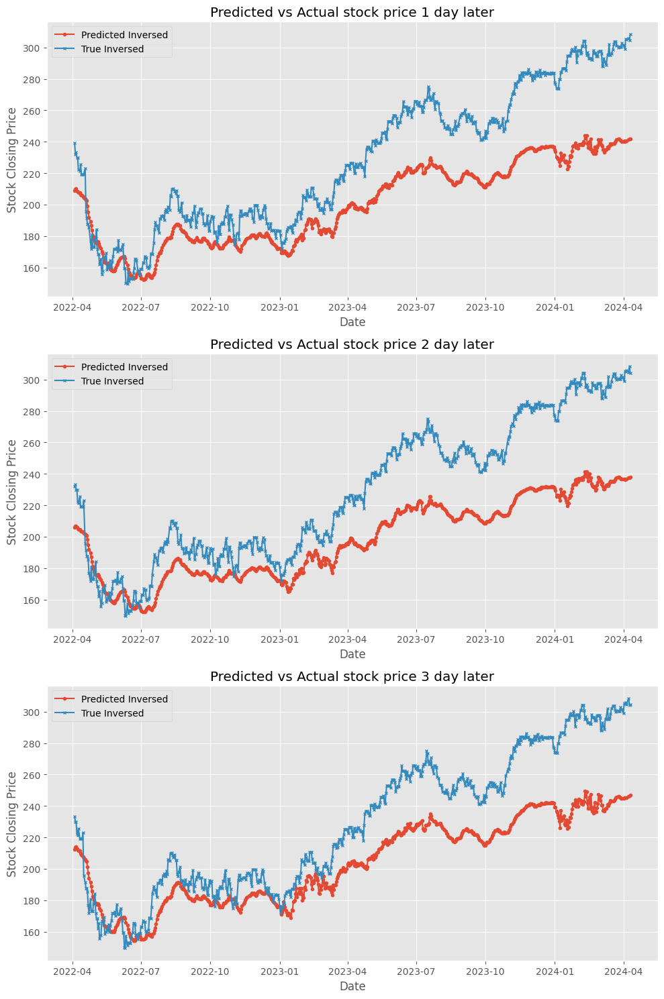

In [ ]:
# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 15))  # Create 3 subplots vertically


for i in range(3):  # Assuming 3 features
    axs[i].plot(Date_test, predicted_inversed[:, i], label='Predicted Inversed', marker='o', linestyle='-', markersize=3)
    axs[i].plot(Date_test, true_inversed[:, i], label='True Inversed', marker='x', linestyle='-', markersize=3)
    axs[i].set_title(f'Predicted vs Actual stock price {i+1} day later')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Stock Closing Price')
    axs[i].legend()

plt.tight_layout()
plt.show()


#### For GRU

##### Hyperparameter tuning, training models

In [ ]:
# hps vlaues are to be removed for new run of tuner.search

!rm -rf ./untitled_project  # Be cautious with this command to avoid deleting unintended files

In [ ]:
# Remember to change the modle builder depending on whether you are trying out GRU or LSTm

timesteps = 10

tuner = kt.Hyperband(model_builder_GRU,
                     objective='val_loss',
                     max_epochs=100)

# print(df_merged[11 : 14]['Close'])

X_train = []
Y_train = []
X_val = []
Y_val = []


# Loop for training data
for i in range(timesteps, train.shape[0] - timesteps):
    X_train.append(train[i-timesteps:i])
    Y_train.append(train[i+1 : i+4, 3])
X_train,y_train = np.array(X_train),np.array(Y_train)

# Loop for val data
for i in range(timesteps, val.shape[0] - timesteps):
    X_val.append(val[i-timesteps:i])
    Y_val.append(val[i+1 : i+4, 3])
X_val,y_val = np.array(X_val),np.array(Y_val)

# X_train = np.delete(X_train, 0, axis=1)
print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)

# print(X_train[0])

tuner.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val), callbacks=[stop_early])
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

Trial 61 Complete [00h 00m 24s]
val_loss: 0.017302123829722404

Best val_loss So Far: 0.004755245056003332
Total elapsed time: 00h 21m 38s


In [ ]:
print(best_hps)
print(best_hps.values)

{'units': 512, 'dense_units': 32, 'tuner/epochs': 2, 'tuner/initial_epoch': 0, 'tuner/bracket': 4, 'tuner/round': 0}


In [ ]:
model = tuner.hypermodel.build(best_hps)
history = model.fit(X_train, y_train, epochs=1000, validation_data=(X_val, y_val),
                    callbacks=[stop_early])
val_loss = history.history['val_loss']

Epoch 1/1000
169/169 [==============================] - 17s 88ms/step - loss: 0.0017 - mae: 0.0187 - val_loss: 0.0097 - val_mae: 0.0794
Epoch 2/1000
169/169 [==============================] - 15s 87ms/step - loss: 9.3729e-05 - mae: 0.0068 - val_loss: 0.0091 - val_mae: 0.0804
Epoch 3/1000
169/169 [==============================] - 15s 88ms/step - loss: 8.5876e-05 - mae: 0.0064 - val_loss: 0.0098 - val_mae: 0.0858
Epoch 4/1000
169/169 [==============================] - 15s 87ms/step - loss: 1.2683e-04 - mae: 0.0080 - val_loss: 0.0158 - val_mae: 0.1088
Epoch 5/1000
169/169 [==============================] - 15s 87ms/step - loss: 7.4478e-05 - mae: 0.0059 - val_loss: 0.0095 - val_mae: 0.0815


In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_1 (GRU)                 (None, 512)               835584    
                                                                 
 dense_2 (Dense)             (None, 32)                16416     
                                                                 
 dense_3 (Dense)             (None, 3)                 99        
                                                                 
Total params: 852099 (3.25 MB)
Trainable params: 852099 (3.25 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


##### Predicting Validation dataset

In [ ]:
timesteps = 10

In [ ]:
# mse,rmse,r2_value,true,predicted = evaluate_model(model,test,timesteps)
true, predicted = evaluate_model(model,val,timesteps)

# print("MSE =",mse)
# print("RMSE =",rmse)
# print("R2-Score =",r2_value)

print(predicted.shape)
print(true.shape)

21/21 [==============================] - 1s 21ms/step
(672, 3)
(672, 3)


In [ ]:
predicted_inversed = np.zeros(predicted.shape)
true_inversed = np.zeros(true.shape)

for i in range(predicted.shape[1]):  # Loop over each feature
    predicted_inversed[:, i] = sc2.inverse_transform(predicted[:, i].reshape(-1, 1)).flatten()
    true_inversed[:, i] = sc2.inverse_transform(true[:, i].reshape(-1, 1)).flatten()

mse = mean_squared_error(true_inversed, predicted_inversed)
rmse = sqrt(mse)
r2_value = r2_score(true_inversed ,predicted_inversed)


# print(predicted_inversed)
# print(true_inversed)

print("MSE =",mse)
print("RMSE =",rmse)
print("R2-Score =",r2_value)

MSE = 194.37322808813596
RMSE = 13.941779946912659
R2-Score = 0.8287938172621235


In [ ]:
Date_val = pd.to_datetime(Date_val)
print(Date_val.shape)
print(predicted_inversed[:,1].shape)

(672,)
(672,)


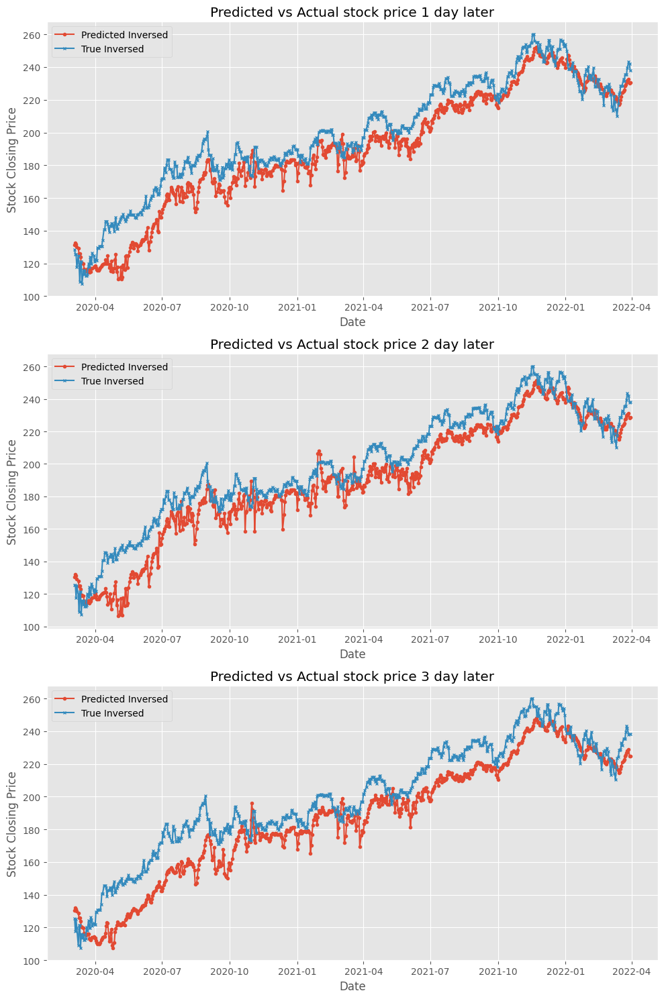

In [ ]:
# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 15))  # Create 3 subplots vertically


for i in range(3):  # Assuming 3 features
    axs[i].plot(Date_val, predicted_inversed[:, i], label='Predicted Inversed', marker='o', linestyle='-', markersize=3)
    axs[i].plot(Date_val, true_inversed[:, i], label='True Inversed', marker='x', linestyle='-', markersize=3)
    axs[i].set_title(f'Predicted vs Actual stock price {i+1} day later')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Stock Closing Price')
    axs[i].legend()

plt.tight_layout()
plt.show()

##### Predicting Test dataset

In [ ]:
# mse,rmse,r2_value,true,predicted = evaluate_model(model,test,timesteps)
true, predicted = evaluate_model(model,test,timesteps)

# print("MSE =",mse)
# print("RMSE =",rmse)
# print("R2-Score =",r2_value)

print(predicted.shape)
print(true.shape)

22/22 [==============================] - 1s 32ms/step
(673, 3)
(673, 3)


In [ ]:
predicted_inversed = np.zeros(predicted.shape)
true_inversed = np.zeros(true.shape)

for i in range(predicted.shape[1]):  # Loop over each feature
    predicted_inversed[:, i] = sc2.inverse_transform(predicted[:, i].reshape(-1, 1)).flatten()
    true_inversed[:, i] = sc2.inverse_transform(true[:, i].reshape(-1, 1)).flatten()

mse = mean_squared_error(true_inversed, predicted_inversed)
rmse = sqrt(mse)
r2_value = r2_score(true_inversed ,predicted_inversed)


# print(predicted_inversed)
# print(true_inversed)

print("MSE =",mse)
print("RMSE =",rmse)
print("R2-Score =",r2_value)

MSE = 169.8783120768164
RMSE = 13.03373745618717
R2-Score = 0.9120063940232038


In [ ]:
Date_test = pd.to_datetime(Date_test)
print(Date_test.shape)
print(predicted_inversed[:,1].shape)

(673,)
(673,)


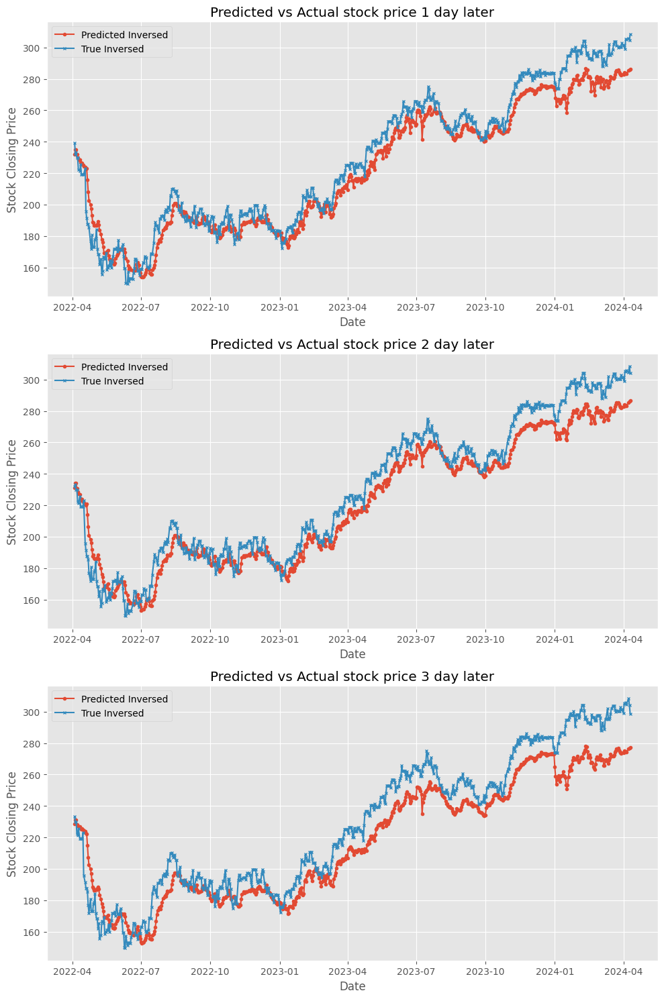

In [ ]:
# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 15))  # Create 3 subplots vertically


for i in range(3):  # Assuming 3 features
    axs[i].plot(Date_test, predicted_inversed[:, i], label='Predicted Inversed', marker='o', linestyle='-', markersize=3)
    axs[i].plot(Date_test, true_inversed[:, i], label='True Inversed', marker='x', linestyle='-', markersize=3)
    axs[i].set_title(f'Predicted vs Actual stock price {i+1} day later')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Stock Closing Price')
    axs[i].legend()

plt.tight_layout()
plt.show()

#### For Google Temporal Fusion Transformer

##### Data prep for TFT using TimeSeriesDataSet class from Lightning Pytorch

In [ ]:
# X = df_merged.drop(columns=['NFLX_Sentiment Label', 'AAPL_Sentiment Label', 'MSFT_Sentiment Label', 'AMZN_Sentiment Label' , 'ticker'])
# y = df_merged['Close']
max_prediction_length = 3
max_encoder_length = 10

# Convert the 'Date' column to datetime format
X_initial_tft['Date'] = pd.to_datetime(X_initial_tft['Date'])

# Calculate the difference in days from the minimum date
X_initial_tft['time_idx'] = (X_initial_tft['Date'] - X_initial_tft['Date'].min()).dt.days


# Creating a constant column
X_initial_tft['group_id'] = 'group'

# X_initial_tft.head()
# X_initial_tft.tail()

X_initial_tft_train = X_initial_tft.loc[:len(X_initial_tft) * 0.8]
X_initial_tft_val = X_initial_tft.loc[len(X_initial_tft) * 0.8 - max_encoder_length : len(X_initial_tft) * 0.9]
X_initial_tft_test = X_initial_tft.loc[len(X_initial_tft) * 0.9 - max_encoder_length : len(X_initial_tft)]


print(len(X_initial_tft))
print(len(X_initial_tft_train))
print(len(X_initial_tft_val))

6754
5403
685


In [ ]:
training_cutoff = X_initial_tft_train["time_idx"].max() - max_prediction_length


dataset = TimeSeriesDataSet(
    X_initial_tft_train,
    group_ids=['group_id'],
    target="Close",
    time_idx="time_idx",
    min_encoder_length=max_encoder_length,
    max_encoder_length=max_encoder_length,
    min_prediction_length=3,
    max_prediction_length=3,
    time_varying_known_reals=[],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=['20_day_SMA', 'RSI', 'ROC', 'Volatility', 'T10Y2Y',
       'CCSA', 'DGORDER', 'NFLX_Sentiment Score', 'AAPL_Sentiment Score',
       'MSFT_Sentiment Score', 'AMZN_Sentiment Score', 'RF_positive_count',
       'RF_total_positive_score', 'RF_negative_count',
       'RF_total_negative_score', 'RF_count', 'RF_avg_sentiment_score',
       'MDA_positive_count', 'MDA_total_positive_score', 'MDA_negative_count',
       'MDA_total_negative_score', 'MDA_count', 'MDA_avg_sentiment_score', "Open", "High", "Low", "Close", "Volume"],
    allow_missing_timesteps=True,
    add_relative_time_idx = True,
    add_target_scales=True,
    add_encoder_length=True,
    # time_varying_unknown_reals=["value"]
)


# create validation set (predict=True) which means to predict the last max_prediction_length points in time
# for each series
validation = TimeSeriesDataSet.from_dataset(dataset, X_initial_tft_val, predict=False, stop_randomization=True)

# create dataloaders for model
batch_size = 128  # set this between 32 to 128
train_dataloader = dataset.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, shuffle=False, drop_last=True, num_workers=0)

##### Hyperparameter tuning to find lr, Training model

In [ ]:
# configure network and trainer
pl.seed_everything(42)
trainer = pl.Trainer(
    accelerator="cpu",
    # clipping gradients is a hyperparameter and important to prevent divergance
    # of the gradient for recurrent neural networks
    gradient_clip_val=0.1,
)


tft = TemporalFusionTransformer.from_dataset(
    dataset,
    # not meaningful for finding the learning rate but otherwise very important
    learning_rate=0.03,
    hidden_size=8,  # most important hyperparameter apart from learning rate
    # number of attention heads. Set to up to 4 for large datasets
    attention_head_size=1,
    dropout=0.1,  # between 0.1 and 0.3 are good values
    hidden_continuous_size=8,  # set to <= hidden_size
    loss=RMSE(),
    optimizer="Ranger"
    # reduce learning rate if no improvement in validation loss after x epochs
    # reduce_on_plateau_patience=1000,
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/parsing.py:199: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/parsing.py:199: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.


Number of parameters in network: 17.1k


/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/utilities.py:73: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (35) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/data.py:104: Total length of `DataLoader` across ranks is zero. Please make sure this was your intention.


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=100` reached.
INFO: Learning rate set to 0.20892961308540398
INFO:lightning.pytorch.tuner.lr_finder:Learning rate set to 0.20892961308540398
INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/.lr_find_f91eb998-3738-408c-b620-5a9e5c9a186d.ckpt
INFO:pytorch_lightning.utilities.rank_zero:Restored all states from the checkpoint at /content/.lr_find_f91eb998-3738-408c-b620-5a9e5c9a186d.ckpt


suggested learning rate: 0.20892961308540398


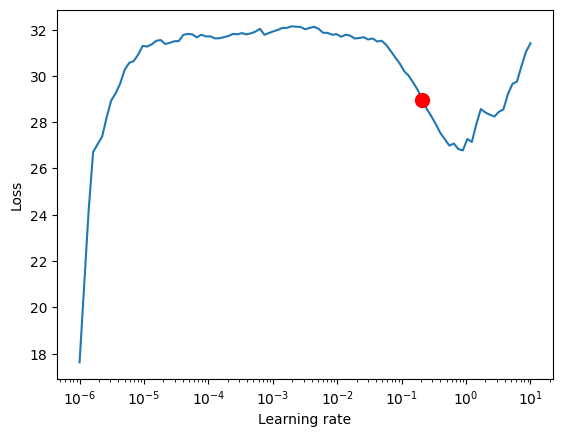

In [ ]:
# find optimal learning rate
# NOTE: Got error finding optimal learning rate?

res = Tuner(trainer).lr_find(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
    max_lr=10.0,
    min_lr=1e-6,
    early_stop_threshold=None
)



print(f"suggested learning rate: {res.suggestion()}")
fig = res.plot(show=True, suggest=True)
fig.show()

In [ ]:
# from pytorch_lightning.callbacks import ModelCheckpoint

val_dataset = TimeSeriesDataSet(
    X_initial_tft_val,
    time_idx="time_idx",
    target="Close",
    group_ids=["group_id"],
    min_encoder_length=max_encoder_length,  # Adjust as per your requirement
    max_encoder_length=max_encoder_length,
    min_prediction_length=max_prediction_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=[],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=['20_day_SMA', 'RSI', 'ROC', 'Volatility', 'T10Y2Y',
       'CCSA', 'DGORDER', 'NFLX_Sentiment Score', 'AAPL_Sentiment Score',
       'MSFT_Sentiment Score', 'AMZN_Sentiment Score', 'RF_positive_count',
       'RF_total_positive_score', 'RF_negative_count',
       'RF_total_negative_score', 'RF_count', 'RF_avg_sentiment_score',
       'MDA_positive_count', 'MDA_total_positive_score', 'MDA_negative_count',
       'MDA_total_negative_score', 'MDA_count', 'MDA_avg_sentiment_score', "Open", "High", "Low", "Close", "Volume"],
    allow_missing_timesteps=True,
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
)

# Convert the test dataset to a DataLoader
val_dataloader = val_dataset.to_dataloader(train=False, batch_size=batch_size, num_workers=0, shuffle=False)
print(f"Number of validation batches: {len(val_dataloader)}")

Number of validation batches: 5


In [ ]:
# configure network and trainer
early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=False, mode="min")
lr_logger = LearningRateMonitor()  # log the learning rate
logger = TensorBoardLogger("lightning_logs")  # logging results to a tensorboard

trainer = pl.Trainer(
    max_epochs=100,
    accelerator="cpu",
    enable_model_summary=True,
    gradient_clip_val=0.1,
    limit_train_batches=50,  # coment in for training, running valiation every 30 batches
    # fast_dev_run=True,  # comment in to check that networkor dataset has no serious bugs
    callbacks=[lr_logger, early_stop_callback],
    logger=logger,
)

# Note: learning rate should be adjusted based on recommended options from hyperparameter tuning
tft = TemporalFusionTransformer.from_dataset(
    dataset,
    learning_rate= res.suggestion(),
    hidden_size=16,
    attention_head_size=2,
    dropout=0.1,
    hidden_continuous_size=8,
    loss=MAE(),
    log_interval=10,  # uncomment for learning rate finder and otherwise, e.g. to 10 for logging every 10 batches
    optimizer="Ranger",
    reduce_on_plateau_patience=4,
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Number of parameters in network: 36.8k


/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/parsing.py:199: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/parsing.py:199: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.


In [ ]:
print(f"Train dataset length: {len(train_dataloader.dataset)}")
print(f"Validation dataset length: {len(val_dataloader.dataset)}")
print(f"Number of training batches: {len(train_dataloader)}")
print(f"Number of validation batches: {len(val_dataloader)}")

Train dataset length: 4555
Validation dataset length: 589
Number of training batches: 35
Number of validation batches: 5


In [ ]:
# fit network
trainer.fit(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,

)

INFO: 
   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | MAE                             | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 0     
3  | prescalers                         | ModuleDict                      | 512   
4  | static_variable_selection          | VariableSelectionNetwork        | 1.7 K 
5  | encoder_variable_selection         | VariableSelectionNetwork        | 20.7 K
6  | decoder_variable_selection         | VariableSelectionNetwork        | 528   
7  | static_context_variable_selection  | GatedResidualNetwork            | 1.1 K 
8  | static_context_initial_hidden_lstm | GatedResidualNetwork            | 1.1 K 
9  | static_context_initial_cell_lstm   | GatedResidualNetwork            

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (35) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

##### Load the best model according to the validation loss

In [ ]:
best_model_path = trainer.checkpoint_callback.best_model_path
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)

##### Determining the accuracy on the validation dataset

In [ ]:
val_dataset = TimeSeriesDataSet(
    X_initial_tft_val,
    time_idx="time_idx",
    target="Close",
    group_ids=["group_id"],
    min_encoder_length=max_encoder_length,  # Adjust as per your requirement
    max_encoder_length=max_encoder_length,
    min_prediction_length=max_prediction_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=[],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=['20_day_SMA', 'RSI', 'ROC', 'Volatility', 'T10Y2Y',
       'CCSA', 'DGORDER', 'NFLX_Sentiment Score', 'AAPL_Sentiment Score',
       'MSFT_Sentiment Score', 'AMZN_Sentiment Score', 'RF_positive_count',
       'RF_total_positive_score', 'RF_negative_count',
       'RF_total_negative_score', 'RF_count', 'RF_avg_sentiment_score',
       'MDA_positive_count', 'MDA_total_positive_score', 'MDA_negative_count',
       'MDA_total_negative_score', 'MDA_count', 'MDA_avg_sentiment_score', "Open", "High", "Low", "Close", "Volume"],
    allow_missing_timesteps=True,
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
)

# Convert the test dataset to a DataLoader
val_dataloader = val_dataset.to_dataloader(train=False, batch_size=batch_size, num_workers=0, shuffle=False)

# Now, use the trained model to make predictions on the test set
predictions = trainer.test(
    best_tft,
    dataloaders=val_dataloader,
)

pred = best_tft.predict(
    val_dataloader,
    mode = "raw",
    return_x = True
)

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_MAE          │    7.4957804679870605     │
│         test_MAPE         │    0.04868791997432709    │
│         test_RMSE         │     9.62432861328125      │
│        test_SMAPE         │    0.04404178261756897    │
│         test_loss         │    7.4957804679870605     │
└───────────────────────────┴───────────────────────────┘

In [ ]:
decoder_time_idx = pred.x['decoder_time_idx']

time_idx_list_1 = decoder_time_idx[:,0].numpy()
time_idx_list_2 = decoder_time_idx[:,1].numpy()
time_idx_list_3 = decoder_time_idx[:,2].numpy()

filtered_df_true_1_date = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_list_1)]['Date']
filtered_df_true_2_date = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_list_2)]['Date']
filtered_df_true_3_date = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_list_3)]['Date']

concatenated_array_true_date = [filtered_df_true_1_date, filtered_df_true_2_date, filtered_df_true_3_date]
# print(concatenated_array_true_date)

filtered_df_true_1_close = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_list_1)]['Close']
filtered_df_true_2_close = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_list_2)]['Close']
filtered_df_true_3_close = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_list_3)]['Close']

concatenated_array_true = [filtered_df_true_1_close, filtered_df_true_2_close, filtered_df_true_3_close]
# print(concatenated_array_true)

In [ ]:
time_idx_np = decoder_time_idx.numpy()  # Convert time_idx tensor to numpy array
true_values_np = X_initial_tft_val['Close'].to_numpy()  # Convert true values tensor to numpy array
predicted_values_np = pred.output.prediction.numpy().squeeze()  # Convert predicted values tensor to numpy array

# This gives you an idea of whether duplicate time_idx values are causing the discrepancy

print(time_idx_np.shape)
print(predicted_values_np.shape)

filtered_df_predicted_1_date = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_np[:,0])]['Date']
filtered_df_predicted_2_date = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_np[:,1])]['Date']
filtered_df_predicted_3_date = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_np[:,2])]['Date']


concatenated_array_date = [filtered_df_predicted_1_date, filtered_df_predicted_2_date, filtered_df_predicted_3_date]


filtered_df_predicted_1 = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_np[:,0])]
filtered_df_predicted_2 = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_np[:,1])]
filtered_df_predicted_3 = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_np[:,2])]


# print(predicted_values_np.shape)
# print(time_idx_np[:,0])
# print(filtered_df_predicted_2_date)

indexes_predicted_1 = np.nonzero(np.isin(time_idx_np[:,0], filtered_df_predicted_1['time_idx']).flatten())[0]
indexes_predicted_2 = np.nonzero(np.isin(time_idx_np[:,1], filtered_df_predicted_2['time_idx']).flatten())[0]
indexes_predicted_3 = np.nonzero(np.isin(time_idx_np[:,2], filtered_df_predicted_3['time_idx']).flatten())[0]

# print(len(indexes_predicted_1))

filtered_predicted_values_np_1 = predicted_values_np[indexes_predicted_1][:,0]
filtered_predicted_values_np_2 = predicted_values_np[indexes_predicted_2][:,1]
filtered_predicted_values_np_3 = predicted_values_np[indexes_predicted_3][:,2]


# Convert each 1D array to a 2D array of shape (819, 1)
filtered_predicted_values_np_1_2d = np.expand_dims(filtered_predicted_values_np_1, axis=1)
filtered_predicted_values_np_2_2d = np.expand_dims(filtered_predicted_values_np_2, axis=1)
filtered_predicted_values_np_3_2d = np.expand_dims(filtered_predicted_values_np_3, axis=1)


# Concatenate the arrays to get an array of predicted values
concatenated_array = []
concatenated_array = [filtered_predicted_values_np_1, filtered_predicted_values_np_2, filtered_predicted_values_np_3]

# Print the shape to confirm
print(concatenated_array[0][-5:])
print(concatenated_array[1][-5:])
print(concatenated_array[2][-5:])

(589, 3)
(589, 3)
[228.72215 230.68744 231.33609 231.68028 235.0405 ]
[229.11603 231.29056 231.4863  231.78668 235.1549 ]
[230.8938  231.22672 231.42102 231.71889 235.07648]


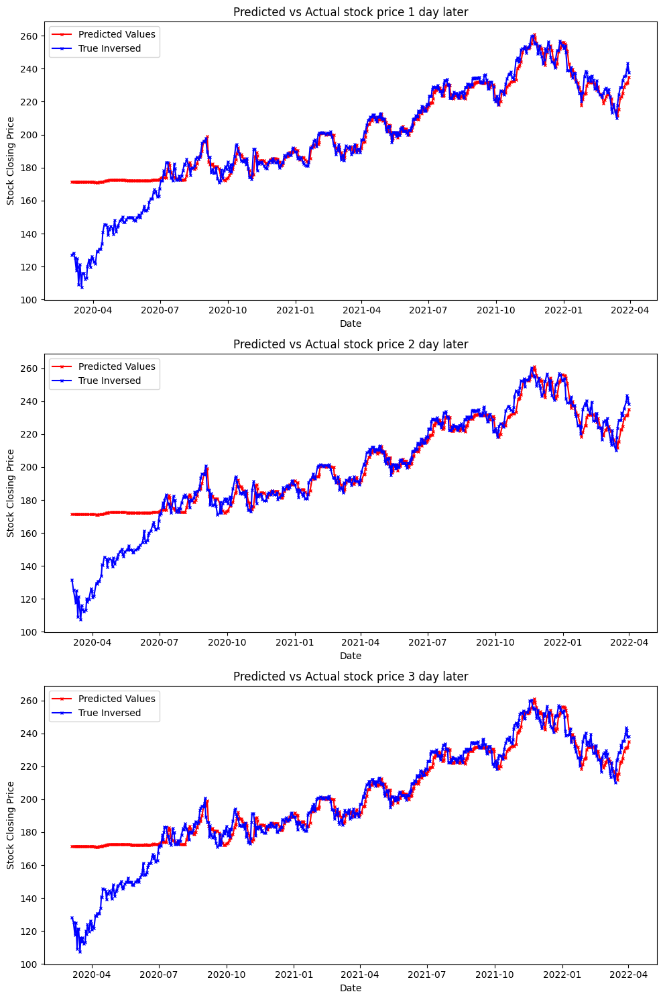

In [ ]:
# Convert your tensors to numpy arrays (assuming they are already tensors)

# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 15))  # Create 3 subplots vertically


for i in range(3):  # Assuming 3 features
    axs[i].plot(concatenated_array_date[i], concatenated_array[i], label='Predicted Values', marker='x', linestyle='-', color='red', markersize=3)
    axs[i].plot(concatenated_array_true_date[i], concatenated_array_true[i], label='True Inversed', marker='x', linestyle='-', markersize=3, color = "blue")
    axs[i].set_title(f'Predicted vs Actual stock price {i+1} day later')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Stock Closing Price')
    axs[i].legend()

plt.tight_layout()
plt.show()

In [ ]:
concatenated_array_true = [np.array(subarray) for subarray in concatenated_array_true]

concatenated_array_true_date_final = concatenated_array_true_date.copy()
for i, series in enumerate(concatenated_array_true_date_final):
    concatenated_array_true_date_final[i] = series - pd.Timedelta(days=i+1)

In [ ]:
# Create a dictionary to store the data for prediction
data_dict = {}

for index, d in enumerate(concatenated_array_date):
    for date_idx, date in enumerate(d):
        if date not in data_dict:
            # Initialize an empty list that will store values from all arrays for this date
            data_dict[date] = [None] * len(concatenated_array_date)
        # Insert the value in the correct position
        data_dict[date][index] = concatenated_array[index][date_idx]

# Create a list of dates and corresponding values for prediction data in final_pred_data
final_pred_data = []
for date, values in sorted(data_dict.items()):
    final_pred_data.append([date] + values)

# Define headers
headers_pred = ['Date'] + [f'Predicted_values_from_{i}_day_back' for i in range(len(concatenated_array))]


# Create a dictionary to store the data for prediction
data_dict = {}

for index, d in enumerate(concatenated_array_true_date_final):
    for date_idx, date in enumerate(d):
        if date not in data_dict:
            # Initialize an empty list that will store values from all arrays for this date
            data_dict[date] = [None] * len(concatenated_array_true_date_final)
        # Insert the value in the correct position
        data_dict[date][index] = concatenated_array_true[index][date_idx]

# Create a list of dates and corresponding values for prediction data in final_pred_data
final_true_data = []
for date, values in sorted(data_dict.items()):
    final_true_data.append([date] + values)

# Define headers
headers_true = ['Date'] + [f'True_values_from_{i}_day_back' for i in range(len(concatenated_array_true))]

# print(final_pred_data)
# print(final_true_data)

In [ ]:
# Convert arrays to DataFrames
columns = ['date', '+1 timestep', '+2 timestep', '+3 timestep']
df_pred = pd.DataFrame(final_pred_data, columns=columns)
df_true = pd.DataFrame(final_true_data, columns=columns)

# Convert date columns to datetime and data columns to numeric
df_pred['date'] = pd.to_datetime(df_pred['date'])
df_true['date'] = pd.to_datetime(df_true['date'])
for col in columns[1:]:
    df_pred[col] = pd.to_numeric(df_pred[col], errors='coerce')
    df_true[col] = pd.to_numeric(df_true[col], errors='coerce')

# Stack and dropna to filter out None or NaN entries
stacked_pred = df_pred.set_index('date')[columns[1:]].stack(dropna=True)
stacked_true = df_true.set_index('date')[columns[1:]].stack(dropna=True)

# Align predictions and true values by their index (date and timestep)
aligned_data = pd.DataFrame({'pred': stacked_pred, 'true': stacked_true}).dropna()

# Calculate combined MSE, RMSE, and R^2
mse = mean_squared_error(aligned_data['true'], aligned_data['pred'])
rmse = np.sqrt(mse)
r2_value = r2_score(aligned_data['true'], aligned_data['pred'])

print(f"Combined MSE: {mse}")
print(f"Combined RMSE: {rmse}")
print(f"Combined R^2: {r2_value}")

Combined MSE: 158.37825246182086
Combined RMSE: 12.584842170715566
Combined R^2: 0.8292396086259237


##### Determining accuracy on test dataset

In [ ]:
# Create a TimeSeriesDataSet for the test data

test_dataset = TimeSeriesDataSet(
    X_initial_tft_test,
    time_idx="time_idx",
    target="Close",
    group_ids=["group_id"],
    min_encoder_length=max_encoder_length,  # Adjust as per your requirement
    max_encoder_length=max_encoder_length,
    min_prediction_length=max_prediction_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=[],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=['20_day_SMA', 'RSI', 'ROC', 'Volatility', 'T10Y2Y',
       'CCSA', 'DGORDER', 'NFLX_Sentiment Score', 'AAPL_Sentiment Score',
       'MSFT_Sentiment Score', 'AMZN_Sentiment Score', 'RF_positive_count',
       'RF_total_positive_score', 'RF_negative_count',
       'RF_total_negative_score', 'RF_count', 'RF_avg_sentiment_score',
       'MDA_positive_count', 'MDA_total_positive_score', 'MDA_negative_count',
       'MDA_total_negative_score', 'MDA_count', 'MDA_avg_sentiment_score', "Open", "High", "Low", "Close", "Volume"],
    allow_missing_timesteps=True,
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
)


# Convert the test dataset to a DataLoader
test_dataloader = test_dataset.to_dataloader(train=False, batch_size=batch_size, num_workers=0, shuffle=False)

# Now, use the trained model to make predictions on the test set
predictions = trainer.test(
    best_tft,
    dataloaders=test_dataloader,
)

pred = best_tft.predict(
    test_dataloader,
    mode = "raw",
    return_x = True)

# print(pred)

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_MAE          │    7.6666388511657715     │
│         test_MAPE         │    0.04047830402851105    │
│         test_RMSE         │     9.71581745147705      │
│        test_SMAPE         │   0.038309577852487564    │
│         test_loss         │    7.6666388511657715     │
└───────────────────────────┴───────────────────────────┘

In [ ]:
decoder_time_idx = pred.x['decoder_time_idx']

time_idx_list_1 = decoder_time_idx[:,0].numpy()
time_idx_list_2 = decoder_time_idx[:,1].numpy()
time_idx_list_3 = decoder_time_idx[:,2].numpy()


filtered_df_true_1_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_1)]['Date']
filtered_df_true_2_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_2)]['Date']
filtered_df_true_3_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_3)]['Date']

concatenated_array_true_date = [filtered_df_true_1_date, filtered_df_true_2_date, filtered_df_true_3_date]
# print(concatenated_array_true_date)

filtered_df_true_1_close = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_1)]['Close']
filtered_df_true_2_close = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_2)]['Close']
filtered_df_true_3_close = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_3)]['Close']

concatenated_array_true = [filtered_df_true_1_close, filtered_df_true_2_close, filtered_df_true_3_close]
# print(concatenated_array_true)

In [ ]:
time_idx_np = decoder_time_idx.numpy()  # Convert time_idx tensor to numpy array
true_values_np = X_initial_tft_test['Close'].to_numpy()  # Convert true values tensor to numpy array
predicted_values_np = pred.output.prediction.numpy().squeeze()  # Convert predicted values tensor to numpy array

# This gives you an idea of whether duplicate time_idx values are causing the discrepancy

print(time_idx_np.shape)
print(predicted_values_np.shape)

filtered_df_predicted_1_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,0])]['Date']
filtered_df_predicted_2_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,1])]['Date']
filtered_df_predicted_3_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,2])]['Date']


concatenated_array_date = [filtered_df_predicted_1_date, filtered_df_predicted_2_date, filtered_df_predicted_3_date]


filtered_df_predicted_1 = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,0])]
filtered_df_predicted_2 = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,1])]
filtered_df_predicted_3 = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,2])]


indexes_predicted_1 = np.nonzero(np.isin(time_idx_np[:,0], filtered_df_predicted_1['time_idx']).flatten())[0]
indexes_predicted_2 = np.nonzero(np.isin(time_idx_np[:,1], filtered_df_predicted_2['time_idx']).flatten())[0]
indexes_predicted_3 = np.nonzero(np.isin(time_idx_np[:,2], filtered_df_predicted_3['time_idx']).flatten())[0]

# print(len(indexes_predicted_1))

filtered_predicted_values_np_1 = predicted_values_np[indexes_predicted_1][:,0]
filtered_predicted_values_np_2 = predicted_values_np[indexes_predicted_2][:,1]
filtered_predicted_values_np_3 = predicted_values_np[indexes_predicted_3][:,2]


# Convert each 1D array to a 2D array of shape (819, 1)
filtered_predicted_values_np_1_2d = np.expand_dims(filtered_predicted_values_np_1, axis=1)
filtered_predicted_values_np_2_2d = np.expand_dims(filtered_predicted_values_np_2, axis=1)
filtered_predicted_values_np_3_2d = np.expand_dims(filtered_predicted_values_np_3, axis=1)


# Concatenate the arrays to get a shape of (819, 3)
concatenated_array = []
concatenated_array = [filtered_predicted_values_np_1, filtered_predicted_values_np_2, filtered_predicted_values_np_3]

# Print the shape to confirm
print(concatenated_array[0][-5:])
print(concatenated_array[1][-5:])
print(concatenated_array[2][-5:])

(611, 3)
(611, 3)
[301.7182  301.83575 302.44937 302.44263 303.62338]
[302.05762 302.67938 302.51315 302.66208 303.87546]
[302.21317 302.47614 302.6258  303.84985 304.38705]


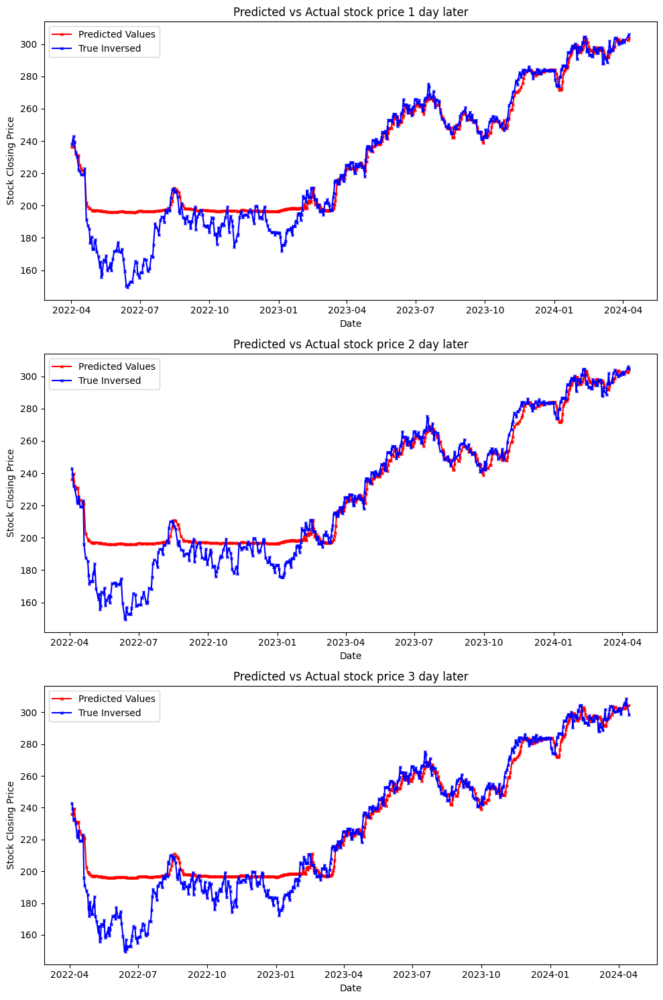

In [ ]:
# Convert your tensors to numpy arrays (assuming they are already tensors)

# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 15))  # Create 3 subplots vertically


for i in range(3):  # Assuming 3 features
    axs[i].plot(concatenated_array_date[i], concatenated_array[i], label='Predicted Values', marker='x', linestyle='-', color='red', markersize=3)
    axs[i].plot(concatenated_array_true_date[i], concatenated_array_true[i], label='True Inversed', marker='x', linestyle='-', markersize=3, color = "blue")
    axs[i].set_title(f'Predicted vs Actual stock price {i+1} day later')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Stock Closing Price')
    axs[i].legend()

plt.tight_layout()
plt.show()

In [ ]:
concatenated_array_true = [np.array(subarray) for subarray in concatenated_array_true]

concatenated_array_true_date_final = concatenated_array_true_date.copy()
for i, series in enumerate(concatenated_array_true_date_final):
    concatenated_array_true_date_final[i] = series - pd.Timedelta(days=i+1)


In [ ]:
# Create a dictionary to store the data for prediction
data_dict = {}

for index, d in enumerate(concatenated_array_date):
    for date_idx, date in enumerate(d):
        if date not in data_dict:
            # Initialize an empty list that will store values from all arrays for this date
            data_dict[date] = [None] * len(concatenated_array_date)
        # Insert the value in the correct position
        data_dict[date][index] = concatenated_array[index][date_idx]

# Create a list of dates and corresponding values for prediction data in final_pred_data
final_pred_data = []
for date, values in sorted(data_dict.items()):
    final_pred_data.append([date] + values)

# Define headers
headers_pred = ['Date'] + [f'Predicted_values_from_{i}_day_back' for i in range(len(concatenated_array))]


# Create a dictionary to store the data for prediction
data_dict = {}

for index, d in enumerate(concatenated_array_true_date_final):
    for date_idx, date in enumerate(d):
        if date not in data_dict:
            # Initialize an empty list that will store values from all arrays for this date
            data_dict[date] = [None] * len(concatenated_array_true_date_final)
        # Insert the value in the correct position
        data_dict[date][index] = concatenated_array_true[index][date_idx]

# Create a list of dates and corresponding values for prediction data in final_pred_data
final_true_data = []
for date, values in sorted(data_dict.items()):
    final_true_data.append([date] + values)

# Define headers
headers_true = ['Date'] + [f'True_values_from_{i}_day_back' for i in range(len(concatenated_array_true))]


# print(final_pred_data)
# print(final_true_data)

In [ ]:
# Convert arrays to DataFrames
columns = ['date', '+1 timestep', '+2 timestep', '+3 timestep']
df_pred = pd.DataFrame(final_pred_data, columns=columns)
df_true = pd.DataFrame(final_true_data, columns=columns)

# Convert date columns to datetime and data columns to numeric
df_pred['date'] = pd.to_datetime(df_pred['date'])
df_true['date'] = pd.to_datetime(df_true['date'])
for col in columns[1:]:
    df_pred[col] = pd.to_numeric(df_pred[col], errors='coerce')
    df_true[col] = pd.to_numeric(df_true[col], errors='coerce')

# Stack and dropna to filter out None or NaN entries
stacked_pred = df_pred.set_index('date')[columns[1:]].stack(dropna=True)
stacked_true = df_true.set_index('date')[columns[1:]].stack(dropna=True)

# Align predictions and true values by their index (date and timestep)
aligned_data = pd.DataFrame({'pred': stacked_pred, 'true': stacked_true}).dropna()

# Calculate combined MSE, RMSE, and R^2
mse = mean_squared_error(aligned_data['true'], aligned_data['pred'])
rmse = np.sqrt(mse)
r2_value = r2_score(aligned_data['true'], aligned_data['pred'])

print(f"Combined MSE: {mse}")
print(f"Combined RMSE: {rmse}")
print(f"Combined R^2: {r2_value}")

Combined MSE: 124.0143687343222
Combined RMSE: 11.136173882187823
Combined R^2: 0.9293247618903918


### Predicting for stock using 90-5-5 train-val-test split

#### Loading specific dataset for training and testing (For LSTM and GRU)

In [ ]:
# X = X.loc[:len(df_merged) * 0.80+50]
# Y = y.loc[:len(df_merged) * 0.80 + 80]
# Date = date_initial.loc[:len(df_merged) * 0.80 + 80]
X = X_initial.copy()
Y = y_initial.copy()
Date = date_initial.copy()

print(X.shape)
print(Y.shape)
print(Date.shape)

# Normalisation
sc = MinMaxScaler()
train = sc.fit_transform(X.loc[0: len(X) * 0.9])
val = sc.transform(X.loc[len(X)* 0.9 - 10: len(X) * 0.95])
test = sc.transform(X.loc[len(X) * 0.95  - 10:])


sc2 = MinMaxScaler()
train2 = sc2.fit_transform(Y.loc[0: len(Y) * 0.9].to_numpy().reshape(-1, 1))
val2 = sc2.transform(Y.loc[len(Y)* 0.9 - 10: len(Y) * 0.95].to_numpy().reshape(-1, 1))
test2 = sc2.transform(Y.loc[len(Y) * 0.95 - 10:].to_numpy().reshape(-1, 1))

Date_val = Date.loc[len(Date)* 0.9: len(Date) * 0.95 - 3]
Date_test = Date.loc[len(Date) * 0.95: len(Date) - 3]

print(train.shape,val.shape,test.shape)
print(train2.shape,val2.shape,test2.shape)

(6754, 30)
(6754,)
(6754,)
(6078, 30) (348, 30) (348, 30)
(6078, 1) (348, 1) (348, 1)


#### For LSTM

##### Hyperparameter tuning, training models

In [ ]:
# hps vlaues are to be removed for new run of tuner.search

!rm -rf ./untitled_project  # Be cautious with this command to avoid deleting unintended files

In [ ]:
# Remember to change the modle builder depending on whether you are trying out GRU or LSTm

timesteps = 10

tuner = kt.Hyperband(model_builder_LSTM,
                     objective='val_loss',
                     max_epochs=100)

# print(df_merged[11 : 14]['Close'])

X_train = []
Y_train = []
X_val = []
Y_val = []


# Loop for training data
for i in range(timesteps, train.shape[0] - timesteps):
    X_train.append(train[i-timesteps:i])
    Y_train.append(train[i+1 : i+4, 3])
X_train,y_train = np.array(X_train),np.array(Y_train)

# Loop for val data
for i in range(timesteps, val.shape[0] - timesteps):
    X_val.append(val[i-timesteps:i])
    Y_val.append(val[i+1 : i+4, 3])
X_val,y_val = np.array(X_val),np.array(Y_val)

# X_train = np.delete(X_train, 0, axis=1)
print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)

# print(X_train[0])

tuner.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val), callbacks=[stop_early])
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

Trial 53 Complete [00h 00m 18s]
val_loss: 0.0013363045873120427

Best val_loss So Far: 0.0010476094903424382
Total elapsed time: 00h 24m 55s


In [ ]:
print(best_hps)
print(best_hps.values)

{'units': 352, 'dense_units': 64, 'tuner/epochs': 2, 'tuner/initial_epoch': 0, 'tuner/bracket': 4, 'tuner/round': 0}


In [ ]:
model = tuner.hypermodel.build(best_hps)
history = model.fit(X_train, y_train, epochs=1000, validation_data=(X_val, y_val),
                    callbacks=[stop_early])
val_loss = history.history['val_loss']

Epoch 1/1000
190/190 [==============================] - 14s 60ms/step - loss: 0.0027 - mae: 0.0221 - val_loss: 0.0021 - val_mae: 0.0341
Epoch 2/1000
190/190 [==============================] - 11s 56ms/step - loss: 1.3477e-04 - mae: 0.0078 - val_loss: 0.0013 - val_mae: 0.0272
Epoch 3/1000
190/190 [==============================] - 11s 56ms/step - loss: 1.4319e-04 - mae: 0.0082 - val_loss: 0.0014 - val_mae: 0.0274
Epoch 4/1000
190/190 [==============================] - 9s 48ms/step - loss: 1.5238e-04 - mae: 0.0084 - val_loss: 0.0012 - val_mae: 0.0258
Epoch 5/1000
190/190 [==============================] - 11s 56ms/step - loss: 1.2430e-04 - mae: 0.0076 - val_loss: 0.0012 - val_mae: 0.0269
Epoch 6/1000
190/190 [==============================] - 10s 55ms/step - loss: 1.2540e-04 - mae: 0.0076 - val_loss: 0.0017 - val_mae: 0.0297
Epoch 7/1000
190/190 [==============================] - 10s 52ms/step - loss: 1.3924e-04 - mae: 0.0081 - val_loss: 0.0028 - val_mae: 0.0433


In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 352)               539264    
                                                                 
 dense_2 (Dense)             (None, 64)                22592     
                                                                 
 dense_3 (Dense)             (None, 3)                 195       
                                                                 
Total params: 562051 (2.14 MB)
Trainable params: 562051 (2.14 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


##### Predicting Validation dataset

In [ ]:
timesteps = 10

In [ ]:
# mse,rmse,r2_value,true,predicted = evaluate_model(model,test,timesteps)
true, predicted = evaluate_model(model,val,timesteps)

# print("MSE =",mse)
# print("RMSE =",rmse)
# print("R2-Score =",r2_value)

print(predicted.shape)
print(true.shape)

11/11 [==============================] - 1s 26ms/step
(335, 3)
(335, 3)


In [ ]:
predicted_inversed = np.zeros(predicted.shape)
true_inversed = np.zeros(true.shape)

for i in range(predicted.shape[1]):  # Loop over each feature
    predicted_inversed[:, i] = sc2.inverse_transform(predicted[:, i].reshape(-1, 1)).flatten()
    true_inversed[:, i] = sc2.inverse_transform(true[:, i].reshape(-1, 1)).flatten()

mse = mean_squared_error(true_inversed, predicted_inversed)
rmse = sqrt(mse)
r2_value = r2_score(true_inversed ,predicted_inversed)


# print(predicted_inversed)
# print(true_inversed)

print("MSE =",mse)
print("RMSE =",rmse)
print("R2-Score =",r2_value)

MSE = 185.10025870227307
RMSE = 13.605155592725614
R2-Score = 0.4309572824472487


In [ ]:
Date_val = pd.to_datetime(Date_val)
print(Date_val.shape)
print(predicted_inversed[:,0].shape)
print(predicted_inversed[:,1].shape)
print(predicted_inversed[:,2].shape)

(335,)
(335,)
(335,)
(335,)


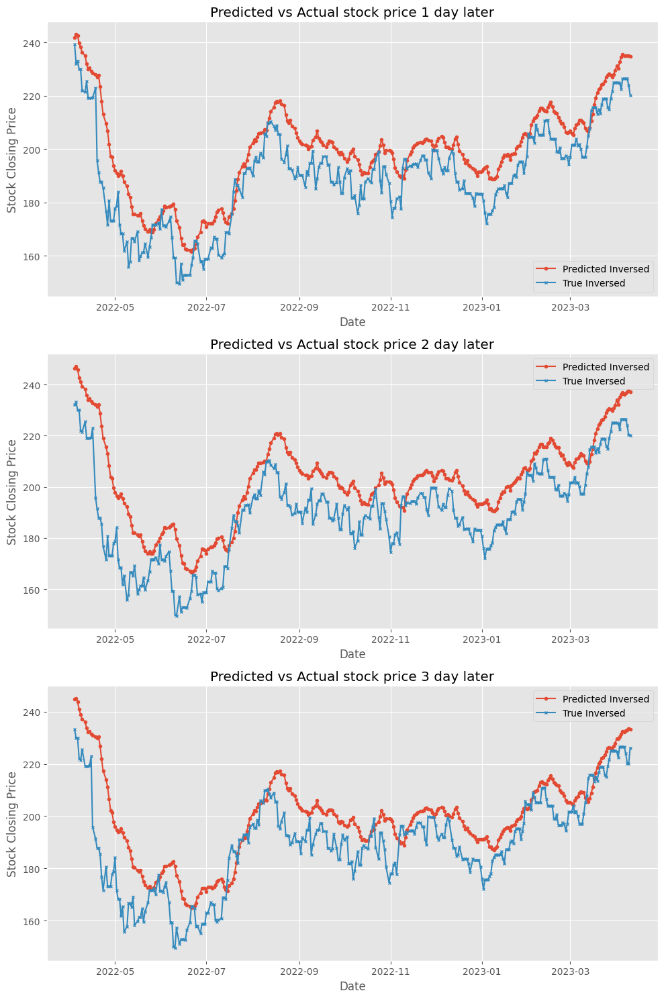

In [ ]:
# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 15))  # Create 3 subplots vertically


for i in range(3):  # Assuming 3 features
    axs[i].plot(Date_val, predicted_inversed[:, i], label='Predicted Inversed', marker='o', linestyle='-', markersize=3)
    axs[i].plot(Date_val, true_inversed[:, i], label='True Inversed', marker='x', linestyle='-', markersize=3)
    axs[i].set_title(f'Predicted vs Actual stock price {i+1} day later')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Stock Closing Price')
    axs[i].legend()

plt.tight_layout()
plt.show()

##### Predicting Test dataset

In [ ]:
# mse,rmse,r2_value,true,predicted = evaluate_model(model,test,timesteps)
true, predicted = evaluate_model(model,test,timesteps)

# print("MSE =",mse)
# print("RMSE =",rmse)
# print("R2-Score =",r2_value)

print(predicted.shape)
print(true.shape)

11/11 [==============================] - 0s 17ms/step
(335, 3)
(335, 3)


In [ ]:
predicted_inversed = np.zeros(predicted.shape)
true_inversed = np.zeros(true.shape)

for i in range(predicted.shape[1]):  # Loop over each feature
    predicted_inversed[:, i] = sc2.inverse_transform(predicted[:, i].reshape(-1, 1)).flatten()
    true_inversed[:, i] = sc2.inverse_transform(true[:, i].reshape(-1, 1)).flatten()

mse = mean_squared_error(true_inversed, predicted_inversed)
rmse = sqrt(mse)
r2_value = r2_score(true_inversed ,predicted_inversed)


# print(predicted_inversed)
# print(true_inversed)

print("MSE =",mse)
print("RMSE =",rmse)
print("R2-Score =",r2_value)

MSE = 56.0549050273149
RMSE = 7.486982371243765
R2-Score = 0.882667348358896


In [ ]:
Date_test = pd.to_datetime(Date_test)
print(Date_test.shape)
print(predicted_inversed[:,1].shape)

(335,)
(335,)


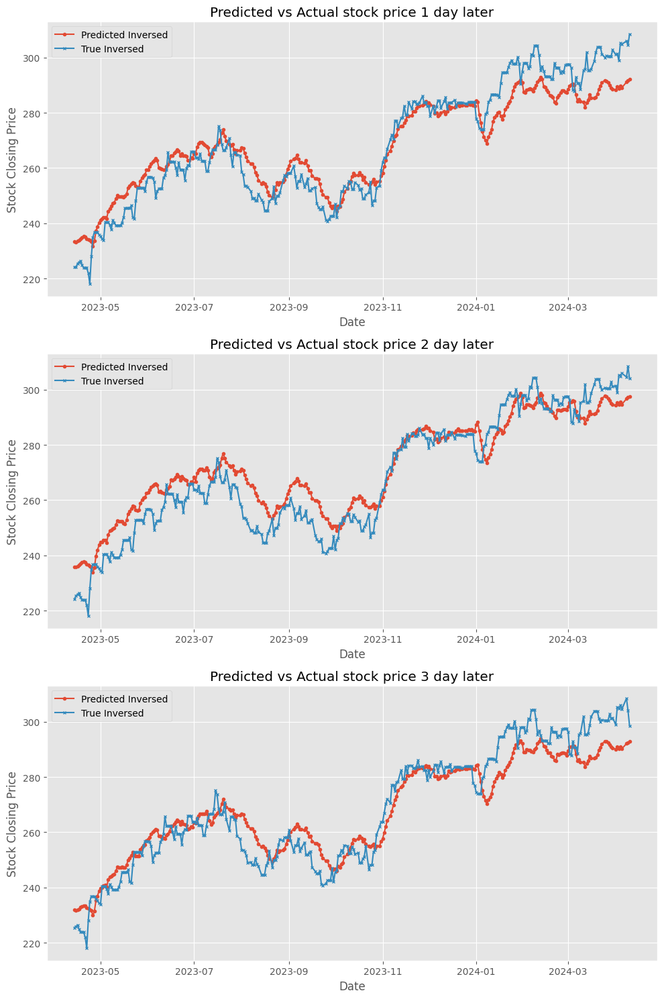

In [ ]:
# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 15))  # Create 3 subplots vertically


for i in range(3):  # Assuming 3 features
    axs[i].plot(Date_test, predicted_inversed[:, i], label='Predicted Inversed', marker='o', linestyle='-', markersize=3)
    axs[i].plot(Date_test, true_inversed[:, i], label='True Inversed', marker='x', linestyle='-', markersize=3)
    axs[i].set_title(f'Predicted vs Actual stock price {i+1} day later')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Stock Closing Price')
    axs[i].legend()

plt.tight_layout()
plt.show()


#### For GRU

##### Hyperparameter tuning, training models

In [ ]:
# hps vlaues are to be removed for new run of tuner.search

!rm -rf ./untitled_project  # Be cautious with this command to avoid deleting unintended files

In [ ]:
# Remember to change the modle builder depending on whether you are trying out GRU or LSTm

timesteps = 10

tuner = kt.Hyperband(model_builder_GRU,
                     objective='val_loss',
                     max_epochs=100)

# print(df_merged[11 : 14]['Close'])

X_train = []
Y_train = []
X_val = []
Y_val = []


# Loop for training data
for i in range(timesteps, train.shape[0] - timesteps):
    X_train.append(train[i-timesteps:i])
    Y_train.append(train[i+1 : i+4, 3])
X_train,y_train = np.array(X_train),np.array(Y_train)

# Loop for val data
for i in range(timesteps, val.shape[0] - timesteps):
    X_val.append(val[i-timesteps:i])
    Y_val.append(val[i+1 : i+4, 3])
X_val,y_val = np.array(X_val),np.array(Y_val)

# X_train = np.delete(X_train, 0, axis=1)
print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)

# print(X_train[0])

tuner.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val), callbacks=[stop_early])
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

Trial 58 Complete [00h 00m 29s]
val_loss: 0.0011027755681425333

Best val_loss So Far: 0.0008567699696868658
Total elapsed time: 00h 22m 25s


In [ ]:
print(best_hps)
print(best_hps.values)

{'units': 480, 'dense_units': 64, 'tuner/epochs': 2, 'tuner/initial_epoch': 0, 'tuner/bracket': 4, 'tuner/round': 0}


In [ ]:
model = tuner.hypermodel.build(best_hps)
history = model.fit(X_train, y_train, epochs=1000, validation_data=(X_val, y_val),
                    callbacks=[stop_early])
val_loss = history.history['val_loss']

Epoch 1/1000
190/190 [==============================] - 16s 74ms/step - loss: 0.0020 - mae: 0.0202 - val_loss: 0.0013 - val_mae: 0.0266
Epoch 2/1000
190/190 [==============================] - 14s 72ms/step - loss: 1.4144e-04 - mae: 0.0085 - val_loss: 0.0011 - val_mae: 0.0250
Epoch 3/1000
190/190 [==============================] - 14s 71ms/step - loss: 1.1238e-04 - mae: 0.0074 - val_loss: 0.0012 - val_mae: 0.0261
Epoch 4/1000
190/190 [==============================] - 14s 72ms/step - loss: 1.3700e-04 - mae: 0.0084 - val_loss: 0.0011 - val_mae: 0.0255
Epoch 5/1000
190/190 [==============================] - 14s 72ms/step - loss: 1.4848e-04 - mae: 0.0089 - val_loss: 0.0011 - val_mae: 0.0255
Epoch 6/1000
190/190 [==============================] - 14s 72ms/step - loss: 1.0693e-04 - mae: 0.0072 - val_loss: 0.0013 - val_mae: 0.0260
Epoch 7/1000
190/190 [==============================] - 14s 73ms/step - loss: 1.0015e-04 - mae: 0.0070 - val_loss: 0.0012 - val_mae: 0.0241
Epoch 8/1000
190/190 [==

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_1 (GRU)                 (None, 480)               737280    
                                                                 
 dense_2 (Dense)             (None, 64)                30784     
                                                                 
 dense_3 (Dense)             (None, 3)                 195       
                                                                 
Total params: 768259 (2.93 MB)
Trainable params: 768259 (2.93 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


##### Predicting Validation dataset

In [ ]:
timesteps = 10

In [ ]:
# mse,rmse,r2_value,true,predicted = evaluate_model(model,test,timesteps)
true, predicted = evaluate_model(model,val,timesteps)

# print("MSE =",mse)
# print("RMSE =",rmse)
# print("R2-Score =",r2_value)

print(predicted.shape)
print(true.shape)

11/11 [==============================] - 1s 19ms/step
(335, 3)
(335, 3)


In [ ]:
predicted_inversed = np.zeros(predicted.shape)
true_inversed = np.zeros(true.shape)

for i in range(predicted.shape[1]):  # Loop over each feature
    predicted_inversed[:, i] = sc2.inverse_transform(predicted[:, i].reshape(-1, 1)).flatten()
    true_inversed[:, i] = sc2.inverse_transform(true[:, i].reshape(-1, 1)).flatten()

mse = mean_squared_error(true_inversed, predicted_inversed)
rmse = sqrt(mse)
r2_value = r2_score(true_inversed ,predicted_inversed)


# print(predicted_inversed)
# print(true_inversed)

print("MSE =",mse)
print("RMSE =",rmse)
print("R2-Score =",r2_value)

MSE = 92.33417794716387
RMSE = 9.609067485826284
R2-Score = 0.7157611788485366


In [ ]:
Date_val = pd.to_datetime(Date_val)
print(Date_val.shape)
print(predicted_inversed[:,1].shape)

(335,)
(335,)


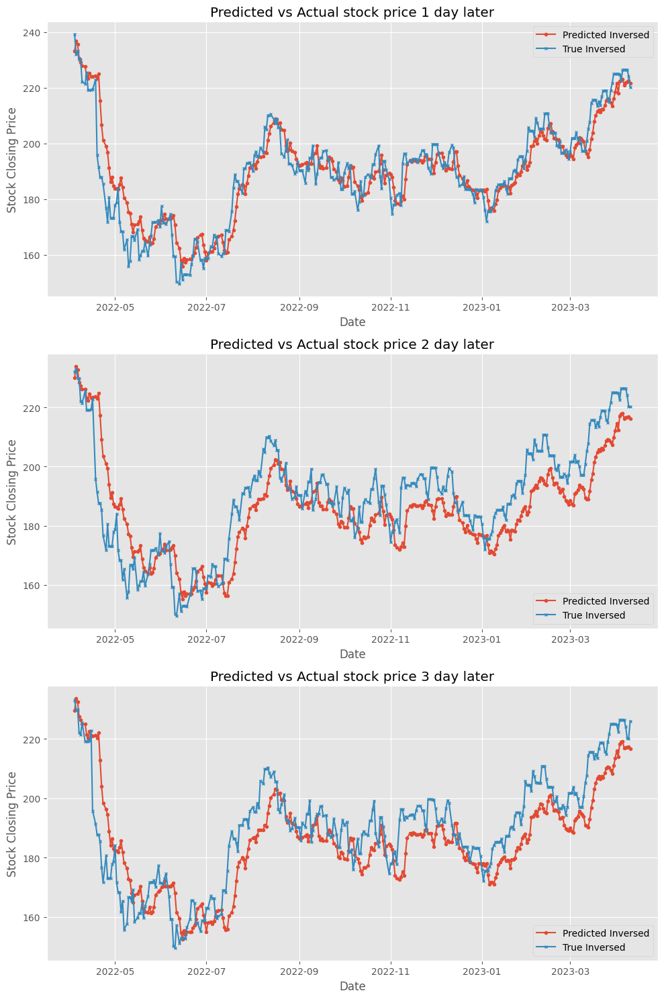

In [ ]:
# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 15))  # Create 3 subplots vertically


for i in range(3):  # Assuming 3 features
    axs[i].plot(Date_val, predicted_inversed[:, i], label='Predicted Inversed', marker='o', linestyle='-', markersize=3)
    axs[i].plot(Date_val, true_inversed[:, i], label='True Inversed', marker='x', linestyle='-', markersize=3)
    axs[i].set_title(f'Predicted vs Actual stock price {i+1} day later')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Stock Closing Price')
    axs[i].legend()

plt.tight_layout()
plt.show()

##### Predicting Test dataset

In [ ]:
# mse,rmse,r2_value,true,predicted = evaluate_model(model,test,timesteps)
true, predicted = evaluate_model(model,test,timesteps)

# print("MSE =",mse)
# print("RMSE =",rmse)
# print("R2-Score =",r2_value)

print(predicted.shape)
print(true.shape)

11/11 [==============================] - 0s 18ms/step
(335, 3)
(335, 3)


In [ ]:
predicted_inversed = np.zeros(predicted.shape)
true_inversed = np.zeros(true.shape)

for i in range(predicted.shape[1]):  # Loop over each feature
    predicted_inversed[:, i] = sc2.inverse_transform(predicted[:, i].reshape(-1, 1)).flatten()
    true_inversed[:, i] = sc2.inverse_transform(true[:, i].reshape(-1, 1)).flatten()

mse = mean_squared_error(true_inversed, predicted_inversed)
rmse = sqrt(mse)
r2_value = r2_score(true_inversed ,predicted_inversed)


# print(predicted_inversed)
# print(true_inversed)

print("MSE =",mse)
print("RMSE =",rmse)
print("R2-Score =",r2_value)

MSE = 117.6793120520809
RMSE = 10.848009589416895
R2-Score = 0.7533294185651775


In [ ]:
Date_test = pd.to_datetime(Date_test)
print(Date_test.shape)
print(predicted_inversed[:,1].shape)

(335,)
(335,)


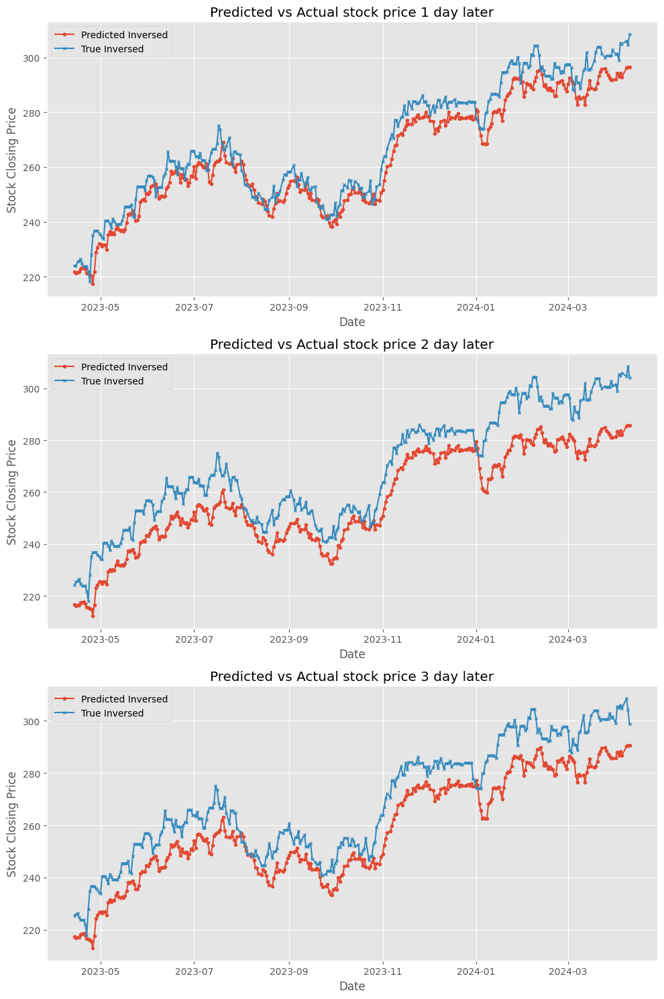

In [ ]:
# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 15))  # Create 3 subplots vertically


for i in range(3):  # Assuming 3 features
    axs[i].plot(Date_test, predicted_inversed[:, i], label='Predicted Inversed', marker='o', linestyle='-', markersize=3)
    axs[i].plot(Date_test, true_inversed[:, i], label='True Inversed', marker='x', linestyle='-', markersize=3)
    axs[i].set_title(f'Predicted vs Actual stock price {i+1} day later')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Stock Closing Price')
    axs[i].legend()

plt.tight_layout()
plt.show()


#### For Google Temporal Fusion Transformer

##### Data prep for TFT using TimeSeriesDataSet class from Lightning Pytorch

In [ ]:
# X = df_merged.drop(columns=['NFLX_Sentiment Label', 'AAPL_Sentiment Label', 'MSFT_Sentiment Label', 'AMZN_Sentiment Label' , 'ticker'])
# y = df_merged['Close']
max_prediction_length = 3
max_encoder_length = 10

# Convert the 'Date' column to datetime format
X_initial_tft['Date'] = pd.to_datetime(X_initial_tft['Date'])

# Calculate the difference in days from the minimum date
X_initial_tft['time_idx'] = (X_initial_tft['Date'] - X_initial_tft['Date'].min()).dt.days


# Creating a constant column
X_initial_tft['group_id'] = 'group'

# X_initial_tft.head()
# X_initial_tft.tail()

X_initial_tft_train = X_initial_tft.loc[:len(X_initial_tft) * 0.9]
X_initial_tft_val = X_initial_tft.loc[len(X_initial_tft) * 0.9 - max_encoder_length : len(X_initial_tft) * 0.95]
X_initial_tft_test = X_initial_tft.loc[len(X_initial_tft) * 0.95 - max_encoder_length : len(X_initial_tft)]


print(len(X_initial_tft))
print(len(X_initial_tft_train))
print(len(X_initial_tft_val))

6755
6079
348


In [ ]:
training_cutoff = X_initial_tft_train["time_idx"].max() - max_prediction_length


dataset = TimeSeriesDataSet(
    X_initial_tft_train,
    group_ids=['group_id'],
    target="Close",
    time_idx="time_idx",
    min_encoder_length=max_encoder_length,
    max_encoder_length=max_encoder_length,
    min_prediction_length=3,
    max_prediction_length=3,
    time_varying_known_reals=[],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=['20_day_SMA', 'RSI', 'ROC', 'Volatility', 'T10Y2Y',
       'CCSA', 'DGORDER', 'NFLX_Sentiment Score', 'AAPL_Sentiment Score',
       'MSFT_Sentiment Score', 'AMZN_Sentiment Score', 'RF_positive_count',
       'RF_total_positive_score', 'RF_negative_count',
       'RF_total_negative_score', 'RF_count', 'RF_avg_sentiment_score',
       'MDA_positive_count', 'MDA_total_positive_score', 'MDA_negative_count',
       'MDA_total_negative_score', 'MDA_count', 'MDA_avg_sentiment_score', "Open", "High", "Low", "Close", "Volume"],
    allow_missing_timesteps=True,
    add_relative_time_idx = True,
    add_target_scales=True,
    add_encoder_length=True,
    # time_varying_unknown_reals=["value"]
)


# create validation set (predict=True) which means to predict the last max_prediction_length points in time
# for each series
validation = TimeSeriesDataSet.from_dataset(dataset, X_initial_tft_val, predict=False, stop_randomization=True)

# create dataloaders for model
batch_size = 128  # set this between 32 to 128
train_dataloader = dataset.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, shuffle=False, drop_last=True, num_workers=0)

##### Hyperparameter tuning to find lr, Training model

In [ ]:
# configure network and trainer
pl.seed_everything(42)
trainer = pl.Trainer(
    accelerator="cpu",
    # clipping gradients is a hyperparameter and important to prevent divergance
    # of the gradient for recurrent neural networks
    gradient_clip_val=0.1,
)


tft = TemporalFusionTransformer.from_dataset(
    dataset,
    # not meaningful for finding the learning rate but otherwise very important
    learning_rate=0.03,
    hidden_size=8,  # most important hyperparameter apart from learning rate
    # number of attention heads. Set to up to 4 for large datasets
    attention_head_size=1,
    dropout=0.1,  # between 0.1 and 0.3 are good values
    hidden_continuous_size=8,  # set to <= hidden_size
    loss=RMSE(),
    optimizer="Ranger"
    # reduce learning rate if no improvement in validation loss after x epochs
    # reduce_on_plateau_patience=1000,
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Number of parameters in network: 17.1k


/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/parsing.py:199: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/parsing.py:199: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.


/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/utilities.py:73: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (40) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/data.py:104: Total length of `DataLoader` across ranks is zero. Please make sure this was your intention.


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=100` reached.
INFO: Learning rate set to 0.12882495516931336
INFO:lightning.pytorch.tuner.lr_finder:Learning rate set to 0.12882495516931336
INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/.lr_find_bc31500f-126a-407d-8f9f-bff76a2dc992.ckpt
INFO:pytorch_lightning.utilities.rank_zero:Restored all states from the checkpoint at /content/.lr_find_bc31500f-126a-407d-8f9f-bff76a2dc992.ckpt


suggested learning rate: 0.12882495516931336


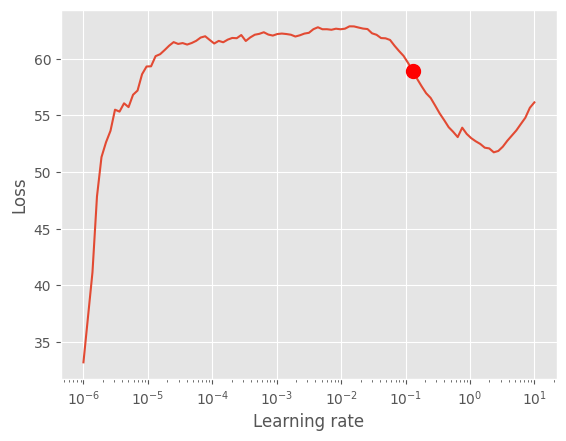

In [ ]:
# find optimal learning rate
# NOTE: Got error finding optimal learning rate?

res = Tuner(trainer).lr_find(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
    max_lr=10.0,
    min_lr=1e-6,
    early_stop_threshold=None
)



print(f"suggested learning rate: {res.suggestion()}")
fig = res.plot(show=True, suggest=True)
fig.show()

In [ ]:
# from pytorch_lightning.callbacks import ModelCheckpoint

val_dataset = TimeSeriesDataSet(
    X_initial_tft_val,
    time_idx="time_idx",
    target="Close",
    group_ids=["group_id"],
    min_encoder_length=max_encoder_length,  # Adjust as per your requirement
    max_encoder_length=max_encoder_length,
    min_prediction_length=max_prediction_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=[],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=['20_day_SMA', 'RSI', 'ROC', 'Volatility', 'T10Y2Y',
       'CCSA', 'DGORDER', 'NFLX_Sentiment Score', 'AAPL_Sentiment Score',
       'MSFT_Sentiment Score', 'AMZN_Sentiment Score', 'RF_positive_count',
       'RF_total_positive_score', 'RF_negative_count',
       'RF_total_negative_score', 'RF_count', 'RF_avg_sentiment_score',
       'MDA_positive_count', 'MDA_total_positive_score', 'MDA_negative_count',
       'MDA_total_negative_score', 'MDA_count', 'MDA_avg_sentiment_score', "Open", "High", "Low", "Close", "Volume"],
    allow_missing_timesteps=True,
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
)

# Convert the test dataset to a DataLoader
val_dataloader = val_dataset.to_dataloader(train=False, batch_size=batch_size, num_workers=0, shuffle=False)
print(f"Number of validation batches: {len(val_dataloader)}")

Number of validation batches: 3


In [ ]:
# configure network and trainer
early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=False, mode="min")
lr_logger = LearningRateMonitor()  # log the learning rate
logger = TensorBoardLogger("lightning_logs")  # logging results to a tensorboard

trainer = pl.Trainer(
    max_epochs=100,
    accelerator="cpu",
    enable_model_summary=True,
    gradient_clip_val=0.1,
    limit_train_batches=50,  # coment in for training, running valiation every 30 batches
    # fast_dev_run=True,  # comment in to check that networkor dataset has no serious bugs
    callbacks=[lr_logger, early_stop_callback],
    logger=logger,
)

# Note: learning rate should be adjusted based on recommended options from hyperparameter tuning
tft = TemporalFusionTransformer.from_dataset(
    dataset,
    learning_rate= res.suggestion(),
    hidden_size=16,
    attention_head_size=2,
    dropout=0.1,
    hidden_continuous_size=8,
    loss=MAE(),
    log_interval=10,  # uncomment for learning rate finder and otherwise, e.g. to 10 for logging every 10 batches
    optimizer="Ranger",
    reduce_on_plateau_patience=4,
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Number of parameters in network: 36.8k


/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/parsing.py:199: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/parsing.py:199: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.


In [ ]:
print(f"Train dataset length: {len(train_dataloader.dataset)}")
print(f"Validation dataset length: {len(val_dataloader.dataset)}")
print(f"Number of training batches: {len(train_dataloader)}")
print(f"Number of validation batches: {len(val_dataloader)}")

Train dataset length: 5146
Validation dataset length: 299
Number of training batches: 40
Number of validation batches: 3


In [ ]:
# fit network
trainer.fit(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,

)

INFO: 
   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | MAE                             | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 0     
3  | prescalers                         | ModuleDict                      | 512   
4  | static_variable_selection          | VariableSelectionNetwork        | 1.7 K 
5  | encoder_variable_selection         | VariableSelectionNetwork        | 20.7 K
6  | decoder_variable_selection         | VariableSelectionNetwork        | 528   
7  | static_context_variable_selection  | GatedResidualNetwork            | 1.1 K 
8  | static_context_initial_hidden_lstm | GatedResidualNetwork            | 1.1 K 
9  | static_context_initial_cell_lstm   | GatedResidualNetwork            

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (40) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

##### Load the best model according to the validation loss

In [ ]:
best_model_path = trainer.checkpoint_callback.best_model_path
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)

##### Determining the accuracy on the validation dataset

In [ ]:
val_dataset = TimeSeriesDataSet(
    X_initial_tft_val,
    time_idx="time_idx",
    target="Close",
    group_ids=["group_id"],
    min_encoder_length=max_encoder_length,  # Adjust as per your requirement
    max_encoder_length=max_encoder_length,
    min_prediction_length=max_prediction_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=[],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=['20_day_SMA', 'RSI', 'ROC', 'Volatility', 'T10Y2Y',
       'CCSA', 'DGORDER', 'NFLX_Sentiment Score', 'AAPL_Sentiment Score',
       'MSFT_Sentiment Score', 'AMZN_Sentiment Score', 'RF_positive_count',
       'RF_total_positive_score', 'RF_negative_count',
       'RF_total_negative_score', 'RF_count', 'RF_avg_sentiment_score',
       'MDA_positive_count', 'MDA_total_positive_score', 'MDA_negative_count',
       'MDA_total_negative_score', 'MDA_count', 'MDA_avg_sentiment_score', "Open", "High", "Low", "Close", "Volume"],
    allow_missing_timesteps=True,
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
)

# Convert the test dataset to a DataLoader
val_dataloader = val_dataset.to_dataloader(train=False, batch_size=batch_size, num_workers=0, shuffle=False)

# Now, use the trained model to make predictions on the test set
predictions = trainer.test(
    best_tft,
    dataloaders=val_dataloader,
)

pred = best_tft.predict(
    val_dataloader,
    mode = "raw",
    return_x = True
)

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_MAE          │     6.224886894226074     │
│         test_MAPE         │    0.03473441302776337    │
│         test_RMSE         │     7.842972755432129     │
│        test_SMAPE         │    0.03380148112773895    │
│         test_loss         │     6.224886894226074     │
└───────────────────────────┴───────────────────────────┘

In [ ]:
decoder_time_idx = pred.x['decoder_time_idx']

time_idx_list_1 = decoder_time_idx[:,0].numpy()
time_idx_list_2 = decoder_time_idx[:,1].numpy()
time_idx_list_3 = decoder_time_idx[:,2].numpy()

filtered_df_true_1_date = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_list_1)]['Date']
filtered_df_true_2_date = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_list_2)]['Date']
filtered_df_true_3_date = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_list_3)]['Date']

concatenated_array_true_date = [filtered_df_true_1_date, filtered_df_true_2_date, filtered_df_true_3_date]
# print(concatenated_array_true_date)

filtered_df_true_1_close = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_list_1)]['Close']
filtered_df_true_2_close = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_list_2)]['Close']
filtered_df_true_3_close = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_list_3)]['Close']

concatenated_array_true = [filtered_df_true_1_close, filtered_df_true_2_close, filtered_df_true_3_close]
# print(concatenated_array_true)

In [ ]:
time_idx_np = decoder_time_idx.numpy()  # Convert time_idx tensor to numpy array
true_values_np = X_initial_tft_val['Close'].to_numpy()  # Convert true values tensor to numpy array
predicted_values_np = pred.output.prediction.numpy().squeeze()  # Convert predicted values tensor to numpy array

# This gives you an idea of whether duplicate time_idx values are causing the discrepancy

print(time_idx_np.shape)
print(predicted_values_np.shape)

filtered_df_predicted_1_date = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_np[:,0])]['Date']
filtered_df_predicted_2_date = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_np[:,1])]['Date']
filtered_df_predicted_3_date = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_np[:,2])]['Date']


concatenated_array_date = [filtered_df_predicted_1_date, filtered_df_predicted_2_date, filtered_df_predicted_3_date]


filtered_df_predicted_1 = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_np[:,0])]
filtered_df_predicted_2 = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_np[:,1])]
filtered_df_predicted_3 = X_initial_tft_val[X_initial_tft_val['time_idx'].isin(time_idx_np[:,2])]


# print(predicted_values_np.shape)
# print(time_idx_np[:,0])
# print(filtered_df_predicted_2_date)

indexes_predicted_1 = np.nonzero(np.isin(time_idx_np[:,0], filtered_df_predicted_1['time_idx']).flatten())[0]
indexes_predicted_2 = np.nonzero(np.isin(time_idx_np[:,1], filtered_df_predicted_2['time_idx']).flatten())[0]
indexes_predicted_3 = np.nonzero(np.isin(time_idx_np[:,2], filtered_df_predicted_3['time_idx']).flatten())[0]

# print(len(indexes_predicted_1))

filtered_predicted_values_np_1 = predicted_values_np[indexes_predicted_1][:,0]
filtered_predicted_values_np_2 = predicted_values_np[indexes_predicted_2][:,1]
filtered_predicted_values_np_3 = predicted_values_np[indexes_predicted_3][:,2]


# Convert each 1D array to a 2D array of shape (819, 1)
filtered_predicted_values_np_1_2d = np.expand_dims(filtered_predicted_values_np_1, axis=1)
filtered_predicted_values_np_2_2d = np.expand_dims(filtered_predicted_values_np_2, axis=1)
filtered_predicted_values_np_3_2d = np.expand_dims(filtered_predicted_values_np_3, axis=1)


# Concatenate the arrays to get an array of predicted values
concatenated_array = []
concatenated_array = [filtered_predicted_values_np_1, filtered_predicted_values_np_2, filtered_predicted_values_np_3]

# Print the shape to confirm
print(concatenated_array[0][-5:])
print(concatenated_array[1][-5:])
print(concatenated_array[2][-5:])

(299, 3)
(299, 3)
[222.80963 222.56168 222.5439  222.61871 222.23373]
[223.14076 222.8952  222.87326 222.9511  222.56972]
[223.17705 222.9322  222.90894 222.9871  222.60922]


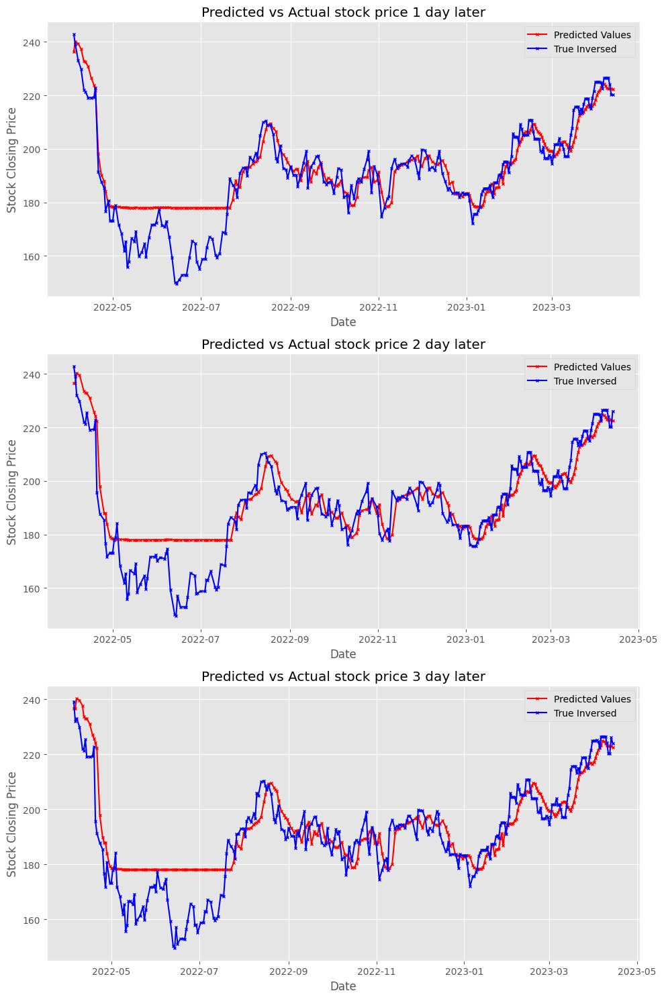

In [ ]:
# Convert your tensors to numpy arrays (assuming they are already tensors)

# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 15))  # Create 3 subplots vertically


for i in range(3):  # Assuming 3 features
    axs[i].plot(concatenated_array_date[i], concatenated_array[i], label='Predicted Values', marker='x', linestyle='-', color='red', markersize=3)
    axs[i].plot(concatenated_array_true_date[i], concatenated_array_true[i], label='True Inversed', marker='x', linestyle='-', markersize=3, color = "blue")
    axs[i].set_title(f'Predicted vs Actual stock price {i+1} day later')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Stock Closing Price')
    axs[i].legend()

plt.tight_layout()
plt.show()

In [ ]:
concatenated_array_true = [np.array(subarray) for subarray in concatenated_array_true]

concatenated_array_true_date_final = concatenated_array_true_date.copy()
for i, series in enumerate(concatenated_array_true_date_final):
    concatenated_array_true_date_final[i] = series - pd.Timedelta(days=i+1)

In [ ]:
# Create a dictionary to store the data for prediction
data_dict = {}

for index, d in enumerate(concatenated_array_date):
    for date_idx, date in enumerate(d):
        if date not in data_dict:
            # Initialize an empty list that will store values from all arrays for this date
            data_dict[date] = [None] * len(concatenated_array_date)
        # Insert the value in the correct position
        data_dict[date][index] = concatenated_array[index][date_idx]

# Create a list of dates and corresponding values for prediction data in final_pred_data
final_pred_data = []
for date, values in sorted(data_dict.items()):
    final_pred_data.append([date] + values)

# Define headers
headers_pred = ['Date'] + [f'Predicted_values_from_{i}_day_back' for i in range(len(concatenated_array))]


# Create a dictionary to store the data for prediction
data_dict = {}

for index, d in enumerate(concatenated_array_true_date_final):
    for date_idx, date in enumerate(d):
        if date not in data_dict:
            # Initialize an empty list that will store values from all arrays for this date
            data_dict[date] = [None] * len(concatenated_array_true_date_final)
        # Insert the value in the correct position
        data_dict[date][index] = concatenated_array_true[index][date_idx]

# Create a list of dates and corresponding values for prediction data in final_pred_data
final_true_data = []
for date, values in sorted(data_dict.items()):
    final_true_data.append([date] + values)

# Define headers
headers_true = ['Date'] + [f'True_values_from_{i}_day_back' for i in range(len(concatenated_array_true))]

# print(final_pred_data)
# print(final_true_data)

In [ ]:
# Convert arrays to DataFrames
columns = ['date', '+1 timestep', '+2 timestep', '+3 timestep']
df_pred = pd.DataFrame(final_pred_data, columns=columns)
df_true = pd.DataFrame(final_true_data, columns=columns)

# Convert date columns to datetime and data columns to numeric
df_pred['date'] = pd.to_datetime(df_pred['date'])
df_true['date'] = pd.to_datetime(df_true['date'])
for col in columns[1:]:
    df_pred[col] = pd.to_numeric(df_pred[col], errors='coerce')
    df_true[col] = pd.to_numeric(df_true[col], errors='coerce')

# Stack and dropna to filter out None or NaN entries
stacked_pred = df_pred.set_index('date')[columns[1:]].stack(dropna=True)
stacked_true = df_true.set_index('date')[columns[1:]].stack(dropna=True)

# Align predictions and true values by their index (date and timestep)
aligned_data = pd.DataFrame({'pred': stacked_pred, 'true': stacked_true}).dropna()

# Calculate combined MSE, RMSE, and R^2
mse = mean_squared_error(aligned_data['true'], aligned_data['pred'])
rmse = np.sqrt(mse)
r2_value = r2_score(aligned_data['true'], aligned_data['pred'])

print(f"Combined MSE: {mse}")
print(f"Combined RMSE: {rmse}")
print(f"Combined R^2: {r2_value}")

Combined MSE: 79.71502137144165
Combined RMSE: 8.928326907738182
Combined R^2: 0.7552023130891715


##### Determining accuracy on test dataset

In [ ]:
# Create a TimeSeriesDataSet for the test data

test_dataset = TimeSeriesDataSet(
    X_initial_tft_test,
    time_idx="time_idx",
    target="Close",
    group_ids=["group_id"],
    min_encoder_length=max_encoder_length,  # Adjust as per your requirement
    max_encoder_length=max_encoder_length,
    min_prediction_length=max_prediction_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=[],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=['20_day_SMA', 'RSI', 'ROC', 'Volatility', 'T10Y2Y',
       'CCSA', 'DGORDER', 'NFLX_Sentiment Score', 'AAPL_Sentiment Score',
       'MSFT_Sentiment Score', 'AMZN_Sentiment Score', 'RF_positive_count',
       'RF_total_positive_score', 'RF_negative_count',
       'RF_total_negative_score', 'RF_count', 'RF_avg_sentiment_score',
       'MDA_positive_count', 'MDA_total_positive_score', 'MDA_negative_count',
       'MDA_total_negative_score', 'MDA_count', 'MDA_avg_sentiment_score', "Open", "High", "Low", "Close", "Volume"],
    allow_missing_timesteps=True,
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
)


# Convert the test dataset to a DataLoader
test_dataloader = test_dataset.to_dataloader(train=False, batch_size=batch_size, num_workers=0, shuffle=False)

# Now, use the trained model to make predictions on the test set
predictions = trainer.test(
    best_tft,
    dataloaders=test_dataloader,
)

pred = best_tft.predict(
    test_dataloader,
    mode = "raw",
    return_x = True)

# print(pred)

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_MAE          │     5.326895236968994     │
│         test_MAPE         │   0.020971808582544327    │
│         test_RMSE         │     7.05792760848999      │
│        test_SMAPE         │   0.020667893812060356    │
│         test_loss         │     5.326895236968994     │
└───────────────────────────┴───────────────────────────┘

In [ ]:
decoder_time_idx = pred.x['decoder_time_idx']

time_idx_list_1 = decoder_time_idx[:,0].numpy()
time_idx_list_2 = decoder_time_idx[:,1].numpy()
time_idx_list_3 = decoder_time_idx[:,2].numpy()


filtered_df_true_1_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_1)]['Date']
filtered_df_true_2_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_2)]['Date']
filtered_df_true_3_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_3)]['Date']

concatenated_array_true_date = [filtered_df_true_1_date, filtered_df_true_2_date, filtered_df_true_3_date]
# print(concatenated_array_true_date)

filtered_df_true_1_close = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_1)]['Close']
filtered_df_true_2_close = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_2)]['Close']
filtered_df_true_3_close = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_3)]['Close']

concatenated_array_true = [filtered_df_true_1_close, filtered_df_true_2_close, filtered_df_true_3_close]
# print(concatenated_array_true)

In [ ]:
time_idx_np = decoder_time_idx.numpy()  # Convert time_idx tensor to numpy array
true_values_np = X_initial_tft_test['Close'].to_numpy()  # Convert true values tensor to numpy array
predicted_values_np = pred.output.prediction.numpy().squeeze()  # Convert predicted values tensor to numpy array

# This gives you an idea of whether duplicate time_idx values are causing the discrepancy

print(time_idx_np.shape)
print(predicted_values_np.shape)

filtered_df_predicted_1_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,0])]['Date']
filtered_df_predicted_2_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,1])]['Date']
filtered_df_predicted_3_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,2])]['Date']


concatenated_array_date = [filtered_df_predicted_1_date, filtered_df_predicted_2_date, filtered_df_predicted_3_date]


filtered_df_predicted_1 = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,0])]
filtered_df_predicted_2 = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,1])]
filtered_df_predicted_3 = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,2])]


indexes_predicted_1 = np.nonzero(np.isin(time_idx_np[:,0], filtered_df_predicted_1['time_idx']).flatten())[0]
indexes_predicted_2 = np.nonzero(np.isin(time_idx_np[:,1], filtered_df_predicted_2['time_idx']).flatten())[0]
indexes_predicted_3 = np.nonzero(np.isin(time_idx_np[:,2], filtered_df_predicted_3['time_idx']).flatten())[0]

# print(len(indexes_predicted_1))

filtered_predicted_values_np_1 = predicted_values_np[indexes_predicted_1][:,0]
filtered_predicted_values_np_2 = predicted_values_np[indexes_predicted_2][:,1]
filtered_predicted_values_np_3 = predicted_values_np[indexes_predicted_3][:,2]


# Convert each 1D array to a 2D array of shape (819, 1)
filtered_predicted_values_np_1_2d = np.expand_dims(filtered_predicted_values_np_1, axis=1)
filtered_predicted_values_np_2_2d = np.expand_dims(filtered_predicted_values_np_2, axis=1)
filtered_predicted_values_np_3_2d = np.expand_dims(filtered_predicted_values_np_3, axis=1)


# Concatenate the arrays to get a shape of (819, 3)
concatenated_array = []
concatenated_array = [filtered_predicted_values_np_1, filtered_predicted_values_np_2, filtered_predicted_values_np_3]

# Print the shape to confirm
print(concatenated_array[0][-5:])
print(concatenated_array[1][-5:])
print(concatenated_array[2][-5:])

(310, 3)
(310, 3)
[300.512   300.46677 300.97202 301.06714 302.69595]
[301.35468 301.23724 301.44934 303.07596 304.12772]
[301.28387 301.49628 303.11722 304.17377 304.17374]


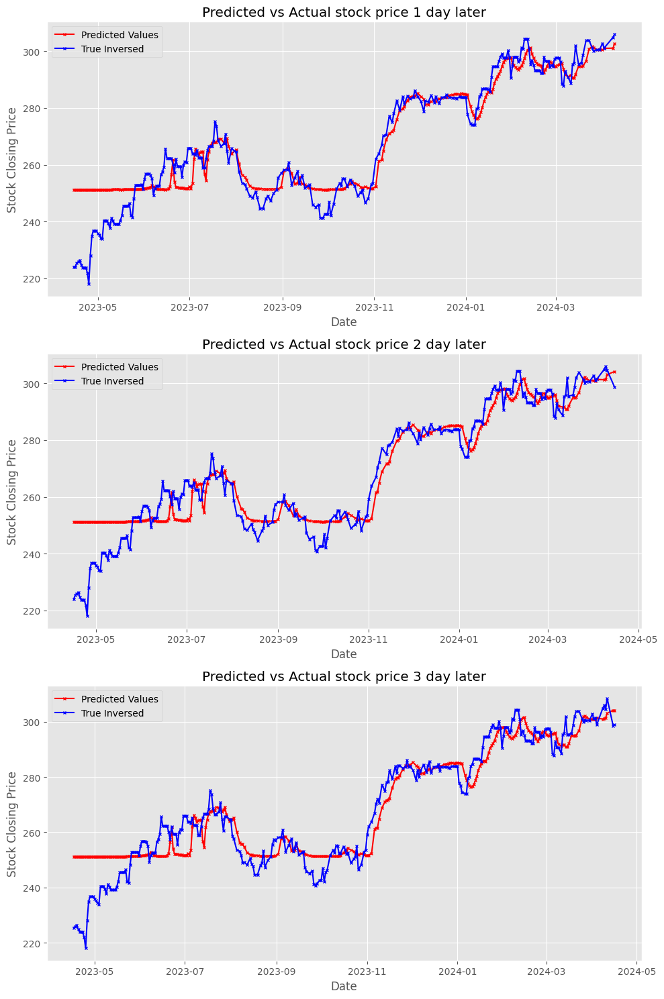

In [ ]:
# Convert your tensors to numpy arrays (assuming they are already tensors)

# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 15))  # Create 3 subplots vertically


for i in range(3):  # Assuming 3 features
    axs[i].plot(concatenated_array_date[i], concatenated_array[i], label='Predicted Values', marker='x', linestyle='-', color='red', markersize=3)
    axs[i].plot(concatenated_array_true_date[i], concatenated_array_true[i], label='True Inversed', marker='x', linestyle='-', markersize=3, color = "blue")
    axs[i].set_title(f'Predicted vs Actual stock price {i+1} day later')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Stock Closing Price')
    axs[i].legend()

plt.tight_layout()
plt.show()

In [ ]:
concatenated_array_true = [np.array(subarray) for subarray in concatenated_array_true]

concatenated_array_true_date_final = concatenated_array_true_date.copy()
for i, series in enumerate(concatenated_array_true_date_final):
    concatenated_array_true_date_final[i] = series - pd.Timedelta(days=i+1)


In [ ]:
# Create a dictionary to store the data for prediction
data_dict = {}

for index, d in enumerate(concatenated_array_date):
    for date_idx, date in enumerate(d):
        if date not in data_dict:
            # Initialize an empty list that will store values from all arrays for this date
            data_dict[date] = [None] * len(concatenated_array_date)
        # Insert the value in the correct position
        data_dict[date][index] = concatenated_array[index][date_idx]

# Create a list of dates and corresponding values for prediction data in final_pred_data
final_pred_data = []
for date, values in sorted(data_dict.items()):
    final_pred_data.append([date] + values)

# Define headers
headers_pred = ['Date'] + [f'Predicted_values_from_{i}_day_back' for i in range(len(concatenated_array))]


# Create a dictionary to store the data for prediction
data_dict = {}

for index, d in enumerate(concatenated_array_true_date_final):
    for date_idx, date in enumerate(d):
        if date not in data_dict:
            # Initialize an empty list that will store values from all arrays for this date
            data_dict[date] = [None] * len(concatenated_array_true_date_final)
        # Insert the value in the correct position
        data_dict[date][index] = concatenated_array_true[index][date_idx]

# Create a list of dates and corresponding values for prediction data in final_pred_data
final_true_data = []
for date, values in sorted(data_dict.items()):
    final_true_data.append([date] + values)

# Define headers
headers_true = ['Date'] + [f'True_values_from_{i}_day_back' for i in range(len(concatenated_array_true))]


# print(final_pred_data)
# print(final_true_data)

In [ ]:
# Convert arrays to DataFrames
columns = ['date', '+1 timestep', '+2 timestep', '+3 timestep']
df_pred = pd.DataFrame(final_pred_data, columns=columns)
df_true = pd.DataFrame(final_true_data, columns=columns)

# Convert date columns to datetime and data columns to numeric
df_pred['date'] = pd.to_datetime(df_pred['date'])
df_true['date'] = pd.to_datetime(df_true['date'])
for col in columns[1:]:
    df_pred[col] = pd.to_numeric(df_pred[col], errors='coerce')
    df_true[col] = pd.to_numeric(df_true[col], errors='coerce')

# Stack and dropna to filter out None or NaN entries
stacked_pred = df_pred.set_index('date')[columns[1:]].stack(dropna=True)
stacked_true = df_true.set_index('date')[columns[1:]].stack(dropna=True)

# Align predictions and true values by their index (date and timestep)
aligned_data = pd.DataFrame({'pred': stacked_pred, 'true': stacked_true}).dropna()

# Calculate combined MSE, RMSE, and R^2
mse = mean_squared_error(aligned_data['true'], aligned_data['pred'])
rmse = np.sqrt(mse)
r2_value = r2_score(aligned_data['true'], aligned_data['pred'])

print(f"Combined MSE: {mse}")
print(f"Combined RMSE: {rmse}")
print(f"Combined R^2: {r2_value}")

Combined MSE: 80.24146434394758
Combined RMSE: 8.957760007052409
Combined R^2: 0.8426459056261174


### Predicting for stock during Covid Period (01 Jan 2020 - 30 June 2020)

#### Loading specific dataset for training and testing (For LSTM and GRU)

In [ ]:
# X = X.loc[:len(df_merged) * 0.80+50]
# Y = y.loc[:len(df_merged) * 0.80 + 80]
# Date = date_initial.loc[:len(df_merged) * 0.80 + 80]
X = X_initial.copy()
Y = y_initial.copy()
Date = date_initial.copy()

print(X.shape)
print(Y.shape)
print(Date.shape)

# Normalisation
sc = MinMaxScaler()
train = sc.fit_transform(X.loc[0:4546])
val = sc.transform(X.loc[(4547-10): 5348])
test = sc.transform(X.loc[(5349-10):5505])


sc2 = MinMaxScaler()
train2 = sc2.fit_transform(Y.loc[0:4546].to_numpy().reshape(-1, 1))
val2 = sc2.transform(Y.loc[(4547- 10): 5348].to_numpy().reshape(-1, 1))
test2 = sc2.transform(Y.loc[(5349- 10):5505].to_numpy().reshape(-1, 1))

Date_val = Date.loc[4547: (5348 - 3)]
Date_test = Date.loc[5349: (5505 - 3)]


print(train.shape,val.shape,test.shape)
print(train2.shape,val2.shape,test2.shape)

(6755, 30)
(6755,)
(6755,)
(4546, 30) (812, 30) (167, 30)
(4546, 1) (812, 1) (167, 1)


#### For LSTM

##### Hyperparameter tuning, training models

In [ ]:
# hps vlaues are to be removed for new run of tuner.search

!rm -rf ./untitled_project  # Be cautious with this command to avoid deleting unintended files

In [ ]:
# Remember to change the modle builder depending on whether you are trying out GRU or LSTm

timesteps = 10

tuner = kt.Hyperband(model_builder_LSTM,
                     objective='val_loss',
                     max_epochs=100)

# print(df_merged[11 : 14]['Close'])

X_train = []
Y_train = []
X_val = []
Y_val = []


# Loop for training data
for i in range(timesteps, train.shape[0] - timesteps):
    X_train.append(train[i-timesteps:i])
    Y_train.append(train[i+1 : i+4, 3])
X_train,y_train = np.array(X_train),np.array(Y_train)

# Loop for val data
for i in range(timesteps, val.shape[0] - timesteps):
    X_val.append(val[i-timesteps:i])
    Y_val.append(val[i+1 : i+4, 3])
X_val,y_val = np.array(X_val),np.array(Y_val)

# X_train = np.delete(X_train, 0, axis=1)
print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)

# print(X_train[0])

tuner.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val), callbacks=[stop_early])
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

Trial 59 Complete [00h 00m 10s]
val_loss: 0.04565872624516487

Best val_loss So Far: 0.011985084041953087
Total elapsed time: 00h 19m 00s


In [ ]:
print(best_hps)
print(best_hps.values)

{'units': 512, 'dense_units': 128, 'tuner/epochs': 2, 'tuner/initial_epoch': 0, 'tuner/bracket': 4, 'tuner/round': 0}


In [ ]:
model = tuner.hypermodel.build(best_hps)
history = model.fit(X_train, y_train, epochs=1000, validation_data=(X_val, y_val),
                    callbacks=[stop_early])
val_loss = history.history['val_loss']

Epoch 1/1000
142/142 [==============================] - 20s 129ms/step - loss: 0.0034 - mae: 0.0239 - val_loss: 0.0283 - val_mae: 0.1416
Epoch 2/1000
142/142 [==============================] - 16s 112ms/step - loss: 1.6342e-04 - mae: 0.0091 - val_loss: 0.0336 - val_mae: 0.1575
Epoch 3/1000
142/142 [==============================] - 17s 120ms/step - loss: 1.5050e-04 - mae: 0.0087 - val_loss: 0.0355 - val_mae: 0.1638
Epoch 4/1000
142/142 [==============================] - 15s 107ms/step - loss: 1.4600e-04 - mae: 0.0085 - val_loss: 0.0257 - val_mae: 0.1362
Epoch 5/1000
142/142 [==============================] - 16s 111ms/step - loss: 1.3105e-04 - mae: 0.0081 - val_loss: 0.0267 - val_mae: 0.1403
Epoch 6/1000
142/142 [==============================] - 17s 121ms/step - loss: 1.4090e-04 - mae: 0.0083 - val_loss: 0.0255 - val_mae: 0.1357
Epoch 7/1000
142/142 [==============================] - 15s 108ms/step - loss: 1.4464e-04 - mae: 0.0085 - val_loss: 0.0276 - val_mae: 0.1428
Epoch 8/1000
142/

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 512)               1112064   
                                                                 
 dense_2 (Dense)             (None, 128)               65664     
                                                                 
 dense_3 (Dense)             (None, 3)                 387       
                                                                 
Total params: 1178115 (4.49 MB)
Trainable params: 1178115 (4.49 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


##### Predicting Test dataset

In [ ]:
timesteps = 10

In [ ]:
# mse,rmse,r2_value,true,predicted = evaluate_model(model,test,timesteps)
true, predicted = evaluate_model(model,test,timesteps)

# print("MSE =",mse)
# print("RMSE =",rmse)
# print("R2-Score =",r2_value)

print(predicted.shape)
print(true.shape)

5/5 [==============================] - 1s 21ms/step
(154, 3)
(154, 3)


In [ ]:
predicted_inversed = np.zeros(predicted.shape)
true_inversed = np.zeros(true.shape)

for i in range(predicted.shape[1]):  # Loop over each feature
    predicted_inversed[:, i] = sc2.inverse_transform(predicted[:, i].reshape(-1, 1)).flatten()
    true_inversed[:, i] = sc2.inverse_transform(true[:, i].reshape(-1, 1)).flatten()

mse = mean_squared_error(true_inversed, predicted_inversed)
rmse = sqrt(mse)
r2_value = r2_score(true_inversed ,predicted_inversed)


# print(predicted_inversed)
# print(true_inversed)

print("MSE =",mse)
print("RMSE =",rmse)
print("R2-Score =",r2_value)

MSE = 1162.085235560118
RMSE = 34.08937129898582
R2-Score = -5.061219391330326


In [ ]:
Date_test = pd.to_datetime(Date_test)
print(Date_test.shape)
print(predicted_inversed[:,1].shape)

(154,)
(154,)


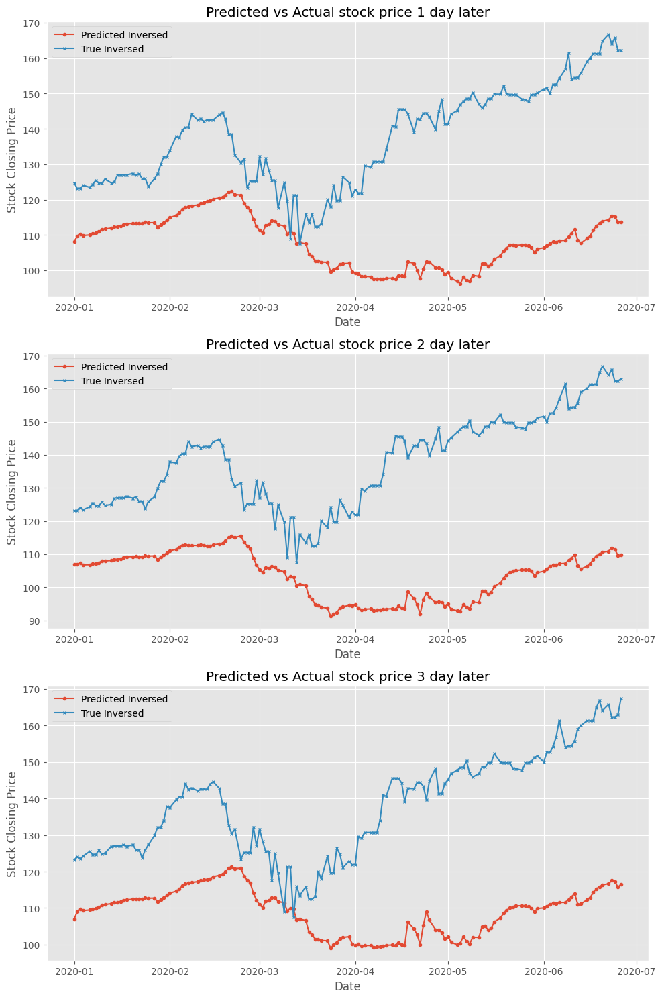

In [ ]:
# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 15))  # Create 3 subplots vertically


for i in range(3):  # Assuming 3 features
    axs[i].plot(Date_test, predicted_inversed[:, i], label='Predicted Inversed', marker='o', linestyle='-', markersize=3)
    axs[i].plot(Date_test, true_inversed[:, i], label='True Inversed', marker='x', linestyle='-', markersize=3)
    axs[i].set_title(f'Predicted vs Actual stock price {i+1} day later')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Stock Closing Price')
    axs[i].legend()

plt.tight_layout()
plt.show()

#### For GRU

##### Hyperparameter tuning, training models

In [ ]:
# hps vlaues are to be removed for new run of tuner.search

!rm -rf ./untitled_project  # Be cautious with this command to avoid deleting unintended files

In [ ]:
# Remember to change the modle builder depending on whether you are trying out GRU or LSTm

timesteps = 10

tuner = kt.Hyperband(model_builder_GRU,
                     objective='val_loss',
                     max_epochs=100)

# print(df_merged[11 : 14]['Close'])

X_train = []
Y_train = []
X_val = []
Y_val = []


# Loop for training data
for i in range(timesteps, train.shape[0] - timesteps):
    X_train.append(train[i-timesteps:i])
    Y_train.append(train[i+1 : i+4, 3])
X_train,y_train = np.array(X_train),np.array(Y_train)

# Loop for val data
for i in range(timesteps, val.shape[0] - timesteps):
    X_val.append(val[i-timesteps:i])
    Y_val.append(val[i+1 : i+4, 3])
X_val,y_val = np.array(X_val),np.array(Y_val)

# X_train = np.delete(X_train, 0, axis=1)
print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)

# print(X_train[0])

tuner.search(X_train, y_train, epochs=100, validation_data=(X_val, y_val), callbacks=[stop_early])
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

Trial 61 Complete [00h 00m 26s]
val_loss: 0.022852279245853424

Best val_loss So Far: 0.0023075114004313946
Total elapsed time: 00h 23m 42s


In [ ]:
print(best_hps)
print(best_hps.values)

{'units': 320, 'dense_units': 32, 'tuner/epochs': 2, 'tuner/initial_epoch': 0, 'tuner/bracket': 4, 'tuner/round': 0}


In [ ]:
model = tuner.hypermodel.build(best_hps)
history = model.fit(X_train, y_train, epochs=1000, validation_data=(X_val, y_val),
                    callbacks=[stop_early])
val_loss = history.history['val_loss']

Epoch 1/1000
142/142 [==============================] - 12s 63ms/step - loss: 0.0036 - mae: 0.0277 - val_loss: 0.0036 - val_mae: 0.0442
Epoch 2/1000
142/142 [==============================] - 6s 42ms/step - loss: 1.5044e-04 - mae: 0.0090 - val_loss: 0.0024 - val_mae: 0.0367
Epoch 3/1000
142/142 [==============================] - 7s 51ms/step - loss: 1.1690e-04 - mae: 0.0079 - val_loss: 0.0022 - val_mae: 0.0352
Epoch 4/1000
142/142 [==============================] - 7s 46ms/step - loss: 1.0142e-04 - mae: 0.0072 - val_loss: 0.0022 - val_mae: 0.0356
Epoch 5/1000
142/142 [==============================] - 6s 40ms/step - loss: 1.0154e-04 - mae: 0.0072 - val_loss: 0.0033 - val_mae: 0.0451
Epoch 6/1000
142/142 [==============================] - 7s 50ms/step - loss: 1.3189e-04 - mae: 0.0083 - val_loss: 0.0034 - val_mae: 0.0434


In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_1 (GRU)                 (None, 320)               337920    
                                                                 
 dense_2 (Dense)             (None, 32)                10272     
                                                                 
 dense_3 (Dense)             (None, 3)                 99        
                                                                 
Total params: 348291 (1.33 MB)
Trainable params: 348291 (1.33 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


##### Predicting Test dataset

In [ ]:
timesteps = 10

In [ ]:
# mse,rmse,r2_value,true,predicted = evaluate_model(model,test,timesteps)
true, predicted = evaluate_model(model,test,timesteps)

# print("MSE =",mse)
# print("RMSE =",rmse)
# print("R2-Score =",r2_value)

print(predicted.shape)
print(true.shape)

5/5 [==============================] - 1s 15ms/step
(154, 3)
(154, 3)


In [ ]:
predicted_inversed = np.zeros(predicted.shape)
true_inversed = np.zeros(true.shape)

for i in range(predicted.shape[1]):  # Loop over each feature
    predicted_inversed[:, i] = sc2.inverse_transform(predicted[:, i].reshape(-1, 1)).flatten()
    true_inversed[:, i] = sc2.inverse_transform(true[:, i].reshape(-1, 1)).flatten()

mse = mean_squared_error(true_inversed, predicted_inversed)
rmse = sqrt(mse)
r2_value = r2_score(true_inversed ,predicted_inversed)


# print(predicted_inversed)
# print(true_inversed)

print("MSE =",mse)
print("RMSE =",rmse)
print("R2-Score =",r2_value)

MSE = 428.93990560971133
RMSE = 20.71086443414932
R2-Score = -1.2448337573885297


In [ ]:
Date_test = pd.to_datetime(Date_test)
print(Date_test.shape)
print(predicted_inversed[:,1].shape)

(154,)
(154,)


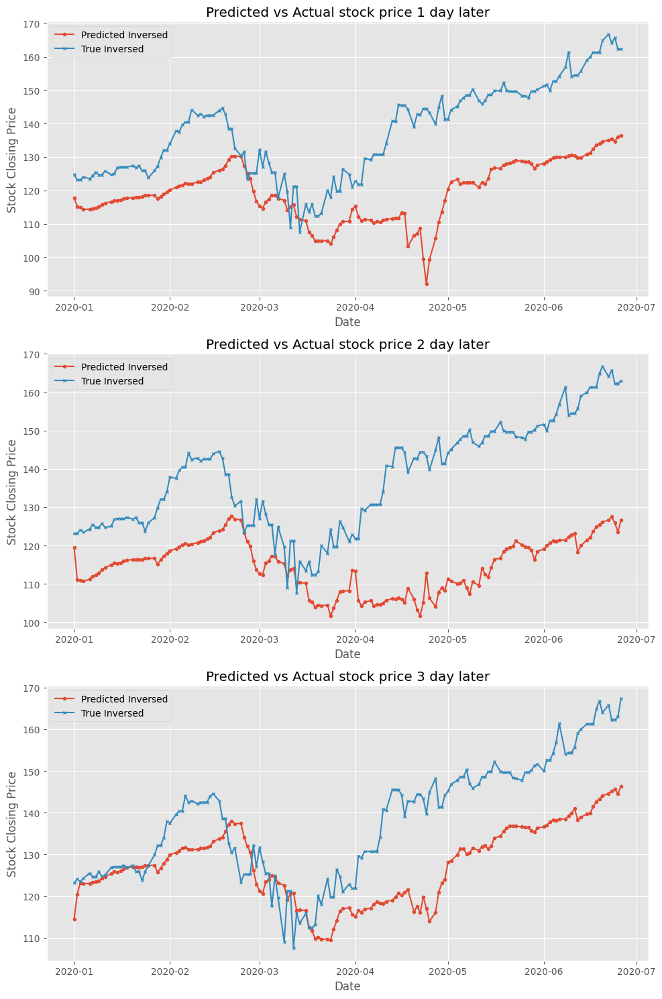

In [ ]:
# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 15))  # Create 3 subplots vertically


for i in range(3):  # Assuming 3 features
    axs[i].plot(Date_test, predicted_inversed[:, i], label='Predicted Inversed', marker='o', linestyle='-', markersize=3)
    axs[i].plot(Date_test, true_inversed[:, i], label='True Inversed', marker='x', linestyle='-', markersize=3)
    axs[i].set_title(f'Predicted vs Actual stock price {i+1} day later')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Stock Closing Price')
    axs[i].legend()

plt.tight_layout()
plt.show()


#### For Google Temporal Fusion Transformer

##### Data prep for TFT using TimeSeriesDataSet class from Lightning Pytorch

In [ ]:
# X = df_merged.drop(columns=['NFLX_Sentiment Label', 'AAPL_Sentiment Label', 'MSFT_Sentiment Label', 'AMZN_Sentiment Label' , 'ticker'])
# y = df_merged['Close']
max_prediction_length = 3
max_encoder_length = 10

# Convert the 'Date' column to datetime format
X_initial_tft['Date'] = pd.to_datetime(X_initial_tft['Date'])

# Calculate the difference in days from the minimum date
X_initial_tft['time_idx'] = (X_initial_tft['Date'] - X_initial_tft['Date'].min()).dt.days


# Creating a constant column
X_initial_tft['group_id'] = 'group'

# X_initial_tft.head()
# X_initial_tft.tail()

X_initial_tft_train = X_initial_tft.loc[0:4546]
X_initial_tft_val = X_initial_tft.loc[(4547 - max_encoder_length) : 5348]
X_initial_tft_test = X_initial_tft.loc[(5349 - max_encoder_length) : 5505]


print(len(X_initial_tft))
print(len(X_initial_tft_train))
print(len(X_initial_tft_val))

6754
4546
812


In [ ]:
training_cutoff = X_initial_tft_train["time_idx"].max() - max_prediction_length


dataset = TimeSeriesDataSet(
    X_initial_tft_train,
    group_ids=['group_id'],
    target="Close",
    time_idx="time_idx",
    min_encoder_length=max_encoder_length,
    max_encoder_length=max_encoder_length,
    min_prediction_length=3,
    max_prediction_length=3,
    time_varying_known_reals=[],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=['20_day_SMA', 'RSI', 'ROC', 'Volatility', 'T10Y2Y',
       'CCSA', 'DGORDER', 'NFLX_Sentiment Score', 'AAPL_Sentiment Score',
       'MSFT_Sentiment Score', 'AMZN_Sentiment Score', 'RF_positive_count',
       'RF_total_positive_score', 'RF_negative_count',
       'RF_total_negative_score', 'RF_count', 'RF_avg_sentiment_score',
       'MDA_positive_count', 'MDA_total_positive_score', 'MDA_negative_count',
       'MDA_total_negative_score', 'MDA_count', 'MDA_avg_sentiment_score', "Open", "High", "Low", "Close", "Volume"],
    allow_missing_timesteps=True,
    add_relative_time_idx = True,
    add_target_scales=True,
    add_encoder_length=True,
    # time_varying_unknown_reals=["value"]
)


# create validation set (predict=True) which means to predict the last max_prediction_length points in time
# for each series
validation = TimeSeriesDataSet.from_dataset(dataset, X_initial_tft_val, predict=False, stop_randomization=True)

# create dataloaders for model
batch_size = 128  # set this between 32 to 128
train_dataloader = dataset.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, shuffle=False, drop_last=True, num_workers=0)

##### Hyperparameter tuning to find lr, Training model

In [ ]:
# configure network and trainer
pl.seed_everything(42)
trainer = pl.Trainer(
    accelerator="cpu",
    # clipping gradients is a hyperparameter and important to prevent divergance
    # of the gradient for recurrent neural networks
    gradient_clip_val=0.1,
)


tft = TemporalFusionTransformer.from_dataset(
    dataset,
    # not meaningful for finding the learning rate but otherwise very important
    learning_rate=0.03,
    hidden_size=8,  # most important hyperparameter apart from learning rate
    # number of attention heads. Set to up to 4 for large datasets
    attention_head_size=1,
    dropout=0.1,  # between 0.1 and 0.3 are good values
    hidden_continuous_size=8,  # set to <= hidden_size
    loss=RMSE(),
    optimizer="Ranger"
    # reduce learning rate if no improvement in validation loss after x epochs
    # reduce_on_plateau_patience=1000,
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/parsing.py:199: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/parsing.py:199: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.


Number of parameters in network: 17.1k


/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/utilities.py:73: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (29) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/data.py:104: Total length of `DataLoader` across ranks is zero. Please make sure this was your intention.


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=100` reached.
INFO: Learning rate set to 0.39810717055349754
INFO:lightning.pytorch.tuner.lr_finder:Learning rate set to 0.39810717055349754
INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/.lr_find_c9f25468-fef4-484a-a939-a6f77bdc10f8.ckpt
INFO:pytorch_lightning.utilities.rank_zero:Restored all states from the checkpoint at /content/.lr_find_c9f25468-fef4-484a-a939-a6f77bdc10f8.ckpt


suggested learning rate: 0.39810717055349754


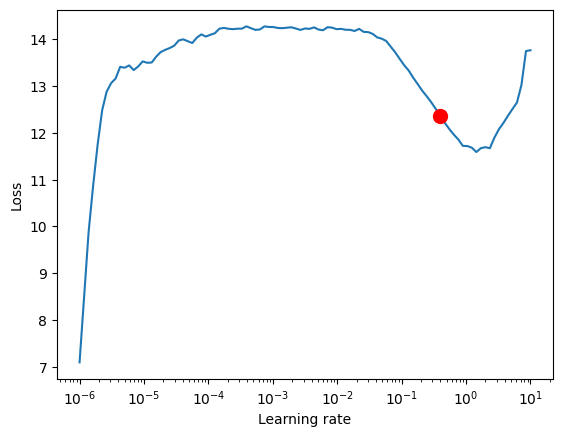

In [ ]:
# find optimal learning rate
# NOTE: Got error finding optimal learning rate?

res = Tuner(trainer).lr_find(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
    max_lr=10.0,
    min_lr=1e-6,
    early_stop_threshold=None
)



print(f"suggested learning rate: {res.suggestion()}")
fig = res.plot(show=True, suggest=True)
fig.show()

In [ ]:
# from pytorch_lightning.callbacks import ModelCheckpoint

val_dataset = TimeSeriesDataSet(
    X_initial_tft_val,
    time_idx="time_idx",
    target="Close",
    group_ids=["group_id"],
    min_encoder_length=max_encoder_length,  # Adjust as per your requirement
    max_encoder_length=max_encoder_length,
    min_prediction_length=max_prediction_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=[],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=['20_day_SMA', 'RSI', 'ROC', 'Volatility', 'T10Y2Y',
       'CCSA', 'DGORDER', 'NFLX_Sentiment Score', 'AAPL_Sentiment Score',
       'MSFT_Sentiment Score', 'AMZN_Sentiment Score', 'RF_positive_count',
       'RF_total_positive_score', 'RF_negative_count',
       'RF_total_negative_score', 'RF_count', 'RF_avg_sentiment_score',
       'MDA_positive_count', 'MDA_total_positive_score', 'MDA_negative_count',
       'MDA_total_negative_score', 'MDA_count', 'MDA_avg_sentiment_score', "Open", "High", "Low", "Close", "Volume"],
    allow_missing_timesteps=True,
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
)

# Convert the test dataset to a DataLoader
val_dataloader = val_dataset.to_dataloader(train=False, batch_size=batch_size, num_workers=0, shuffle=False)
print(f"Number of validation batches: {len(val_dataloader)}")

Number of validation batches: 6


In [ ]:
# configure network and trainer
early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=False, mode="min")
lr_logger = LearningRateMonitor()  # log the learning rate
logger = TensorBoardLogger("lightning_logs")  # logging results to a tensorboard

trainer = pl.Trainer(
    max_epochs=100,
    accelerator="cpu",
    enable_model_summary=True,
    gradient_clip_val=0.1,
    limit_train_batches=50,  # coment in for training, running valiation every 30 batches
    # fast_dev_run=True,  # comment in to check that networkor dataset has no serious bugs
    callbacks=[lr_logger, early_stop_callback],
    logger=logger,
)

# Note: learning rate should be adjusted based on recommended options from hyperparameter tuning
tft = TemporalFusionTransformer.from_dataset(
    dataset,
    learning_rate= res.suggestion(),
    hidden_size=16,
    attention_head_size=2,
    dropout=0.1,
    hidden_continuous_size=8,
    loss=MAE(),
    log_interval=10,  # uncomment for learning rate finder and otherwise, e.g. to 10 for logging every 10 batches
    optimizer="Ranger",
    reduce_on_plateau_patience=4,
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Number of parameters in network: 36.8k


/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/parsing.py:199: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/utilities/parsing.py:199: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.


In [ ]:
print(f"Train dataset length: {len(train_dataloader.dataset)}")
print(f"Validation dataset length: {len(val_dataloader.dataset)}")
print(f"Number of training batches: {len(train_dataloader)}")
print(f"Number of validation batches: {len(val_dataloader)}")

Train dataset length: 3815
Validation dataset length: 694
Number of training batches: 29
Number of validation batches: 6


In [ ]:
# fit network
trainer.fit(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,

)

INFO: 
   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | MAE                             | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 0     
3  | prescalers                         | ModuleDict                      | 512   
4  | static_variable_selection          | VariableSelectionNetwork        | 1.7 K 
5  | encoder_variable_selection         | VariableSelectionNetwork        | 20.7 K
6  | decoder_variable_selection         | VariableSelectionNetwork        | 528   
7  | static_context_variable_selection  | GatedResidualNetwork            | 1.1 K 
8  | static_context_initial_hidden_lstm | GatedResidualNetwork            | 1.1 K 
9  | static_context_initial_cell_lstm   | GatedResidualNetwork            

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (29) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

##### Load the best model according to the validation loss

In [ ]:
best_model_path = trainer.checkpoint_callback.best_model_path
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)

##### Determining accuracy on test dataset

In [ ]:
# Create a TimeSeriesDataSet for the test data

test_dataset = TimeSeriesDataSet(
    X_initial_tft_test,
    time_idx="time_idx",
    target="Close",
    group_ids=["group_id"],
    min_encoder_length=max_encoder_length,  # Adjust as per your requirement
    max_encoder_length=max_encoder_length,
    min_prediction_length=max_prediction_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=[],
    time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=['20_day_SMA', 'RSI', 'ROC', 'Volatility', 'T10Y2Y',
       'CCSA', 'DGORDER', 'NFLX_Sentiment Score', 'AAPL_Sentiment Score',
       'MSFT_Sentiment Score', 'AMZN_Sentiment Score', 'RF_positive_count',
       'RF_total_positive_score', 'RF_negative_count',
       'RF_total_negative_score', 'RF_count', 'RF_avg_sentiment_score',
       'MDA_positive_count', 'MDA_total_positive_score', 'MDA_negative_count',
       'MDA_total_negative_score', 'MDA_count', 'MDA_avg_sentiment_score', "Open", "High", "Low", "Close", "Volume"],
    allow_missing_timesteps=True,
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
)


# Convert the test dataset to a DataLoader
test_dataloader = test_dataset.to_dataloader(train=False, batch_size=batch_size, num_workers=0, shuffle=False)

# Now, use the trained model to make predictions on the test set
predictions = trainer.test(
    best_tft,
    dataloaders=test_dataloader,
)

pred = best_tft.predict(
    test_dataloader,
    mode = "raw",
    return_x = True)

# print(pred)

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_MAE          │     5.182219505310059     │
│         test_MAPE         │    0.03988664597272873    │
│         test_RMSE         │     7.328929424285889     │
│        test_SMAPE         │   0.039136309176683426    │
│         test_loss         │     5.182219505310059     │
└───────────────────────────┴───────────────────────────┘

In [ ]:
decoder_time_idx = pred.x['decoder_time_idx']

time_idx_list_1 = decoder_time_idx[:,0].numpy()
time_idx_list_2 = decoder_time_idx[:,1].numpy()
time_idx_list_3 = decoder_time_idx[:,2].numpy()


filtered_df_true_1_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_1)]['Date']
filtered_df_true_2_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_2)]['Date']
filtered_df_true_3_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_3)]['Date']

concatenated_array_true_date = [filtered_df_true_1_date, filtered_df_true_2_date, filtered_df_true_3_date]
# print(concatenated_array_true_date)

filtered_df_true_1_close = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_1)]['Close']
filtered_df_true_2_close = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_2)]['Close']
filtered_df_true_3_close = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_list_3)]['Close']

concatenated_array_true = [filtered_df_true_1_close, filtered_df_true_2_close, filtered_df_true_3_close]
# print(concatenated_array_true)

In [ ]:
time_idx_np = decoder_time_idx.numpy()  # Convert time_idx tensor to numpy array
true_values_np = X_initial_tft_test['Close'].to_numpy()  # Convert true values tensor to numpy array
predicted_values_np = pred.output.prediction.numpy().squeeze()  # Convert predicted values tensor to numpy array

# This gives you an idea of whether duplicate time_idx values are causing the discrepancy

print(time_idx_np.shape)
print(predicted_values_np.shape)

filtered_df_predicted_1_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,0])]['Date']
filtered_df_predicted_2_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,1])]['Date']
filtered_df_predicted_3_date = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,2])]['Date']


concatenated_array_date = [filtered_df_predicted_1_date, filtered_df_predicted_2_date, filtered_df_predicted_3_date]


filtered_df_predicted_1 = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,0])]
filtered_df_predicted_2 = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,1])]
filtered_df_predicted_3 = X_initial_tft_test[X_initial_tft_test['time_idx'].isin(time_idx_np[:,2])]


indexes_predicted_1 = np.nonzero(np.isin(time_idx_np[:,0], filtered_df_predicted_1['time_idx']).flatten())[0]
indexes_predicted_2 = np.nonzero(np.isin(time_idx_np[:,1], filtered_df_predicted_2['time_idx']).flatten())[0]
indexes_predicted_3 = np.nonzero(np.isin(time_idx_np[:,2], filtered_df_predicted_3['time_idx']).flatten())[0]

# print(len(indexes_predicted_1))

filtered_predicted_values_np_1 = predicted_values_np[indexes_predicted_1][:,0]
filtered_predicted_values_np_2 = predicted_values_np[indexes_predicted_2][:,1]
filtered_predicted_values_np_3 = predicted_values_np[indexes_predicted_3][:,2]


# Convert each 1D array to a 2D array of shape (819, 1)
filtered_predicted_values_np_1_2d = np.expand_dims(filtered_predicted_values_np_1, axis=1)
filtered_predicted_values_np_2_2d = np.expand_dims(filtered_predicted_values_np_2, axis=1)
filtered_predicted_values_np_3_2d = np.expand_dims(filtered_predicted_values_np_3, axis=1)


# Concatenate the arrays to get a shape of (819, 3)
concatenated_array = []
concatenated_array = [filtered_predicted_values_np_1, filtered_predicted_values_np_2, filtered_predicted_values_np_3]

# Print the shape to confirm
print(concatenated_array[0][-5:])
print(concatenated_array[1][-5:])
print(concatenated_array[2][-5:])

(132, 3)
(132, 3)
[160.72205 161.29306 161.89911 162.41165 162.59598]
[161.46632 161.79536 161.98686 162.41063 162.31345]
[162.10641 162.31882 162.28189 162.24277 162.2477 ]


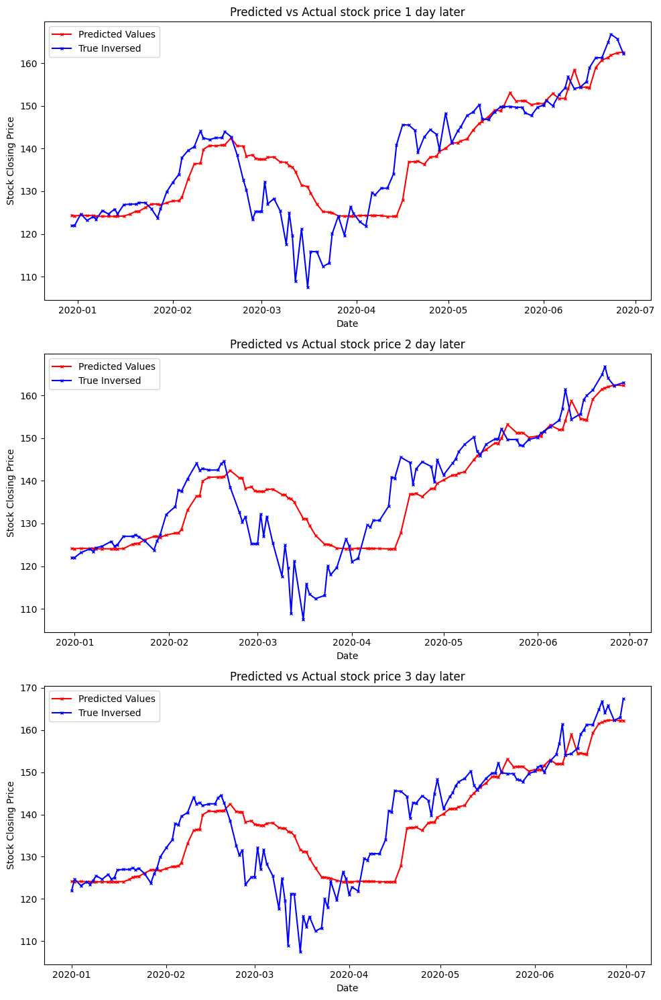

In [ ]:
# Convert your tensors to numpy arrays (assuming they are already tensors)

# Plotting
fig, axs = plt.subplots(3, 1, figsize=(10, 15))  # Create 3 subplots vertically


for i in range(3):  # Assuming 3 features
    axs[i].plot(concatenated_array_date[i], concatenated_array[i], label='Predicted Values', marker='x', linestyle='-', color='red', markersize=3)
    axs[i].plot(concatenated_array_true_date[i], concatenated_array_true[i], label='True Inversed', marker='x', linestyle='-', markersize=3, color = "blue")
    axs[i].set_title(f'Predicted vs Actual stock price {i+1} day later')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Stock Closing Price')
    axs[i].legend()

plt.tight_layout()
plt.show()

In [ ]:
concatenated_array_true = [np.array(subarray) for subarray in concatenated_array_true]

concatenated_array_true_date_final = concatenated_array_true_date.copy()
for i, series in enumerate(concatenated_array_true_date_final):
    concatenated_array_true_date_final[i] = series - pd.Timedelta(days=i+1)


In [ ]:
# Create a dictionary to store the data for prediction
data_dict = {}

for index, d in enumerate(concatenated_array_date):
    for date_idx, date in enumerate(d):
        if date not in data_dict:
            # Initialize an empty list that will store values from all arrays for this date
            data_dict[date] = [None] * len(concatenated_array_date)
        # Insert the value in the correct position
        data_dict[date][index] = concatenated_array[index][date_idx]

# Create a list of dates and corresponding values for prediction data in final_pred_data
final_pred_data = []
for date, values in sorted(data_dict.items()):
    final_pred_data.append([date] + values)

# Define headers
headers_pred = ['Date'] + [f'Predicted_values_from_{i}_day_back' for i in range(len(concatenated_array))]


# Create a dictionary to store the data for prediction
data_dict = {}

for index, d in enumerate(concatenated_array_true_date_final):
    for date_idx, date in enumerate(d):
        if date not in data_dict:
            # Initialize an empty list that will store values from all arrays for this date
            data_dict[date] = [None] * len(concatenated_array_true_date_final)
        # Insert the value in the correct position
        data_dict[date][index] = concatenated_array_true[index][date_idx]

# Create a list of dates and corresponding values for prediction data in final_pred_data
final_true_data = []
for date, values in sorted(data_dict.items()):
    final_true_data.append([date] + values)

# Define headers
headers_true = ['Date'] + [f'True_values_from_{i}_day_back' for i in range(len(concatenated_array_true))]


# print(final_pred_data)
# print(final_true_data)

In [ ]:
# Convert arrays to DataFrames
columns = ['date', '+1 timestep', '+2 timestep', '+3 timestep']
df_pred = pd.DataFrame(final_pred_data, columns=columns)
df_true = pd.DataFrame(final_true_data, columns=columns)

# Convert date columns to datetime and data columns to numeric
df_pred['date'] = pd.to_datetime(df_pred['date'])
df_true['date'] = pd.to_datetime(df_true['date'])
for col in columns[1:]:
    df_pred[col] = pd.to_numeric(df_pred[col], errors='coerce')
    df_true[col] = pd.to_numeric(df_true[col], errors='coerce')

# Stack and dropna to filter out None or NaN entries
stacked_pred = df_pred.set_index('date')[columns[1:]].stack(dropna=True)
stacked_true = df_true.set_index('date')[columns[1:]].stack(dropna=True)

# Align predictions and true values by their index (date and timestep)
aligned_data = pd.DataFrame({'pred': stacked_pred, 'true': stacked_true}).dropna()

# Calculate combined MSE, RMSE, and R^2
mse = mean_squared_error(aligned_data['true'], aligned_data['pred'])
rmse = np.sqrt(mse)
r2_value = r2_score(aligned_data['true'], aligned_data['pred'])

print(f"Combined MSE: {mse}")
print(f"Combined RMSE: {rmse}")
print(f"Combined R^2: {r2_value}")

Combined MSE: 85.08650701989721
Combined RMSE: 9.224234766087495
Combined R^2: 0.5677386323071428
